# Recherche arborescente de Monte-Carlo

CSI 4106 - automne 2026

Marcel Turcotte  
Version: août 9, 2026 12h46

# Préambule

## Message du jour

![](https://media.nature.com/w1248/magazine-assets/d41586-025-03624-1/d41586-025-03624-1_51664916.jpg?as=webp)

[‘Mind-captioning’ AI decodes brain activity to turn thoughts into
text](https://www.nature.com/articles/d41586-025-03624-1), Nature News,
2025-11-05.

Bref résumé (généré par gtp-5-mini le 21 novembre 2025) :

- Ce que c’est : « mind-captioning » est une technique qui décode
  l’activité cérébrale pour générer des phrases descriptives de ce
  qu’une personne voit ou imagine.
- Principe de fonctionnement : les chercheurs ont utilisé un modèle de
  langage profond pour convertir les légendes de plus de 2 000 vidéos en
  « empreintes sémantiques » numériques, puis ont entraîné un modèle
  distinct pour associer les schémas d’imagerie cérébrale de six
  participants (lorsqu’ils regardaient ou se remémoraient des vidéos) à
  ces empreintes.
- Principales conclusions : la méthode permet de retrouver du contenu
  descriptif à la fois à partir de la perception et de la mémoire,
  offrant des indices sur la manière dont le cerveau représente le sens
  avant la production du langage.
- Applications potentielles : pourrait aider les personnes présentant
  des troubles du langage à communiquer et faire progresser la
  compréhension des représentations neuronales de la pensée.
- Risques et mises en garde : les méthodes antérieures ont parfois
  confondu le langage généré par les modèles avec le contenu cérébral ;
  cette approche vise à relier les schémas cérébraux à des empreintes
  sémantiques préexistantes. Le travail soulève de graves problèmes de
  vie privée mentale (surveillance, manipulation, discrimination) à
  mesure que le décodage du contenu de la pensée devient plus précis.

## Objectifs d’apprentissage

- **Expliquer** le concept et les étapes clés de la recherche
  arborescente de Monte-Carlo (MCTS).
- **Comparer** MCTS avec d’autres algorithmes de recherche tels que BFS,
  DFS, $A^\star$, le recuit simulé et les algorithmes génétiques.
- **Analyser** comment MCTS équilibre exploration et exploitation en
  utilisant la formule UCB1.
- **Implémenter** MCTS dans des applications pratiques comme le
  Tic-Tac-Toe.

# Introduction

## Recherche arborescente de Monte Carlo

Dans la présentation d’introduction sur la **recherche d’espace
d’états**, j’ai utilisé la **recherche arborescente de Monte Carlo
(MCTS)**, un élément clé d’**AlphaGo**, pour illustrer le rôle des
algorithmes de recherche dans le raisonnement.

Aujourd’hui, nous concluons cette série en examinant les détails
d’implémentation de cet algorithme.

*MCTS = Monte Carlo Tree Search*

## Applications

- Conception de **médicaments de novo**
- Routage de **circuits électroniques**
- Surveillance de la charge dans les **réseaux intelligents**
- Tâches de **maintien de voie** et de dépassement
- Planification de mouvement dans la **conduite autonome**
- Résolution même du **problème du voyageur de commerce**

**Voir** : Kemmerling et al. (2024)

L’article de Kemmerling et ses collègues, (Kemmerling et al. 2024),
illustre la vaste gamme d’applications pour MCTS lorsqu’il est combiné
avec des réseaux neuronaux profonds.

## Applications (suite)

Voir aussi Besta et al. (2025) sur le rôle de MTCS dans les modèles de
langage de raisonnement (RLMs).

## Notes historiques

- **2008** : l’algorithme est introduit dans le contexte du **jeu d’IA**
  (Chaslot et al. 2008)
- **2016** : l’algorithme est combiné avec des **réseaux neuronaux
  profonds** pour créer **AlphaGo** (Silver et al. 2016)

## Définition

Un **algorithme de Monte Carlo** est une méthode computationnelle qui
utilise **l’échantillonnage aléatoire pour obtenir des résultats
numériques**, souvent utilisée pour l’optimisation, l’intégration
numérique et l’estimation de distribution de probabilité.

Il se caractérise par sa capacité à traiter des **problèmes complexes**
avec des solutions probabilistes, échangeant **exactitude** contre
**efficacité** et **évolutivité**.

Avez-vous déjà rencontré le terme “**algorithme de Monte Carlo**”?

Avez-vous déjà rencontré le terme “algorithme de Monte Carlo”? Si oui,
veuillez fournir des exemples représentatifs de méthodes de Monte Carlo.

L’intégration de Monte Carlo, qui consiste à approximer les intégrales
par échantillonnage aléatoire, est un exemple canonique des méthodes de
Monte Carlo.

La méthode tire $x \sim \mathrm{Uniform}(a,b)$, puis utilise $$
  \int_a^b f(x),dx \approx (b-a),\frac{1}{n}\sum_{i=1}^n f(X_i).
$$

Voir
<a href="#sec-numerical-integration" class="quarto-xref">Section 6.1</a>
pour des exemples de code source.

## Algorithme

Pour un nombre spécifié d’itérations (**simulations**) :

1.  **Sélection** (descente guidée de l’arbre)
2.  **Expansion** de noeud
3.  **Déroulement** (simulation)
4.  **Rétropropagation**

Un algorithme de Monte Carlo utilise l’échantillonnage aléatoire
(**simulations**) pour l’estimation de distribution de probabilité.

Notez que l’Étape 4, étiquetée “rétropropagation,” n’est pas la même que
l’algorithme de rétropropagation basé sur le gradient utilisé pour
entraîner les réseaux de neurones. MCTS ne calcule pas de gradients ni
n’effectue d’optimisation basée sur le gradient.

- **MCTS n’est pas un algorithme fixe unique**, de nombreuses variantes
  existent dans la littérature et en pratique.

- Les quatre étapes canoniques (**Sélection, Expansion, Simulation,
  Rétropropagation**) admettent **de multiples choix de conception** :

  - Les **stratégies d’expansion** varient largement :
    - *Expansion incrémentale* : ajouter **un** enfant par visite
      (courante dans l’UCT classique).
    - *Expansion complète* : ajouter **tous les enfants légaux** en une
      fois (courante dans certains moteurs de jeu).
  - Les **politiques de simulation** vont de jeux aléatoires purs à des
    déroulements guidés par des heuristiques.
  - Les **mises à jour de rétropropagation** peuvent utiliser des
    comptes de victoires, des valeurs moyennes, des probabilités a
    priori, ou des estimations de réseaux de valeurs.
  - **La persistance de l’arbre** peut être réinitialisée à chaque coup,
    persister dans un jeu, ou persister **à travers** les jeux.

**Implication :** MCTS doit être compris comme une *famille*
d’algorithmes — différentes implémentations peuvent se comporter très
différemment selon les règles d’expansion, de déroulement et de
sauvegarde.

## Algorithme

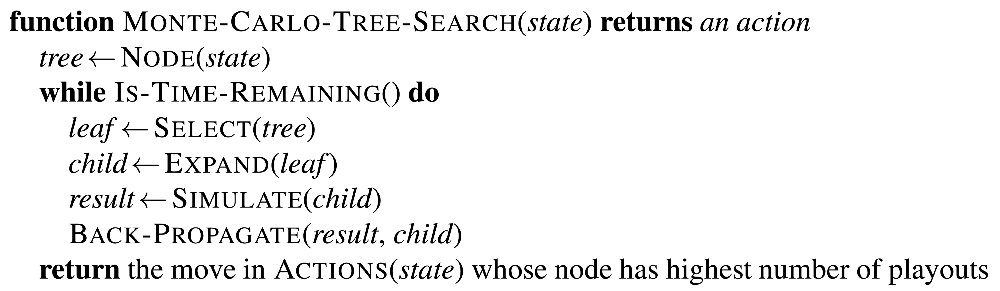

**Attribution** : Russell et Norvig (2020), Figure 5.11

## Algorithme à tout moment

**MCTS** est un exemple classique d’un *algorithme à tout moment*
(*any-time algorithm*) :

- Il peut être interrompu à tout moment.
- **Plus de temps** ⇒ **plus de simulations** ⇒ **meilleures estimations
  d’action**.
- Il renvoie *le meilleur coup actuel* compte tenu du nombre
  d’itérations effectuées.

C’est exactement ainsi qu’il est utilisé dans le Go, les échecs, Atari,
MuZero, etc. : s’exécuter jusqu’à ce que le budget de temps expire, puis
agir.

## Discussion

Comme d’autres algorithmes déjà abordés, tels que **BFS**, **DFS**, et
$A^\star$, la recherche arborescente de Monte Carlo (MCTS) maintient une
**frontière** de nœuds non développés.

Examiner la relation entre MCTS et les algorithmes de recherche
précédents offre des perspectives précieuses sur leurs similitudes et
différences, fournissant une excellente opportunité de synthétiser les
concepts clés.

## Discussion

Similaire à $A^\star$, la recherche arborescente de Monte Carlo (MCTS)
utilise une heuristique, appelée **politique**, pour déterminer le
**prochain nœud à développer**.

Cependant, dans $A^\star$, l’heuristique est typiquement une fonction
**statique** estimant le coût vers un objectif, tandis que dans MCTS, la
“politique” implique une évaluation **dynamique**.

Par “évaluation statique,” nous entendons une fonction qui produit le
même résultat pour un état donné, indépendamment du moment où la
fonction est appelée dans l’exécution du programme.

## Discussion

Semblable à **l’optimisation par recuit simulé** (*simulated annealing*)
et aux **algorithmes génétiques** (*genetic algorithms*), la recherche
arborescente de Monte Carlo (MCTS) intègre un mécanisme pour
**équilibrer** **exploration** et **exploitation**.

## Discussion

- La MCTS **exploite tous les nœuds visités** dans son **processus de
  prise de décision**, contrairement à $A^\star$, qui se concentre
  principalement sur la frontière actuelle.
- De plus, **la MCTS met à jour itérativement la valeur de ses nœuds en
  fonction des simulations**, alors que $A^\star$ utilise généralement
  une heuristique **statique**.

L’efficacité de la recherche arborescente de Monte Carlo (MCTS) pour
identifier les nœuds prometteurs s’améliore à mesure que le temps
d’exécution est prolongé. La comparaison entre le recuit simulé et la
MCTS sera réexaminée sous peu.

## Discussion

Contrairement aux algorithmes précédents avec des arbres de recherche
**implicites**, la MCTS construit une **structure d’arbre**
**explicite** pendant l’exécution.

Comme nous l’explorerons, la MCTS maintient **à la fois** des
représentations **explicites** et **implicites** de l’arbre de
recherche.

Alors que les algorithmes précédents impliquent souvent une structure
d’arbre de recherche sans la construire explicitement, la MCTS construit
et maintient explicitement une structure d’arbre pendant l’exécution.

Cet arbre explicite est utilisé pour enregistrer les résultats des
simulations et guider la prise de décision.

L’arbre explicite suit les états visités et leurs évaluations, tandis
que l’aspect implicite se réfère à l’expansion de l’arbre lors des
simulations.

## Étape par étape

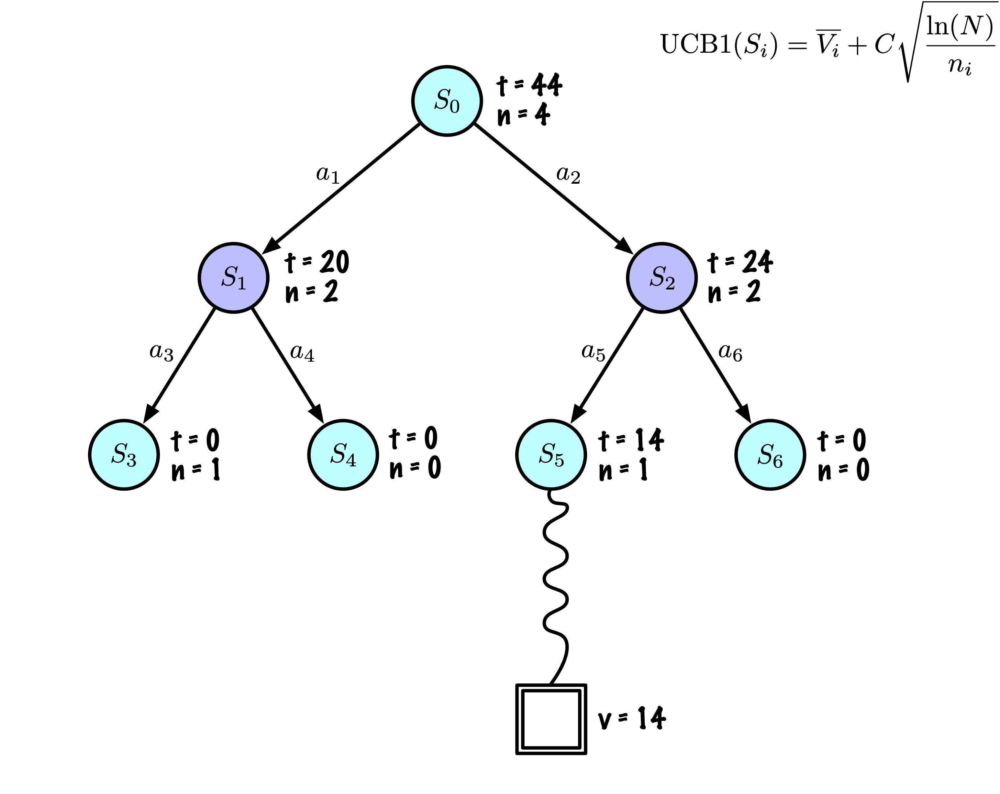

Adapté de : [Monte Carlo Tree Search](https://youtu.be/UXW2yZndl7U) par
John Levine publié sur YouTube le 2017-03-06.

Nous commençons par fournir un aperçu de l’exécution de l’algorithme,
suivi d’une analyse approfondie de ses composants individuels.

Le diagramme accompagnant illustre le fonctionnement de l’algorithme
après quatre itérations. Avant d’entrer dans les détails de chaque
itération, il est essentiel d’élucider les concepts fondamentaux.

Dans le diagramme, les nœuds bleus et violets représentent l’arbre de
recherche explicite construit par la recherche arborescente de Monte
Carlo (MCTS) au cours de chaque itération. Chaque nœud maintient un
enregistrement du nombre de visites et de son score cumulatif. Les
arêtes entre les nœuds sont annotées avec des actions. Par exemple, au
début de l’algorithme, deux actions sont disponibles. En sélectionnant
l’action $a_1$, deux actions supplémentaires deviennent accessibles.

L’algorithme utilise la formule UCB1 (*Upper Confidence Bound 1*) pour
sélectionner le nœud suivant à visiter, guidant ainsi le processus de
descente.

Lorsqu’il atteint un nœud feuille, l’algorithme effectue une simulation,
connue sous le nom de rollout, pour estimer l’utilité potentielle du
nœud.

## Étape par étape

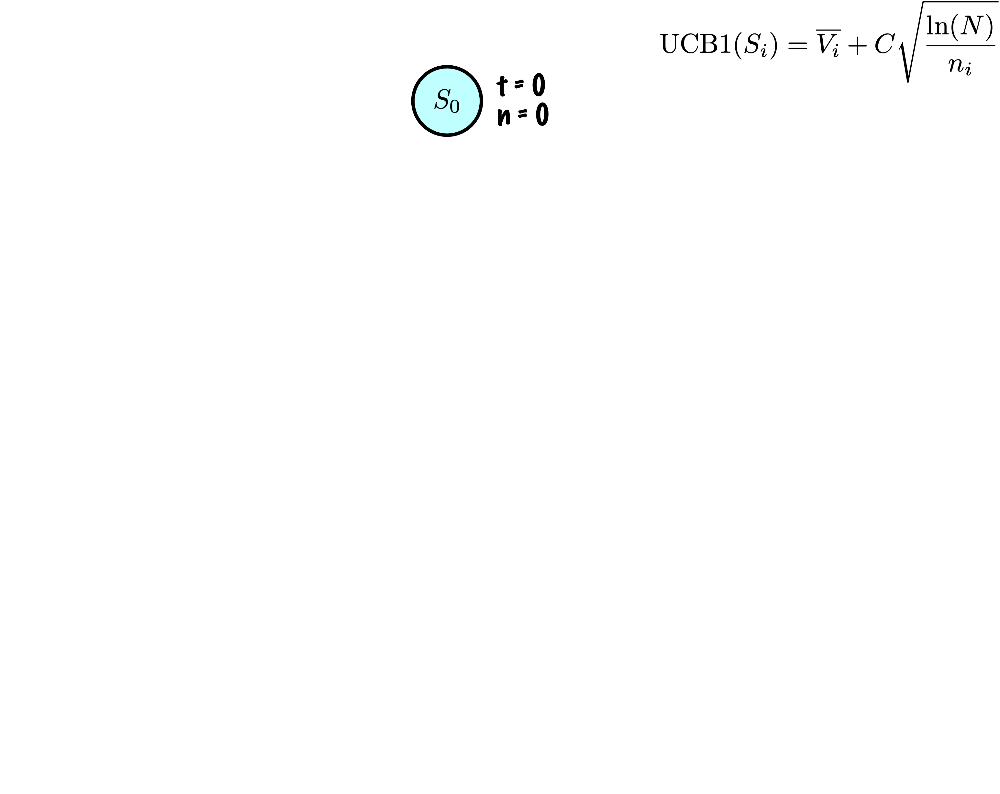

Chaque nœud garde une trace du nombre de visites ($n$) et d’un score
total ($t$).

$S_0$ est l’état initial.

## Étape par étape

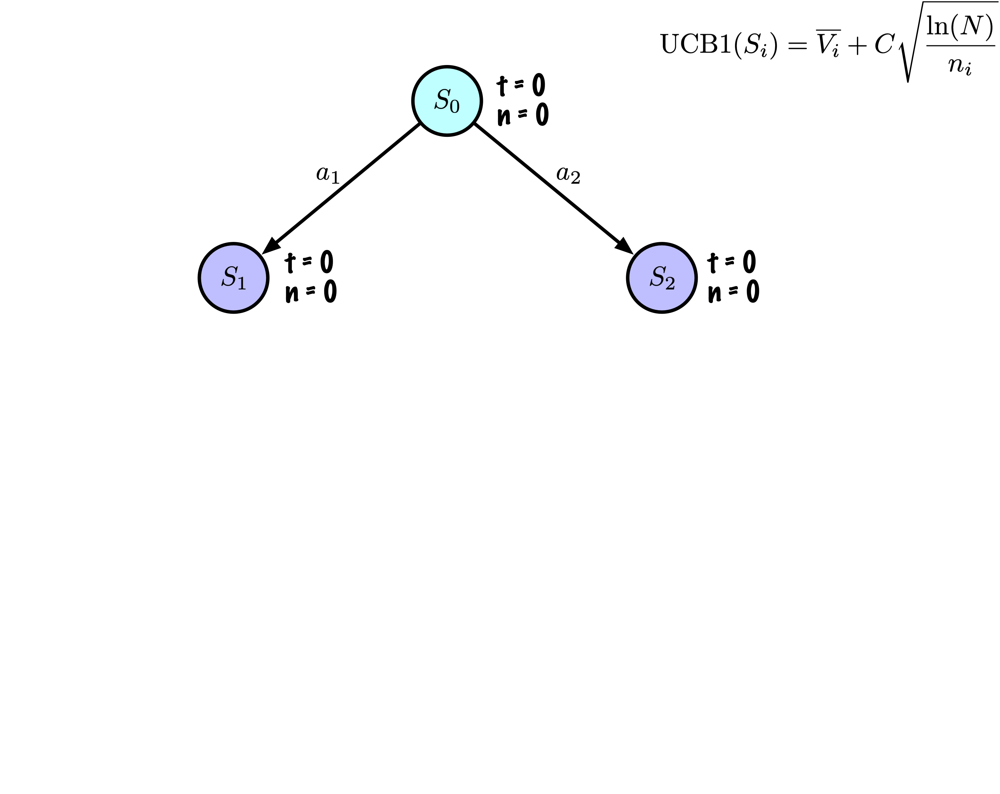

Ajout des actions disponibles, $a_1$ et $a_2$, ainsi que des états
correspondants, $S_1$ et $S_2$.

## Étape par étape (1.1)

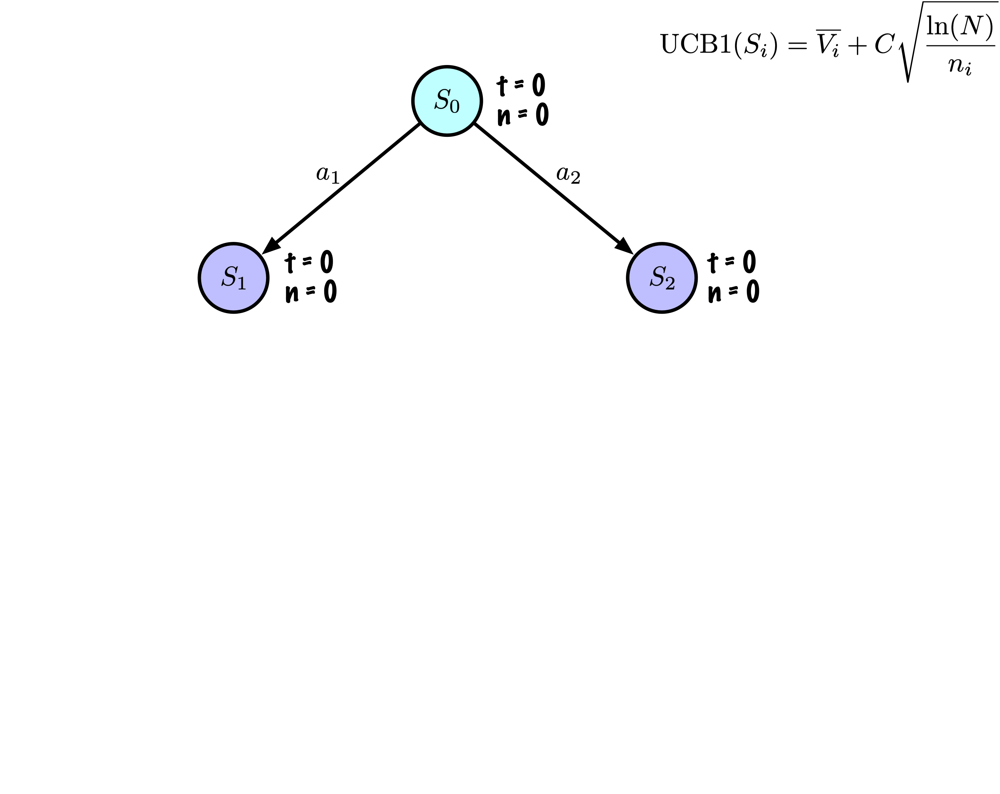

1.1 Début de la première itération : Étape de sélection.

## Étape par étape (1.1)

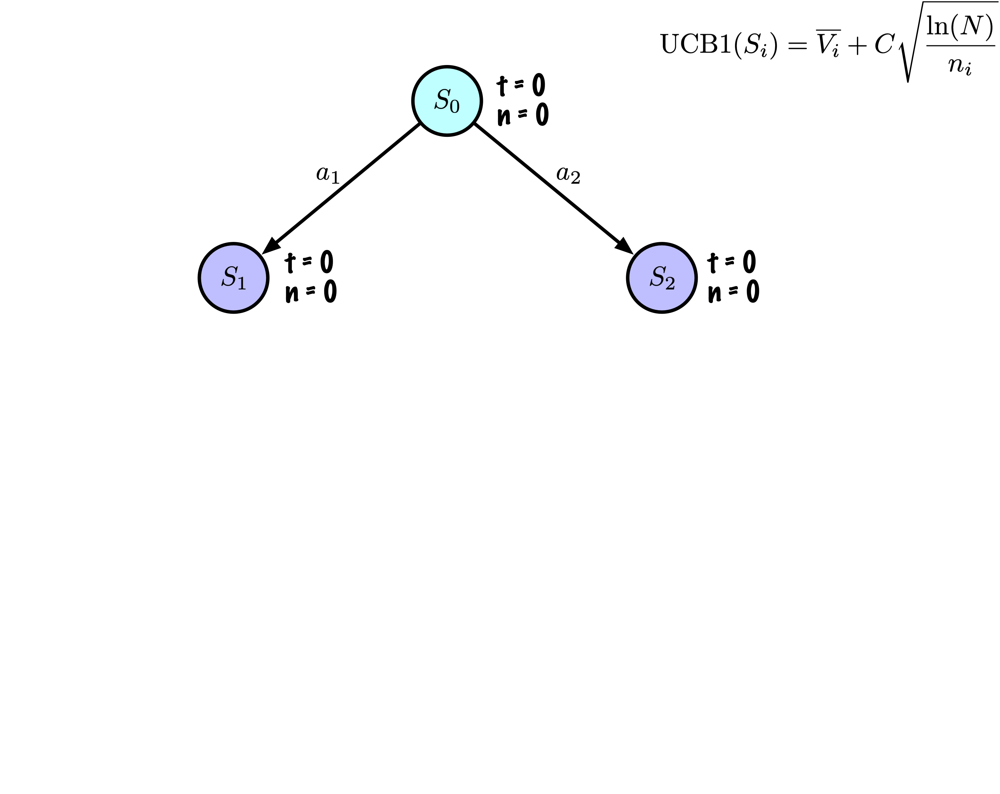

1.1 Le score UCB1 de $S_1$ et $S_2$ est $\infty$ puisque
$n_1 = n_2 = 0$.

Nous pouvons sélectionner l’un ou l’autre des nœuds.

## Étape par étape (1.1)

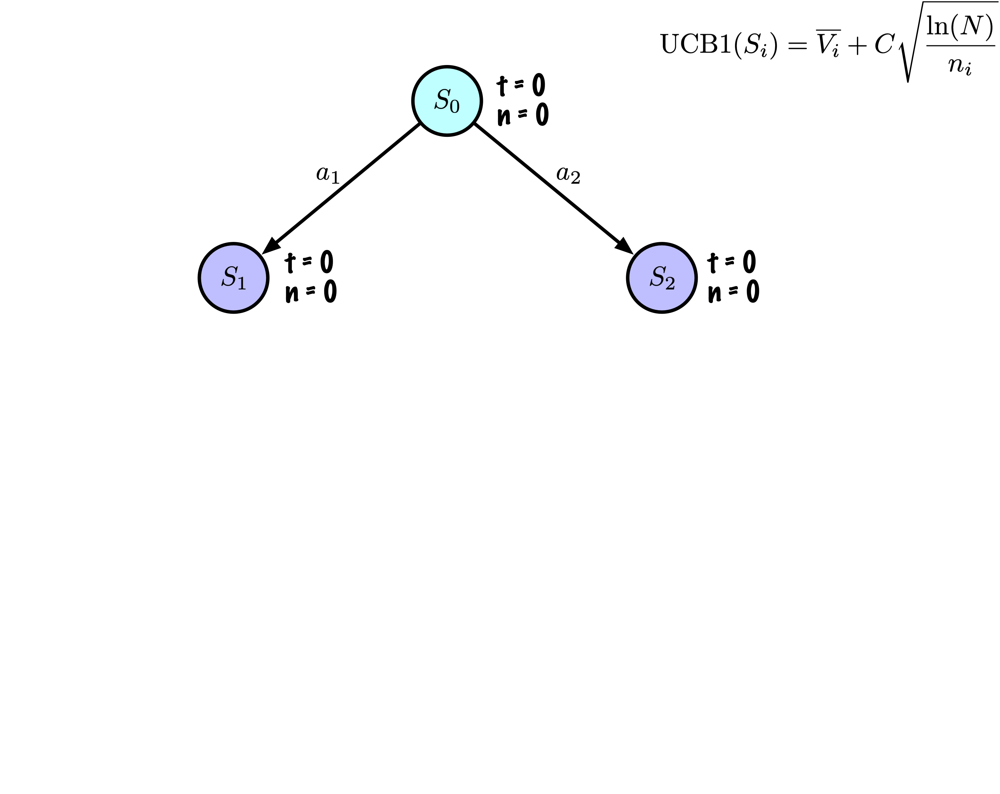

1.1 Nous avons atteint un nœud feuille, $S_1$.

## Étape par étape (1.2)

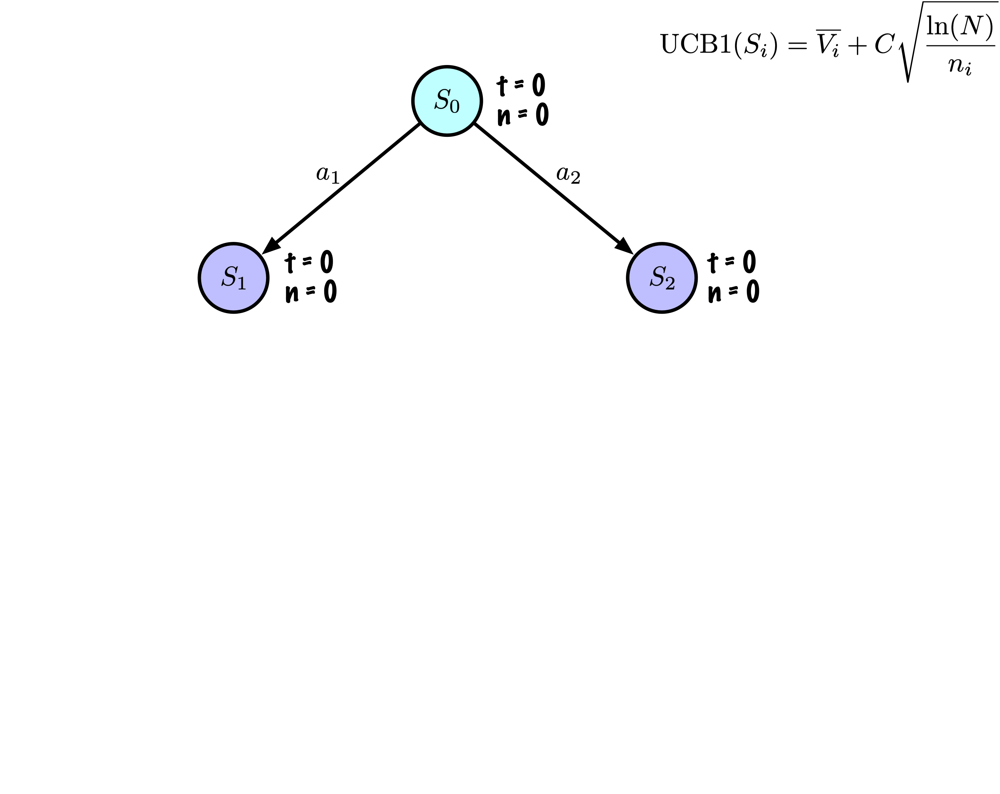

1.2 Expansion du nœud. Ce nœud n’a pas encore été visité. Par
conséquent, pas d’expansion.

Le statut non visité du nœud est indiqué par $n=0$. Avant d’expanser le
nœud, il est essentiel d’évaluer son utilité, ce qui est accompli par
une simulation dans l’étape suivante.

## Étape par étape (1.3)

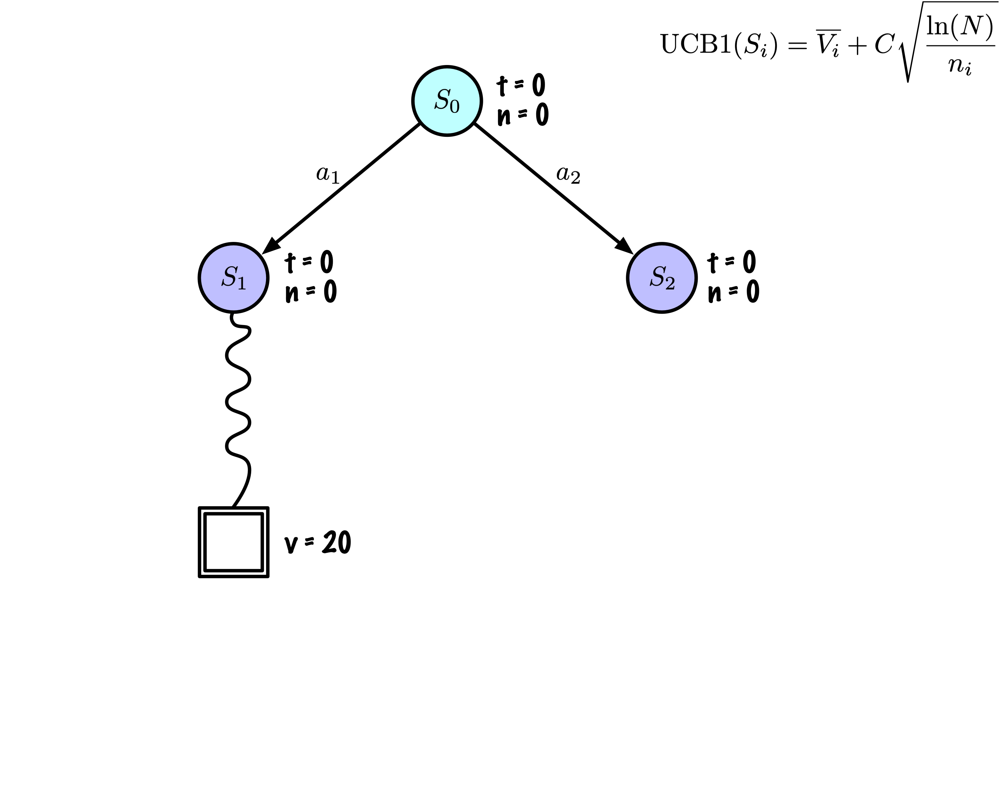

1.3 Un rollout (simulation) consiste simplement à sélectionner
aléatoirement des actions jusqu’à ce qu’un nœud terminal soit atteint.

Dans une simulation de rollout, l’algorithme sélectionne de manière
itérative des actions subséquentes jusqu’à atteindre un nœud terminal. À
ce stade, l’utilité de l’état résultant est évaluée
(`game.evaluate(state, player)`). Il est à noter que la trajectoire du
nœud sélectionné jusqu’à l’état terminal n’est pas suivie, comme
l’indique la ligne ondulée dans le diagramme.

Les simulations de rollout se poursuivent à partir du nœud sélectionné,
soit jusqu’à ce qu’un état terminal soit rencontré, soit jusqu’à ce
qu’une limite de profondeur prédéterminée soit atteinte. Dans ce dernier
cas, une fonction heuristique ou de valeur est utilisée pour évaluer
l’état.

## Étape par étape (1.4)

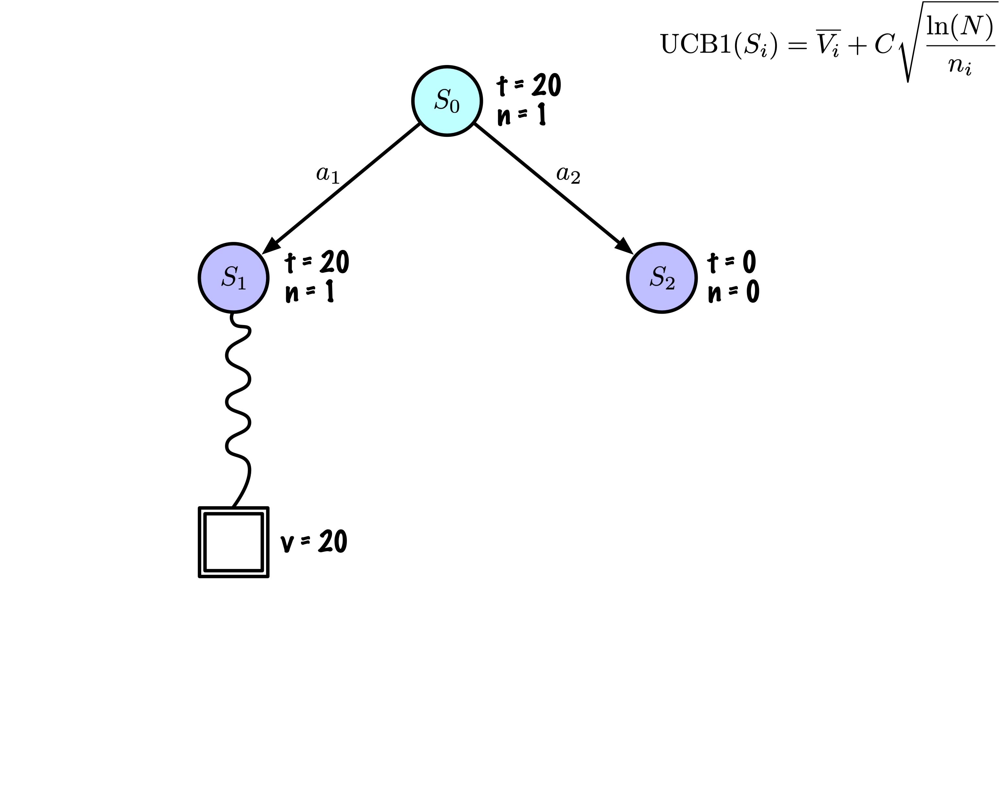

1.4 Rétropropagation.

## Étape par étape (1.Fin)

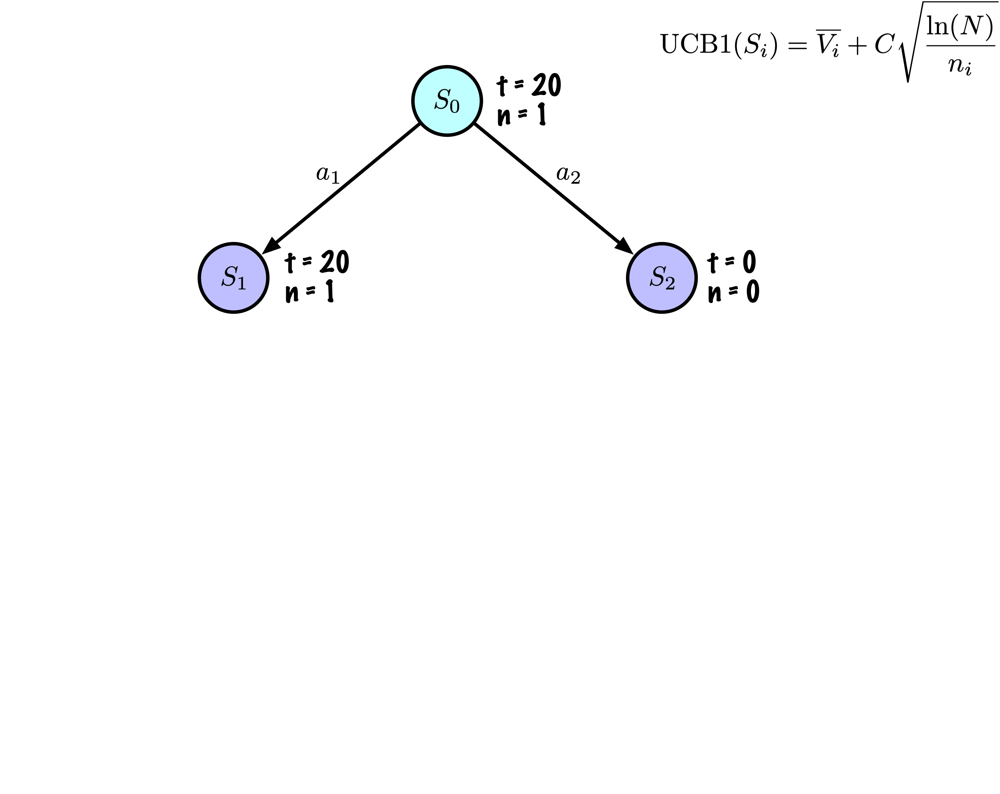

Fin de l’itération 1.

## Étape par étape (2.1)

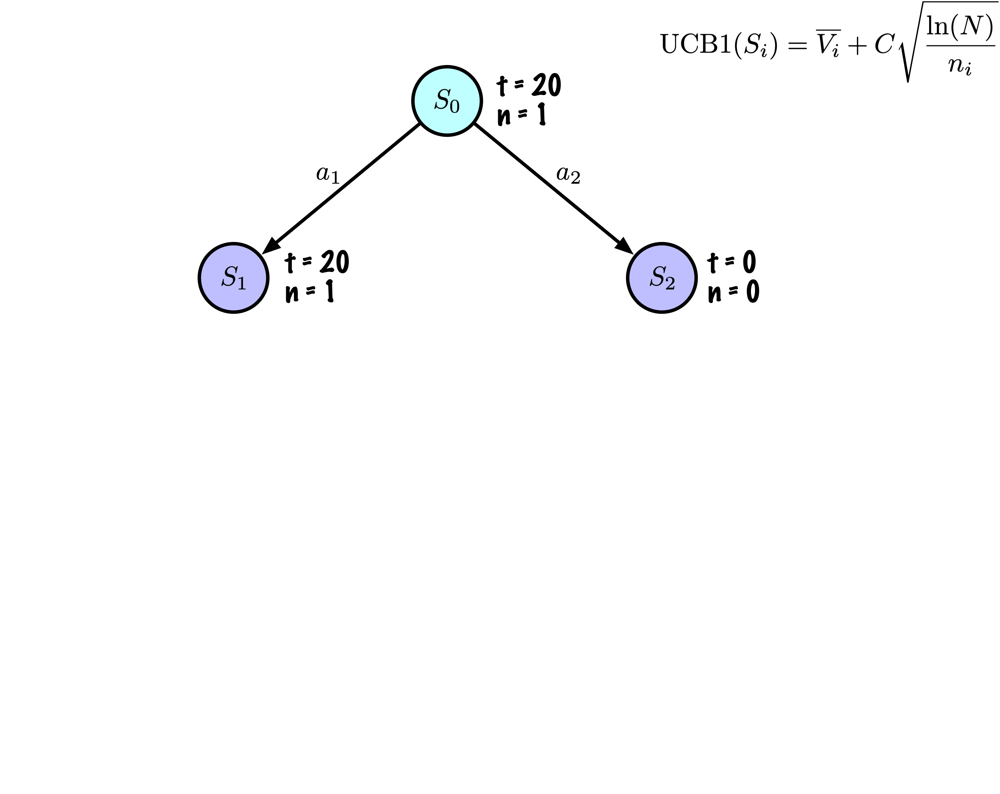

2.1 Sélection. Calcul de la valeur UCB1 de
$S_1 = 20 + 2 \sqrt{\frac{\ln(1)}{1}}$ et $S_2  = \infty$.

Nous sélectionnons $S_2$.

Pour déterminer la prochaine action, l’algorithme doit d’abord évaluer
les valeurs d’utilité de tous les nœuds enfants immédiats.

## Étape par étape (2.2)

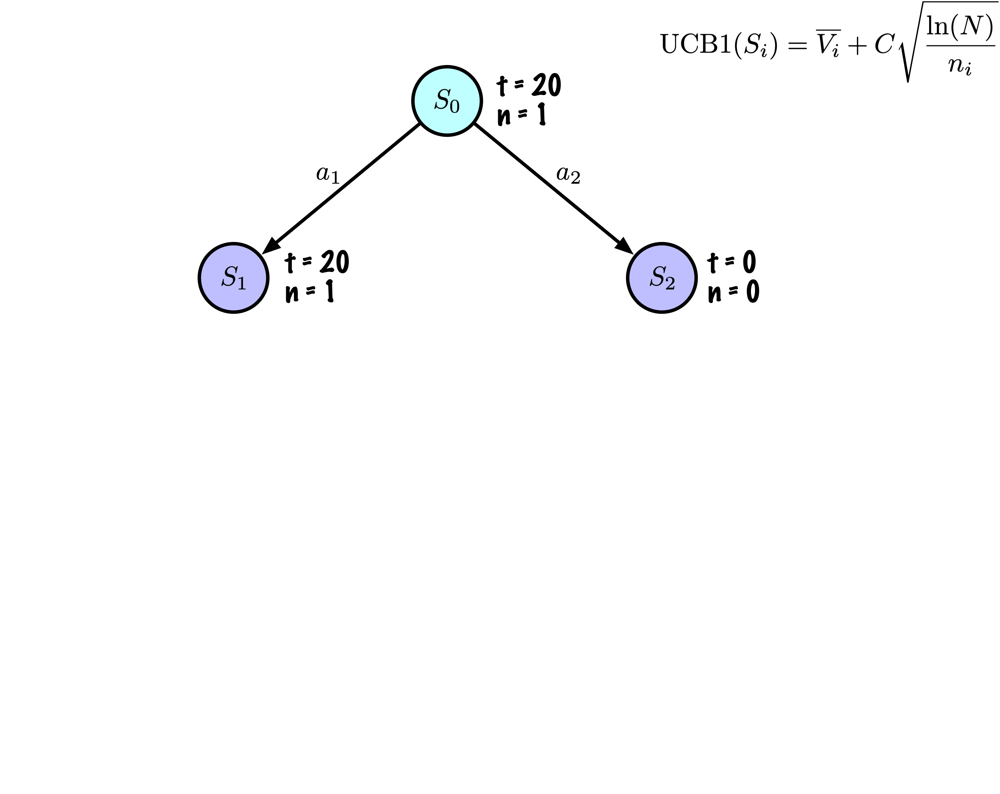

2.2 Expansion. Ce nœud n’a pas encore été visité. Par conséquent, pas
d’expansion.

## Étape par étape (2.3)

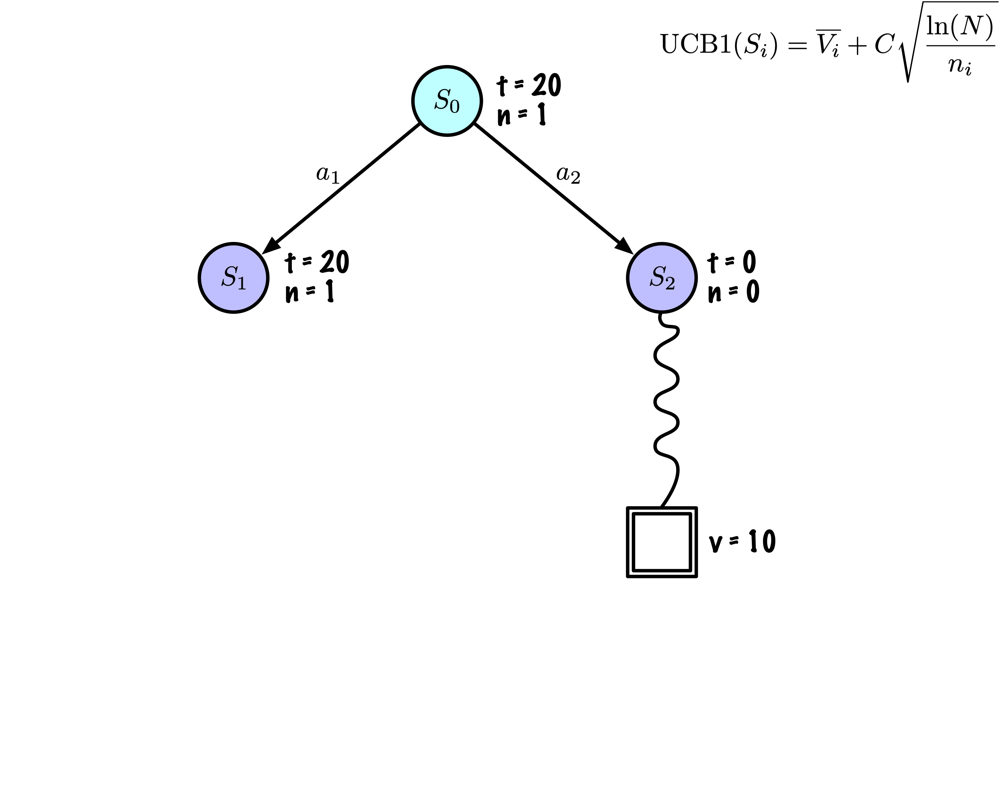

2.3 Déroulement.

## Étape par étape (2.4)

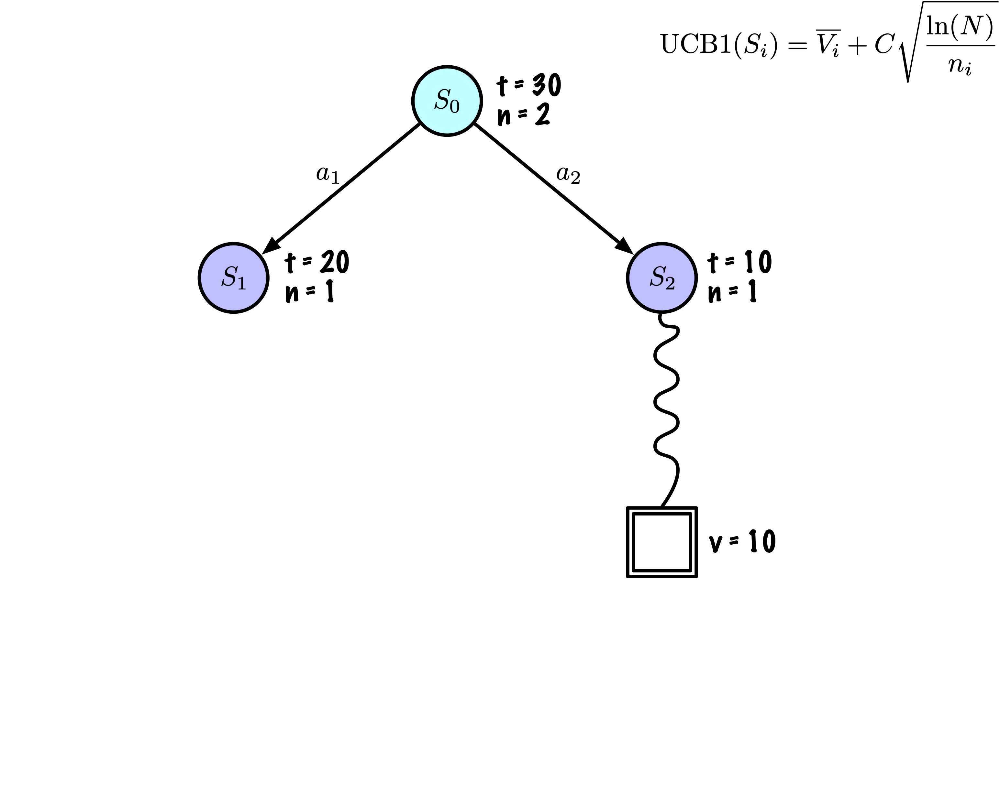

2.4 Rétropropagation.

## Étape par étape (2.Fin)

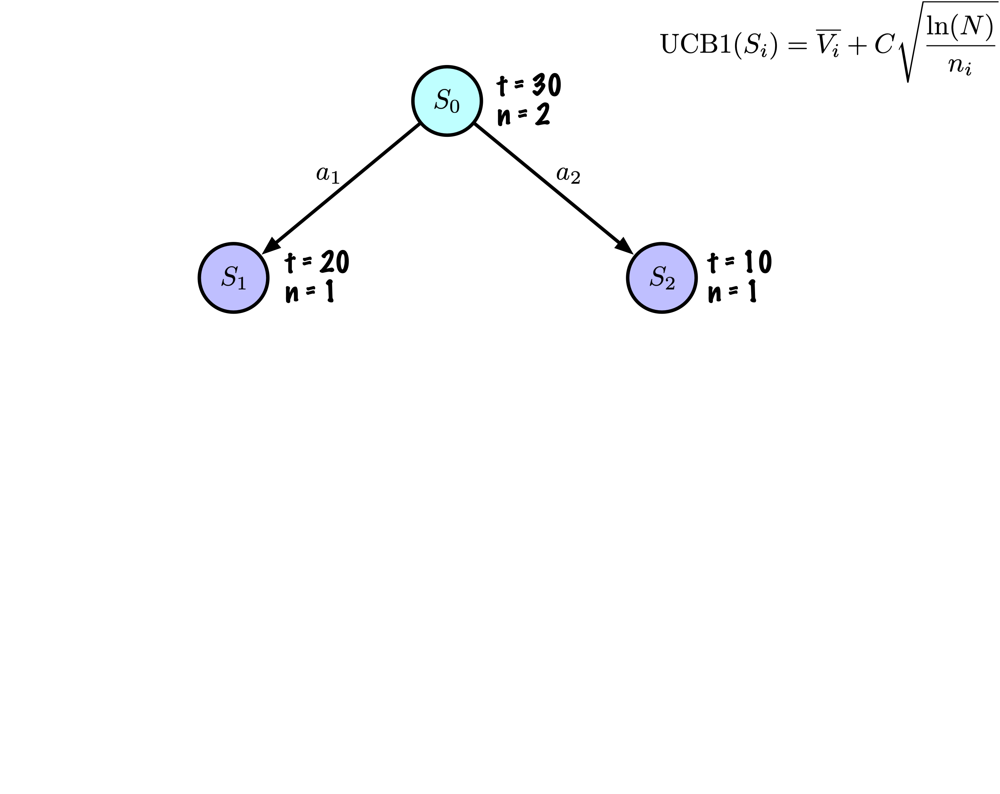

Fin de l’itération 2.

## Étape par étape (3.1)

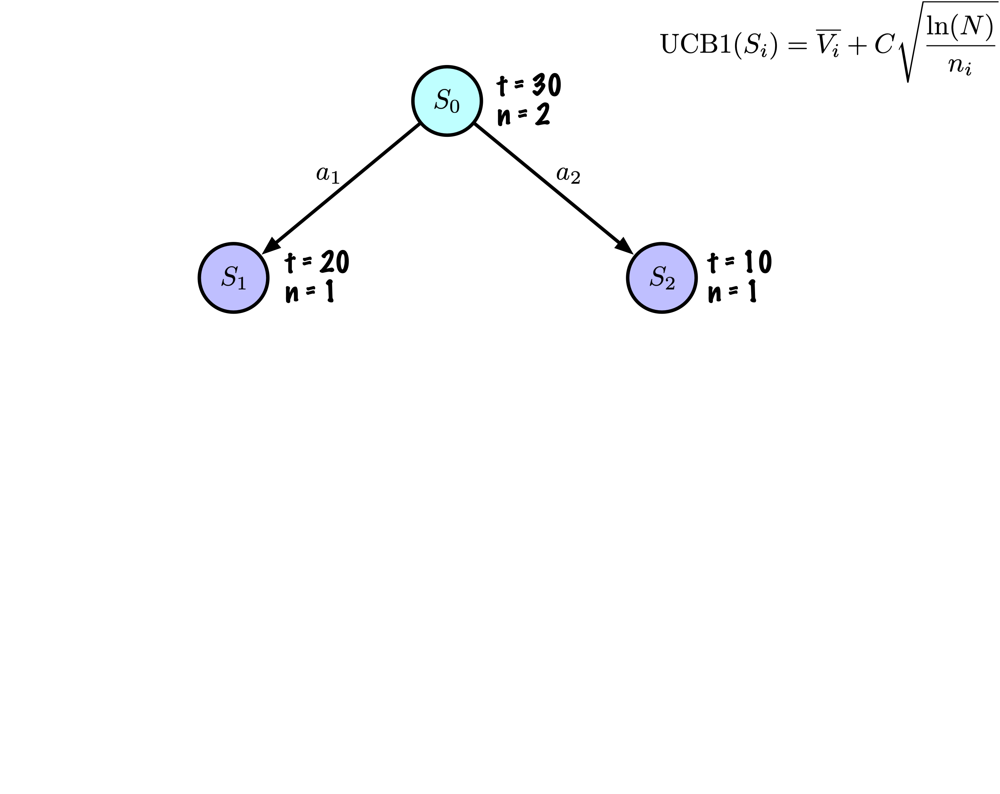

3.1 Sélection. Calcul des valeurs UCB1.

## Étape par étape (3.1)

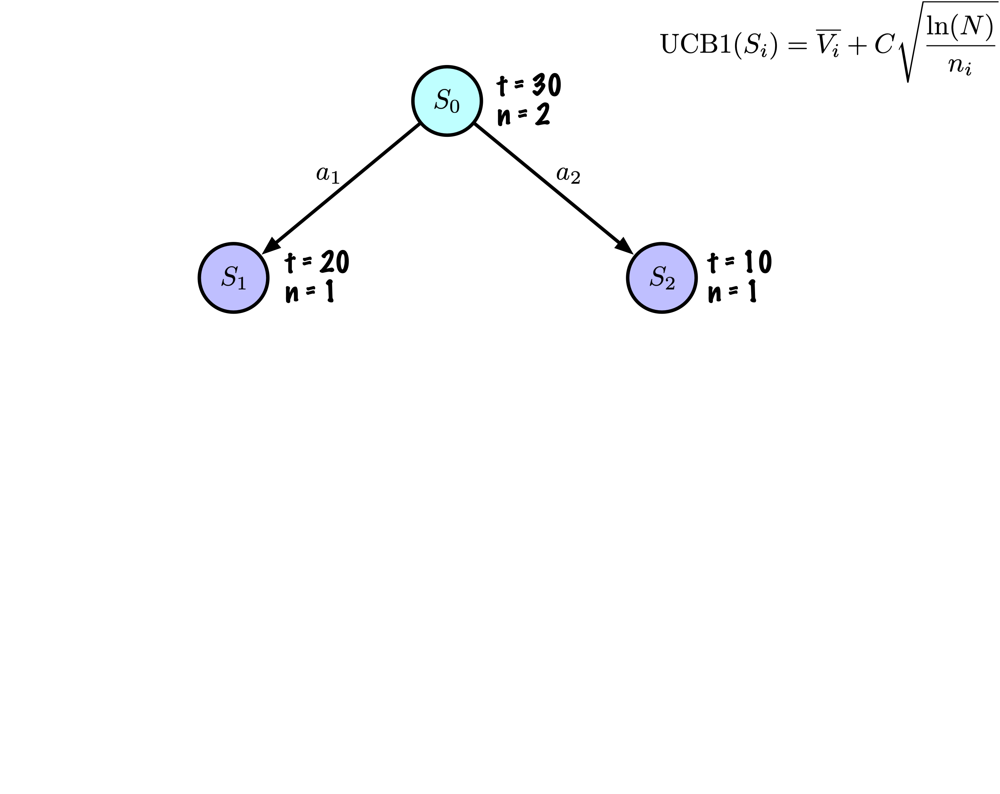

3.1 Sélection.

Calcul de la valeur UCB1 de
$S_1 = 20 + 2 \sqrt{\frac{\ln(2)}{1}} = 21,67$ et
$S_2 = 10 + 2 \sqrt{\frac{\ln(2)}{1}} = 11,67$.

Sélection de $S_1$

## Étape par étape (3.2)

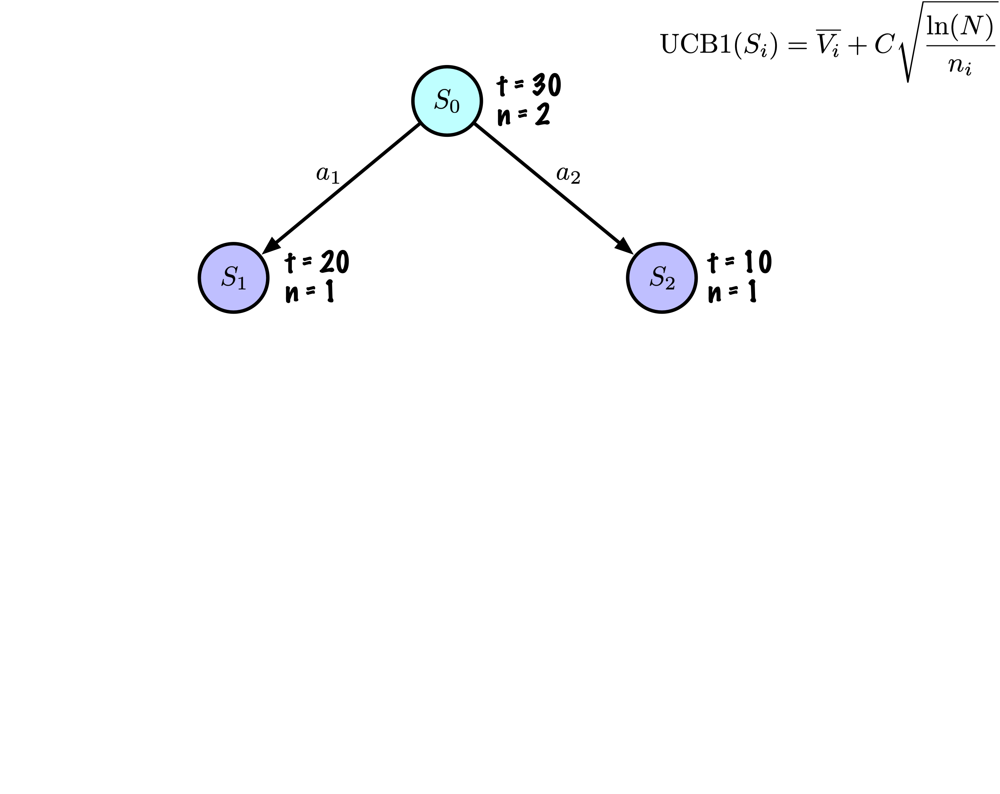

3.2 Expansion du nœud.

## Étape par étape (3.2)

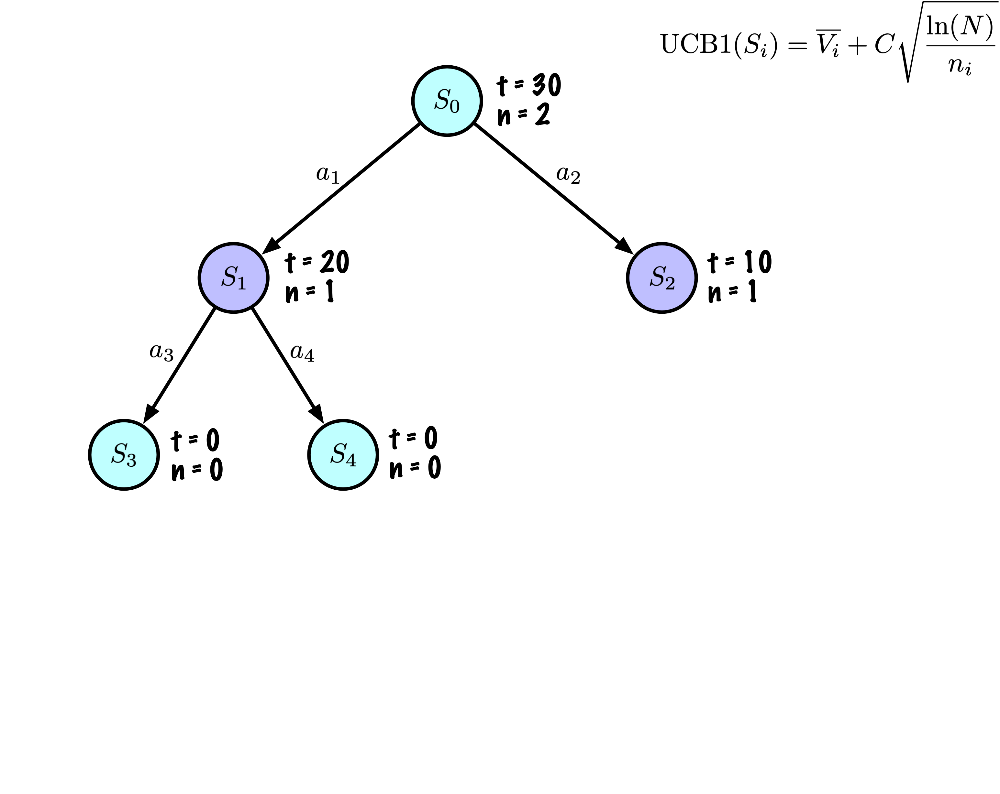

3.2 Expansion du nœud. Puisque $n_1 \gt 0$, le nœud est développé.

## Étape par étape (3.3)

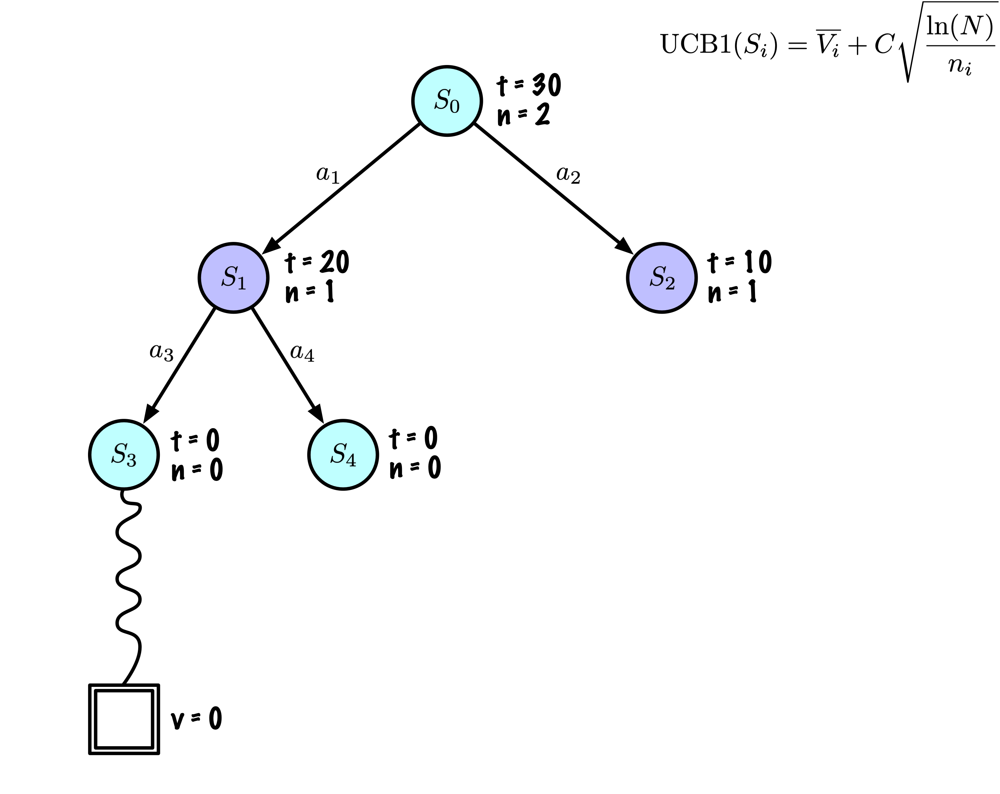

3.3 Déploiement.

## Étape par étape (3.4)

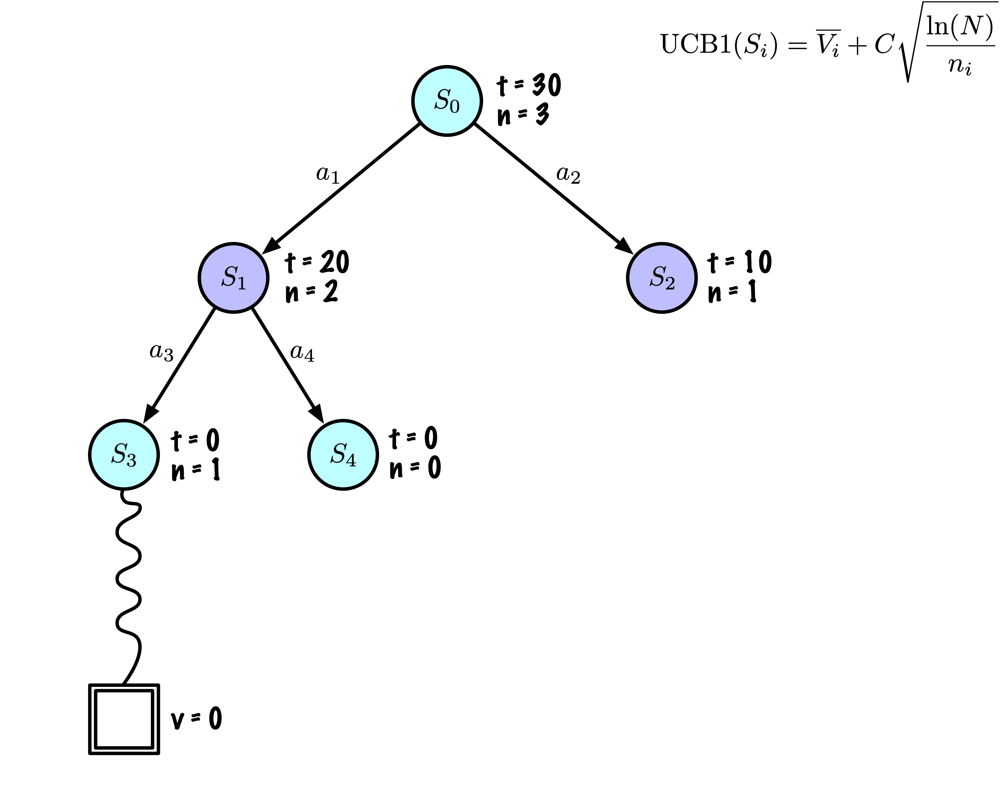

3.4 Rétropropagation.

## Étape par étape (3.Fin)

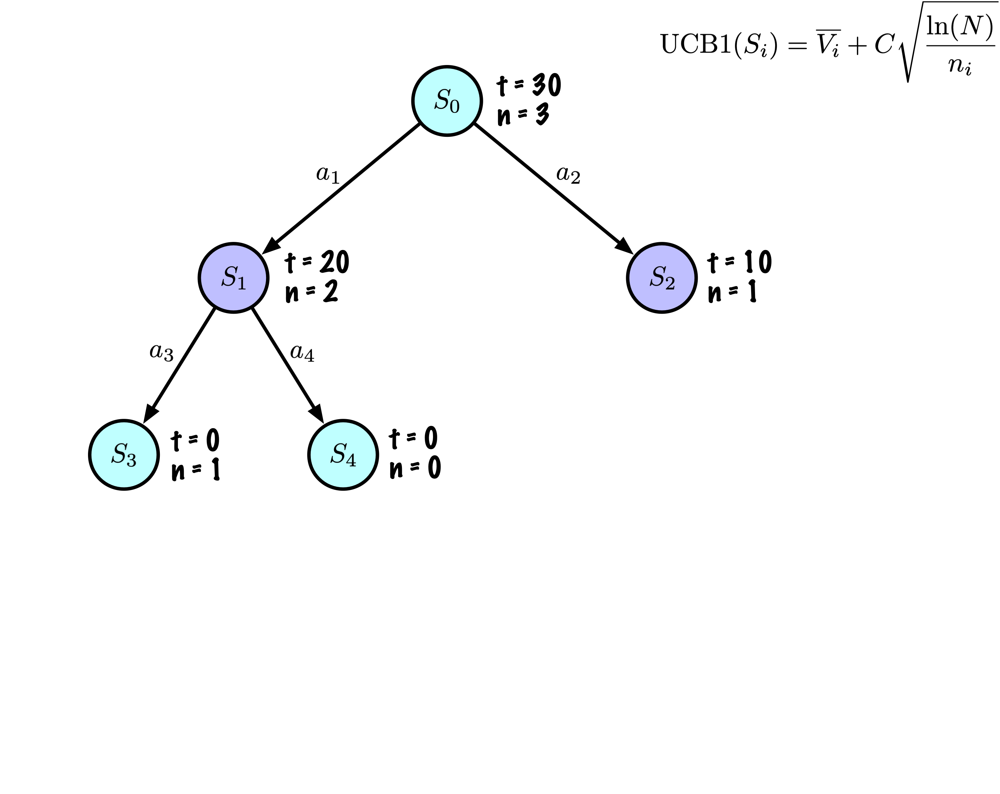

Fin de l’itération 3.

## Étape par étape (4.1)

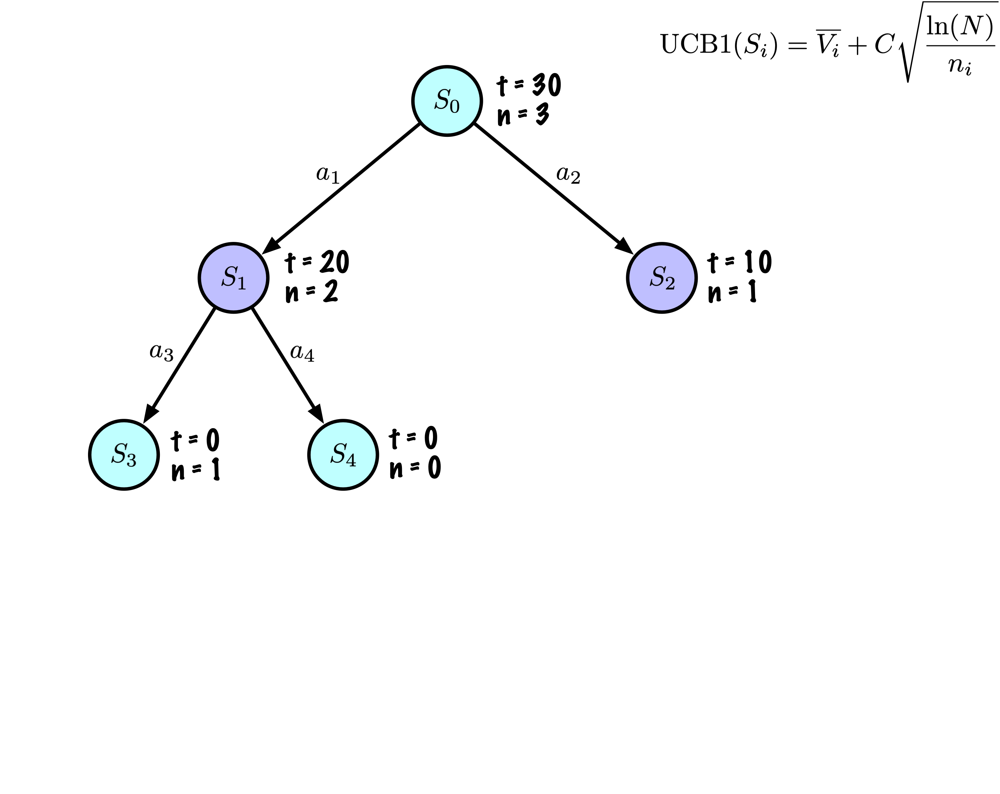

4.1 Sélection. Calcul des valeurs UCB1.

## Étape par étape (4.1)

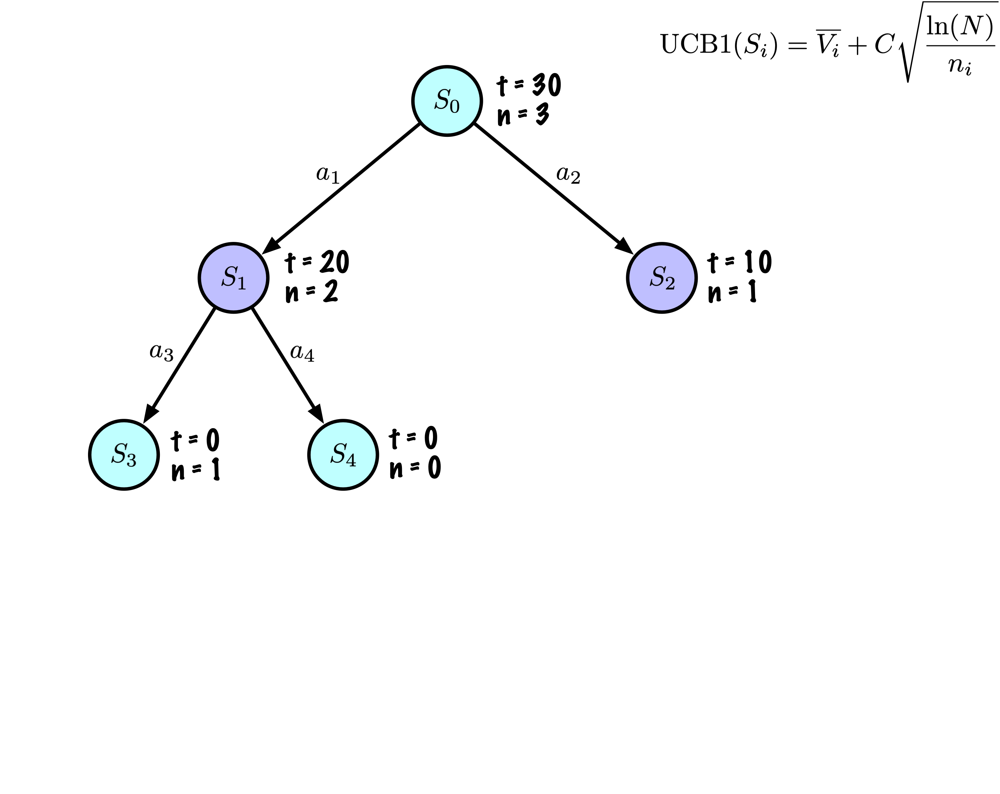

Calcul de la valeur UCB1 de
$S_1 = \frac{20}{2} + 2 \sqrt{\frac{\ln(3)}{2}} = 10 + 2 \sqrt{\frac{\ln(3)}{2}} = 11.48$
et $S_2 = 10 + 2 \sqrt{\frac{\ln(3)}{1}} = 12.10$.

Sélection de $S_2$

## Étape par étape (4.2)

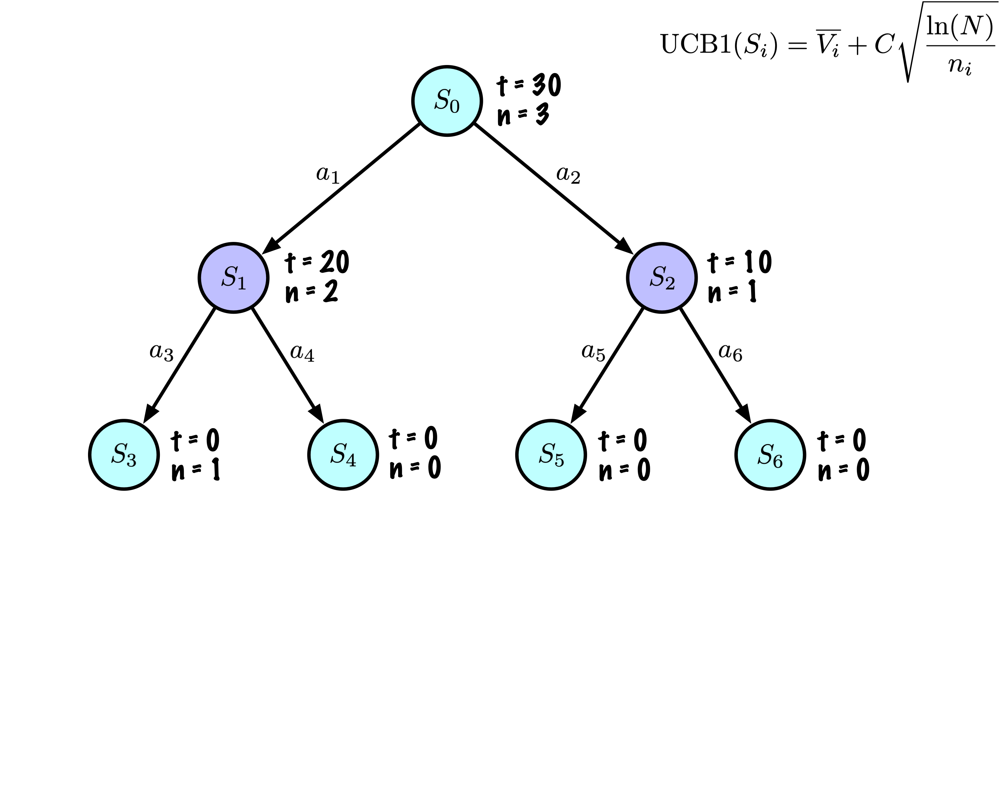

4.2 Expansion.

## Étape par étape (4.2)

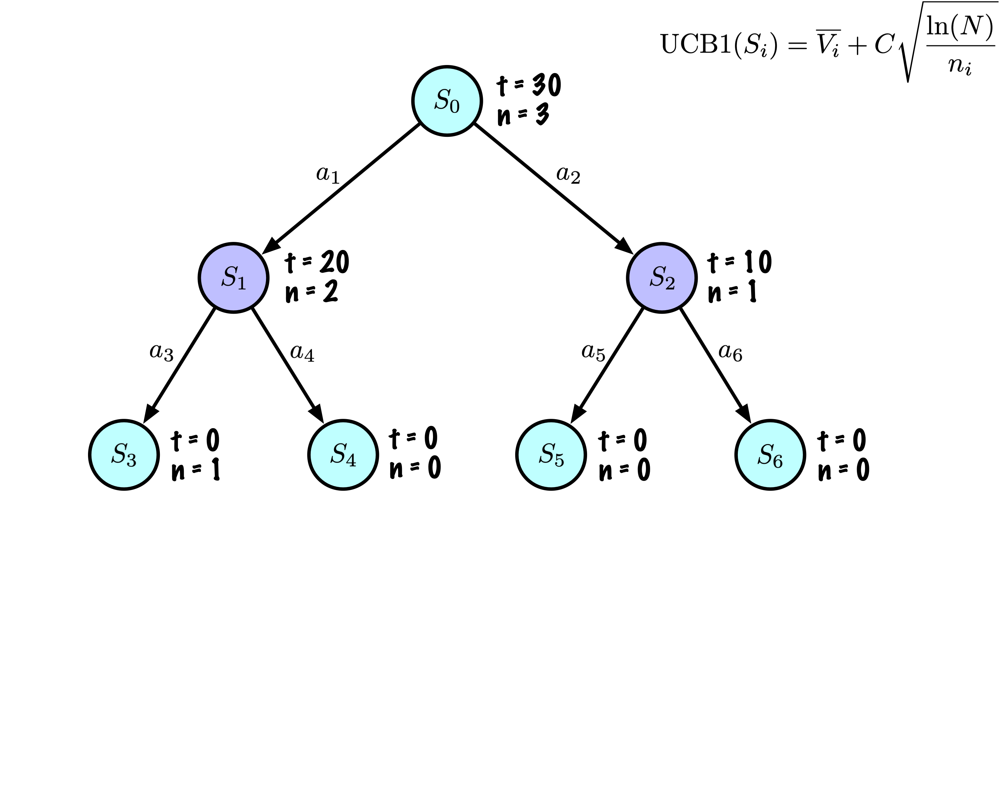

4.2 Expansion. Les deux nœuds ont la même valeur USCB1, $\infty$.

Sélection de $S_5$.

## Étape par étape (4.3)

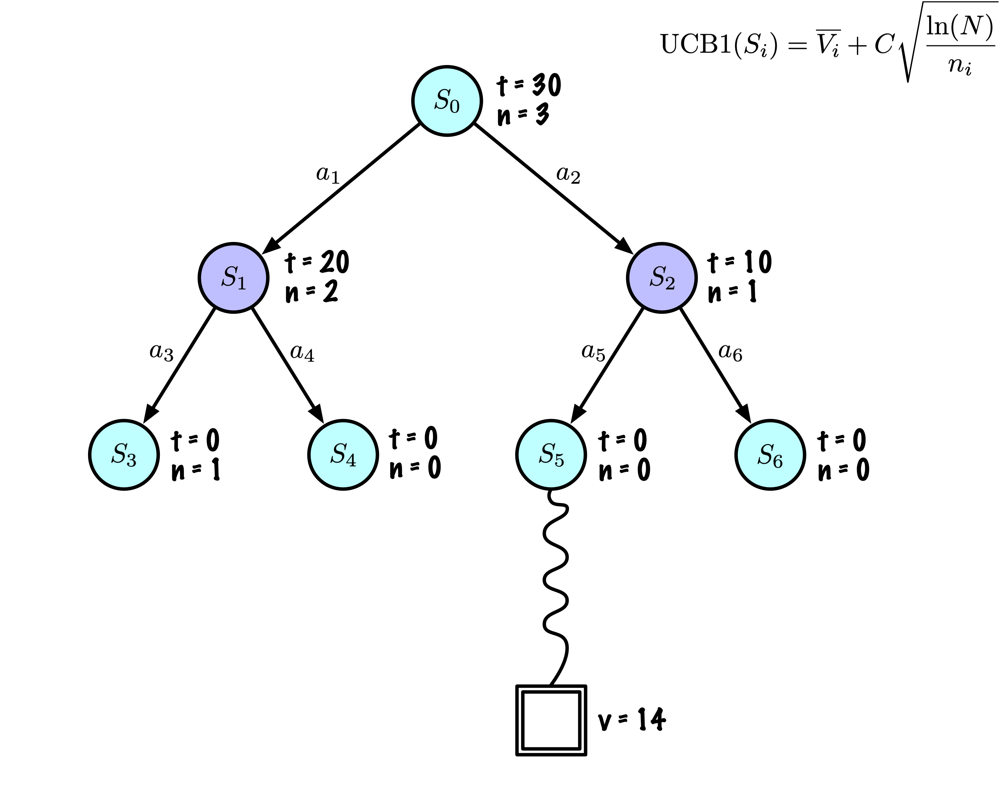

4.3 Déroulement.

## Étape par étape (4.4)

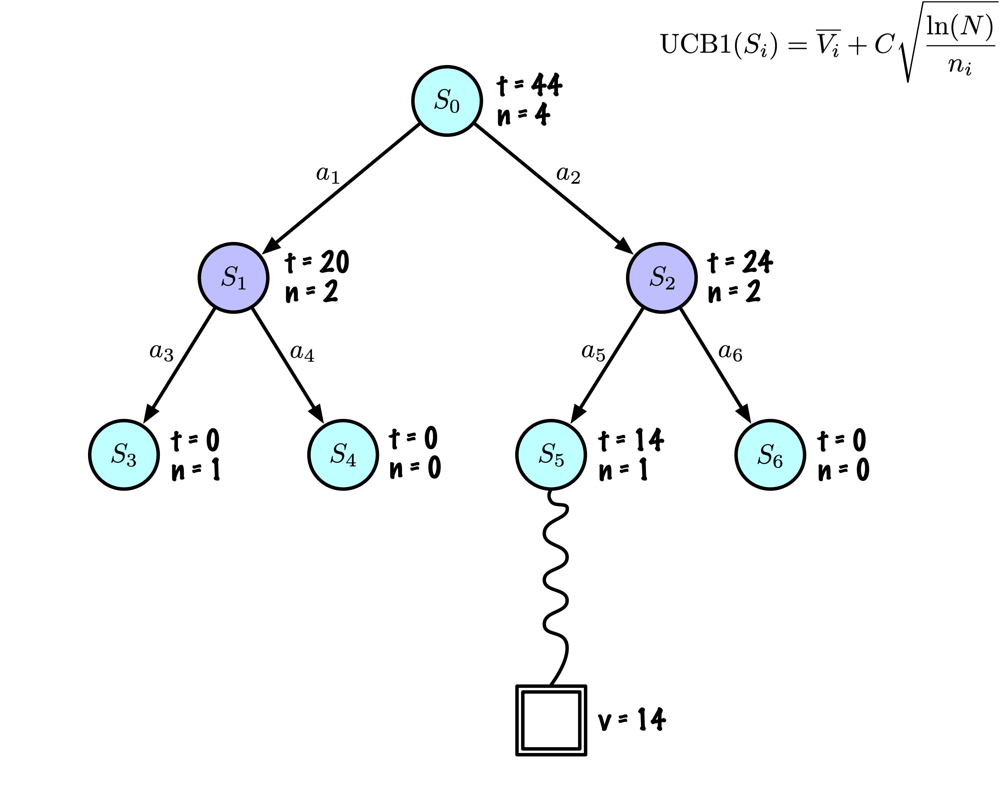

4.4 Rétropropagation.

## Étape par étape (4.Fin)

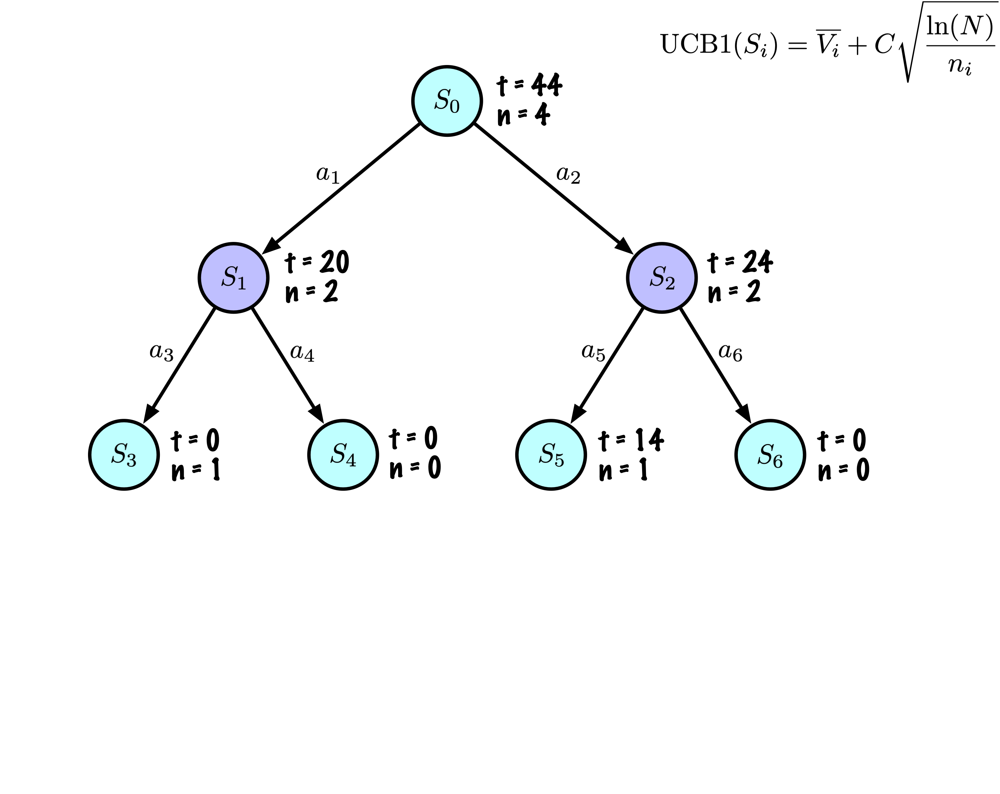

Fin de l’itération 4.

## Déroulement

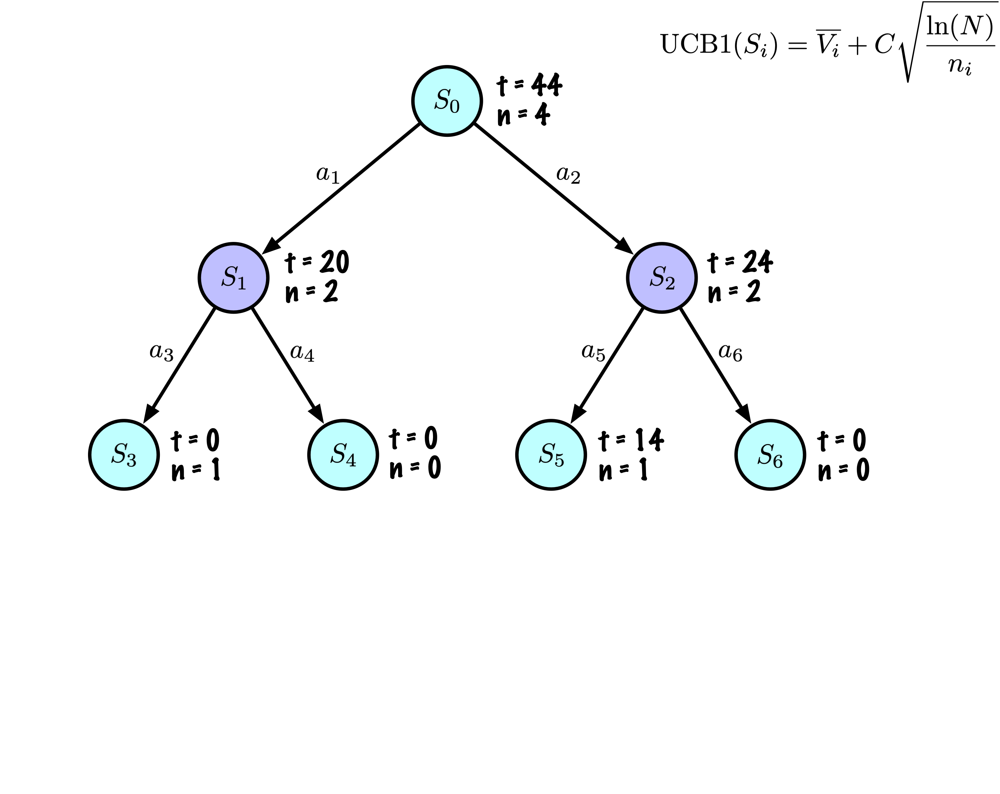

Si l’algorithme s’arrête à cette étape, il recommandera $a_2$ comme le
coup optimal, étant donné que $S_2$ possède le score moyen le plus
élevé.

Dans les applications pratiques, diverses stratégies sont employées pour
déterminer l’action optimale. Une approche courante consiste à
sélectionner le nœud avec le plus grand nombre de visites, car cette
méthode peut offrir une plus grande robustesse par rapport au choix du
nœud basé uniquement sur le score moyen le plus élevé.

Dans des applications telles que les échecs, le Go ou les jeux Atari, le
MCTS effectue de 1000 à 2000 simulations par coup. Ce nombre apparemment
faible est attribué à l’utilisation d’algorithmes d’apprentissage
profond, qui dirigent la recherche à travers des politiques d’arbre et
par défaut.

Chaque ensemble d’itérations, par exemple 1000, est utilisé uniquement
pour déterminer le prochain coup optimal.

Pendant les premières itérations, le MCTS fonctionne avec des
informations limitées pour sélectionner le prochain meilleur coup. Au
fur et à mesure que les itérations augmentent, les estimations
deviennent plus précises.

Le nombre de nœuds dans un arbre de recherche après 1000 itérations de
MCTS dépend de plusieurs facteurs, y compris le facteur de ramification
à chaque nœud et la politique spécifique utilisée pour l’expansion des
nœuds. Généralement, chaque itération de MCTS se compose de quatre
étapes principales : sélection, expansion, simulation et
rétropropagation. Pendant la phase d’expansion, un nouveau nœud est
ajouté à l’arbre.

Dans une configuration typique de MCTS :

1.  **Sélection** : Descendre l’arbre existant de la racine à un nœud
    feuille en utilisant une politique d’arbre, souvent basée sur les
    bornes de confiance supérieures pour les arbres (UCT).
2.  **Expansion** : Ajouter un ou plusieurs nœuds enfants au nœud
    sélectionné s’il n’est pas entièrement développé.
3.  **Simulation** : Effectuer une simulation à partir du nouveau nœud
    jusqu’à un état terminal.
4.  **Rétropropagation** : Mettre à jour les estimations de valeur des
    nœuds de chemin en fonction du résultat de la simulation.

En supposant que chaque itération étend exactement un nouveau nœud,
l’arbre de recherche aura environ 1000 nœuds supplémentaires après 1000
itérations. Cependant, le nombre réel peut varier si plusieurs nœuds
sont étendus par itération ou en raison de la configuration initiale de
l’arbre et d’autres variations dans l’implémentation de l’algorithme.

## Russell et Norvig

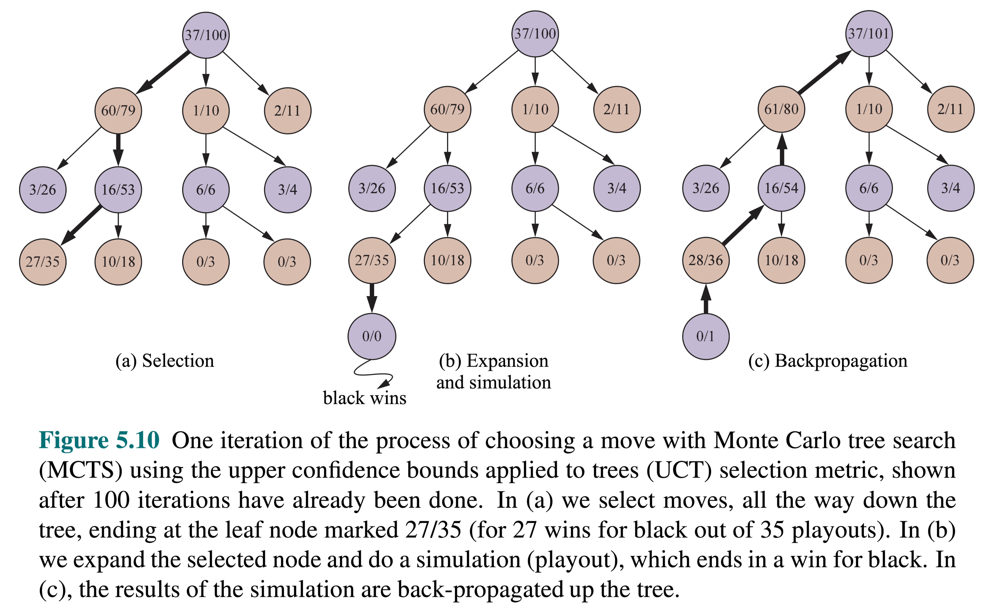

**Attribution** : Russell et Norvig (2020), Figure 5.10

Cet exemple inclut un nombre de nœuds significativement plus élevé, ce
qui peut aider à mieux comprendre l’étape de sélection.

L’algorithme cherche à se diriger vers la zone la plus prometteuse de
l’arbre, caractérisée par le score moyen le plus élevé, et à développer
ensuite cette section de l’arbre de recherche.

Notez que l’étape de rétropropagation met à jour tous les nœuds le long
du chemin allant du nœud sélectionné à la racine. Cette mise à jour peut
influencer le chemin choisi lors de l’itération suivante.

Comme l’algorithme fonctionne dans un environnement adversarial, nous ne
comptons que les victoires attribuées aux nœuds noirs.

## Résumé : construction de l’arbre

Initialement, l’arbre a un nœud, c’est $S_0$.

Nous ajoutons ses descendants et nous sommes prêts à commencer.

La recherche arborescente de Monte Carlo construit lentement son arbre
de recherche.

## Résumé : 4 étapes

À chaque itération, les étapes suivantes se produisent :

1.  **Sélection** : Identifier le “meilleur” nœud en descendant un seul
    chemin dans l’arbre, guidé par UCB1.

2.  **Expansion** : Étendre le nœud s’il est une feuille dans l’arbre
    MCTS et $n \gt 0$.

3.  **Simulation** : Simuler une partie à partir de l’état actuel
    jusqu’à un état terminal en sélectionnant des actions au hasard.

4.  **Rétropropagation** : Utiliser les informations obtenues pour
    mettre à jour le nœud actuel et tous les nœuds parents jusqu’à la
    racine.

## Résumé : nœuds

Chaque nœud enregistre son **score total** et son **nombre de visites**.

Cette information est utilisée pour calculer une valeur qui **guide la
descente de l’arbre**, équilibrant **exploration** et **exploitation**.

## Résumé : exploration vs exploitation

$$
\mathrm{UCB1}(S_i) = \overline{V_i} + C \sqrt{\frac{\ln(N)}{n_i}}
$$

La valeur habituelle pour $C$ est $\sqrt{2}$.

L’**exploration** se produit essentiellement lorsque **deux nœuds** ont
approximativement le **même score moyen**, puis MCTS favorise les nœuds
avec **moins de visites** (en divisant par $n$).

Pour $n \lt \ln(N)$, la valeur du ratio est supérieure à 1, alors que
pour $n \gt \ln(N)$, le ratio devient inférieur à 1.

Il y a donc une petite fraction du temps où l’exploration intervient.
Mais même dans ce cas, la contribution du ratio est assez modérée, nous
prenons la racine carrée de ce ratio, multipliée par
$\sqrt{2} \sim 1.414213562$.

## Résumé : exploration vs exploitation

Dans le **recuit simulé**, la température initiale et l’échelle de la
fonction objectif sont liées.

Règle d’acceptation pour un déplacement candidat avec un changement de
score $\Delta E = E_{\text{nouveau}} - E_{\text{ancien}}$ :

- Si $\Delta E \le 0$ : toujours accepter (solution meilleure ou égale).
- Si $\Delta E > 0$ : accepter avec une probabilité

$$
  p = \exp(-\Delta E / T).
$$

## Résumé : exploration vs exploitation

Dans le **recuit simulé** :

- **$T$** définit à quel point un mauvais mouvement doit être “grand”
  avant qu’il ne soit peu probable d’être accepté.

- Si $T$ est grand par rapport au $\Delta E$ typique :

  - Même des mouvements sensiblement aggravants ont une probabilité
    raisonnable.
  - Très exploratoire.

- Si $T$ est petit :

  - Seuls les mouvements très peu aggravants sont acceptés.
  - Principalement exploitant / recherche locale.

C’est pourquoi vous choisissez souvent la température initiale $T$ en
utilisant la *distribution* de $\Delta E$ sur des états aléatoires : par
exemple, “fixer $T_0$ de sorte qu’un $\Delta E$ typique ait, disons,
60-80% d’acceptation.” C’est explicitement **lié à l’échelle de la
fonction de score**.

## Résumé : C comme échelle d’exploration

Dans UCT (UCB1), nous utilisons

$$
\text{score}(i)
= V_i + C \sqrt{\frac{\ln N}{n_i}},
$$

où :

- $V_i$: valeur moyenne de simulation de l’enfant $i$ (terme
  d’exploitation),
- $N$: nombre total de visites au nœud parent,
- $n_i$: visites à l’enfant $i$,
- $C$: constante d’exploration.

## Résumé : C comme échelle d’exploration

À un nœud donné :

- L’enfant avec le plus grand $\text{score}(i)$ est sélectionné.
- Le second terme $$
  C \sqrt{\frac{\ln N}{n_i}}
  $$ est **pure exploration** : grand quand $n_i$ est petit, diminuant à
  mesure que vous visitez cet enfant.

## Résumé : C comme échelle d’exploration

Considérons deux enfants, 1 et 2. Vous choisissez 2 au lieu de 1 quand :

$$
V_2 + C\sqrt{\frac{\ln N}{n_2}} > V_1 + C\sqrt{\frac{\ln N}{n_1}}.
$$

Réorganisez :

$$
V_2 - V_1 > C\left(\sqrt{\frac{\ln N}{n_1}} - \sqrt{\frac{\ln N}{n_2}}\right).
$$

## Résumé : C comme échelle d’exploration

- La **différence dans les valeurs moyennes de simulation** qui peut
  être « annulée » par l’exploration est proportionnelle à $C$.
- **Plus grand** $C$ → le terme d’**exploration** domine davantage →
  vous êtes prêt à essayer un enfant dont le $V_i$ est significativement
  pire, juste parce qu’il est sous-exploré.
- **Plus petit** $C$ → vous vous en tenez davantage au $V_i$
  **actuellement le plus prometteur**.

## Résumé : C comme échelle d’exploration

Dans la **théorie classique de l’UCB1**, les récompenses sont supposées
être dans $[0,1]$, et il y a une constante recommandée spécifique (par
exemple $\sqrt{2}$). Si votre échelle de récompense est différente
(disons dans $[-1,1]$ ou de grande amplitude), vous **redimensionnez**
essentiellement cette constante ; en pratique, les gens ajustent $C$
empiriquement.

## Résumé : C comme échelle d’exploration

**Analogie :**

- Le $T$ de l’optimisation simulée et le $C$ de l’MCTS équilibrent tous
  deux **exploration vs exploitation**.
- Dans les deux cas, leur signification *effective* dépend de
  l’**échelle de l’objectif / des récompenses**.
- Dans SA : « à quel point un mouvement peut-il être mauvais et être
  encore souvent accepté ? »
- Dans MCTS : « à quel point la valeur actuelle $V_i$ d’un enfant
  peut-elle être pire et quand même être choisie pour l’exploration ? »

## Résumé : C comme échelle d’exploration

**Principales différences :**

- **Recuit simulée** :

  - Trajectoire unique.
  - $T$ est **explicitement programmé** (de haut en bas) au fil du
    temps.
  - Équilibre les mouvements locaux dans un seul chemin de recherche.

## Résumé : C comme échelle d’exploration

- **MCTS (UCT)** :

  - Arbre de nombreux chemins.

  - $C$ est constant, mais l’exploration **décroît automatiquement** via
    $\sqrt{\ln N / n_i}$ :

    - **Début** : $n_i$ petit → exploration élevée.
    - **Fin** : $n_i$ grand → le terme d’exploration diminue, le
      comportement devient plus avide.

### 1. Cas extrêmes

- **$C = 0$** (pas de terme d’exploration)

  - Score UCT = purement la valeur moyenne.

  - L’algorithme devient **glouton** :

    - Il continue à choisir le mouvement qui *semble* actuellement le
      meilleur.
    - D’autres mouvements peuvent recevoir très peu (ou aucune) visites.

  - Conséquences :

    - Peut s’enfermer dans un **mauvais mouvement** si les premiers
      lancers étaient malchanceux.
    - L’arbre est très **étroit et profond**.
    - Avec des lancers bruyants et peu de simulations, le jeu peut être
      étonnamment mauvais.

- **$C$ très grand**

  - Le bonus d’exploration domine :

    - Même si la valeur moyenne d’un mouvement semble pire, s’il a moins
      de visites, il est quand même choisi souvent.

  - Conséquences :

    - La recherche devient **très exploratoire**, presque comme un «
      tâtonnement systématique ».
    - L’arbre est **large et peu profond**.
    - Les valeurs à la racine convergent lentement ; les décisions sont
      bruyantes.
    - Avec des simulations limitées, le choix des mouvements peut
      sembler presque aléatoire.

### 2. $C$ modéré : ce qui change réellement quand vous le faites varier

Pour un intervalle raisonnable (disons $C$ dans $[0.5, 2]$ pour le
tic-tac-toe avec des récompenses dans $[-1,1]$) :

- **$C$ plus petit (par exemple 0.3–0.7)** :

  - Engagement plus rapide vers le mouvement qui semble actuellement le
    meilleur.

  - Forme de l’arbre : **quelques branches très explorées**, d’autres à
    peine touchées.

  - Utile lorsque :

    - Les lancers sont relativement **peu bruyants**,
    - Vous avez un **budget de simulation limité**,
    - La « meilleure » branche est facile à identifier.

  - Risque : peut **manquer** des mouvements forts mais initialement
    malchanceux.

- **$C$ plus grand (par exemple 1.0–2.0)** :

  - Couverture plus **équilibrée** des enfants :

    - Même si un mouvement semble légèrement meilleur, les autres
      reçoivent encore un nombre substantiel de visites.

  - Forme de l’arbre : **plus large** près de la racine, nombre de
    visites plus égal entre les mouvements.

  - Utile lorsque :

    - Les lancers sont **bruyants**,
    - Vous voulez que l’algorithme soit plus « ouvert » aux
      alternatives.

  - Risque : passe **trop de temps** sur des branches clairement
    mauvaises si le budget est faible.

Dans les métriques globales (par exemple, taux de victoire contre Random
pour un nombre fixe de simulations) :

- À mesure que vous **augmentez $C$ à partir de 0** :

  - La performance s’**améliore** généralement au début (vous cessez
    d’être myope).

- Au-delà d’un certain point :

  - La performance **se dégrade** ensuite (vous explorez tellement que
    vous ne raffinez pas assez la meilleure ligne).

Vous voyez donc généralement une **courbe en U** de la performance en
fonction de (C) : trop peu d’exploration est mauvais, trop est mauvais,
il y a un « point idéal » qui dépend du jeu, du bruit des lancers et du
budget de simulation.

### 3. Ce qu’il faut rechercher dans le tic-tac-toe

Si vous faites varier $C$ et observez :

- **Statistiques de l’arbre** :

  - Distribution du nombre de visites par enfant à la racine.
  - Profondeur contre largeur de l’arbre exploré.

- **Résultats du jeu** contre un adversaire fixe (par exemple Random ou
  Minimax) :

  - Avec un petit $C$, vous pouvez voir des erreurs étranges dues à un «
    engagement précoce excessif ».
  - Avec un grand $C$, vous pouvez voir « trop d’expérimentation »,
    surtout avec peu de simulations.
  - Pour un $C$ intermédiaire, le solveur se stabilise en un jeu fort et
    cohérent.

C’est l’effet concret et observable du changement de $C$ : il remodèle
le compromis entre **creuser profondément dans ce qui semble bon
maintenant** et **donner une chance équitable aux autres mouvements**.

## Résumé

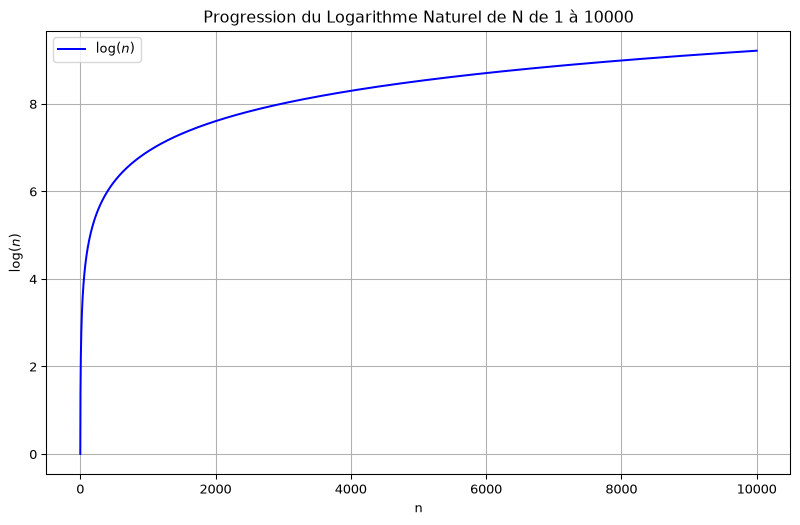

[4.60517019 6.90775528 9.21034037]

## Résumé

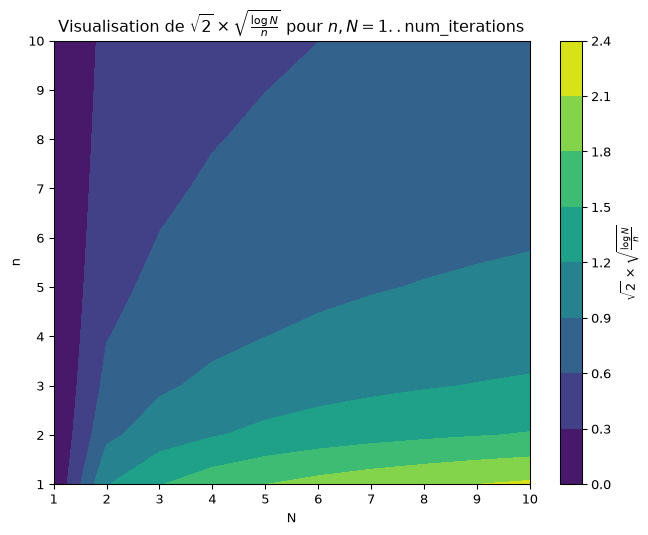

In [2]:
import numpy as np
import matplotlib.pyplot as plt

num_iterations = 10

# Définir la plage pour n et N
n_values = np.arange(1, num_iterations + 1)
N_values = np.arange(1, num_iterations + 1)

# Préparer une grille pour n et N
N, n = np.meshgrid(N_values, n_values)

# Calculer l'expression pour chaque paire (n, N)
Z = np.sqrt(2) * np.sqrt(np.log(N) / n)

# Tracé
plt.figure(figsize=(8, 6))
plt.contourf(N, n, Z, cmap='viridis')
plt.colorbar(label=r'$\sqrt{2} \times \sqrt{\frac{\log{N}}{n}}$')
plt.xlabel('N')
plt.ylabel('n')
plt.title(r'Visualisation de $\sqrt{2} \times \sqrt{\frac{\log{N}}{n}}$ pour $n, N = 1..\mathrm{num\_iterations}$')
plt.show()

## Résumé

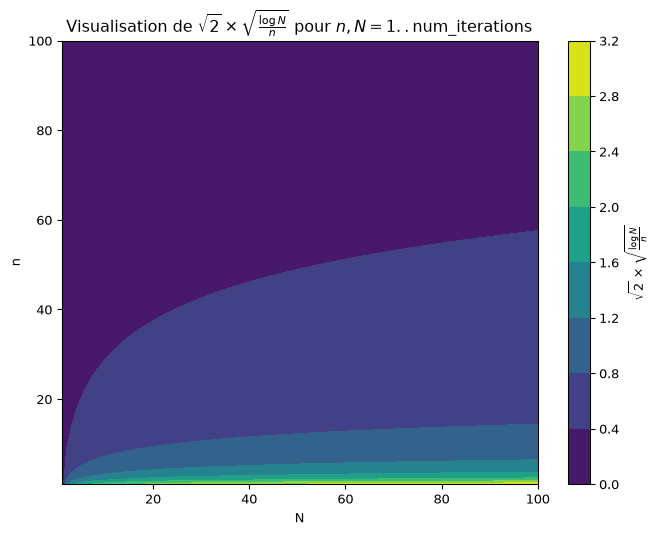

In [3]:
import numpy as np
import matplotlib.pyplot as plt

num_iterations = 100

# Définir la plage pour n et N
n_values = np.arange(1, num_iterations + 1)
N_values = np.arange(1, num_iterations + 1)

# Préparer une grille pour n et N
N, n = np.meshgrid(N_values, n_values)

# Calculer l'expression pour chaque paire (n, N)
Z = np.sqrt(2) * np.sqrt(np.log(N) / n)

# Tracé
plt.figure(figsize=(8, 6))
plt.contourf(N, n, Z, cmap='viridis')
plt.colorbar(label=r'$\sqrt{2} \times \sqrt{\frac{\log{N}}{n}}$')
plt.xlabel('N')
plt.ylabel('n')
plt.title(r'Visualisation de $\sqrt{2} \times \sqrt{\frac{\log{N}}{n}}$ pour $n, N = 1..\mathrm{num\_iterations}$')
plt.show()

**Origine de UCB1 dans MCTS :**

La formule **Upper Confidence Bound 1 (UCB1)** trouve son origine dans
le **problème du bandit manchot**, un problème classique en
apprentissage par renforcement et en théorie de la décision. Dans ce
problème, un joueur doit décider quel bras de plusieurs machines à sous
tirer pour maximiser sa récompense totale, en équilibrant l’exploration
des machines moins connues et l’exploitation des machines connues pour
offrir de hautes récompenses.

L’algorithme UCB1 a été développé pour résoudre ce dilemme
exploration-exploitation en fournissant une borne supérieure statistique
sur la récompense attendue de chaque action (ou bras). Dans le contexte
de la **recherche arborescente de Monte Carlo (MCTS)**, UCB1 est adapté
pour guider la sélection des nœuds pendant la phase de **Sélection**,
aidant l’algorithme à décider quel nœud explorer ensuite.

**Comprendre la formule UCB1 :**

La formule UCB1 utilisée dans MCTS est :

$$
\text{UCB1}(i) = \overline{V}_i + C \sqrt{\frac{\ln N}{n_i}}
$$

- **$\overline{V}_i$** : La récompense moyenne (valeur) du nœud $i$
  (terme d’exploitation).
- **$C$** : Un paramètre constant qui équilibre l’exploration et
  l’exploitation (souvent réglé à $\sqrt{2}$).
- **$N$** : Le nombre total de simulations ou de visites au nœud parent.
- **$n_i$** : Le nombre de fois que le nœud $i$ a été visité.

**Composantes Expliquées :**

1.  **Terme d’Exploitation ($\overline{V}_i$)** : Représente la
    récompense moyenne obtenue du nœud $i$, encourageant la sélection
    des nœuds avec des récompenses connues plus élevées.

2.  **Terme d’Exploration ($C \sqrt{\frac{\ln N}{n_i}}$)** : Fournit un
    bonus aux nœuds qui ont été moins souvent visités, encourageant
    l’exploration des nœuds moins visités.

**Équilibrer Exploration et Exploitation :**

- **Exploitation** : Favorise les nœuds avec de hautes récompenses
  moyennes.
- **Exploration** : Favorise les nœuds qui ont été moins visités, pour
  recueillir plus d’informations.

Le **terme d’exploration diminue à mesure que $n_i$ augmente**, ce qui
signifie que lorsque un nœud est visité plus souvent, l’incitation à
l’explorer davantage diminue. Inversement, les nœuds avec moins de
visites reçoivent un bonus d’exploration plus élevé.

**Pourquoi l’Exploration se Produit Lorsque les Scores Moyens sont
Similaires :**

Voici pourquoi :

- **Récompenses Moyennes Similaires ($\overline{V}_i$)** : Lorsque les
  nœuds ont des valeurs d’exploitation comparables, le terme
  d’exploration devient le facteur décisif dans la valeur UCB1.

- **Influence du Terme d’Exploration** :

  - **Nœuds Moins Visit és** : Ont un terme d’exploration plus élevé en
    raison du $n_i$ plus petit, augmentant leur valeur UCB1.
  - **Nœuds Bien Visit és** : Ont un terme d’exploration plus faible,
    car $n_i$ est plus grand.

- **Résultat** : L’algorithme est plus susceptible de sélectionner des
  nœuds moins explorés lorsque les récompenses moyennes sont similaires,
  favorisant l’exploration pour potentiellement découvrir de meilleurs
  résultats.

**Aperçu Mathématique :**

- Lorsque **les valeurs $\overline{V}_i$ sont égales**, la formule UCB1
  se simplifie à la comparaison des termes d’exploration.
- Le nœud avec le **plus petit $n_i$** (moins visité) aura un terme
  d’exploration plus grand en raison de la relation
  $\frac{1}{\sqrt{n_i}}$.
- À mesure que **$N$** augmente (plus de simulations totales), le bonus
  d’exploration diminue logarithmiquement, garantissant que l’algorithme
  favorise finalement l’exploitation.

**Visualiser le Terme d’Exploration :**

Pour mieux comprendre comment l’exploration est encouragée :

- **Comportement du Terme d’Exploration** :
  - **Début ($n_i$ est petit)** : Le terme d’exploration est
    significatif, favorisant l’exploration de tous les nœuds.
  - **Étapes Ultérieures ($n_i$ augmente)** : Le terme d’exploration
    diminue, et les nœuds avec des récompenses moyennes plus élevées
    sont préférés.
- **Croissance Logarithmique** :
  - Le terme $\ln N$ croît lentement, ce qui signifie que le bonus
    d’exploration se réduit avec le temps à moins que $n_i$ reste
    faible.

**Conclusion :**

La formule UCB1 dans MCTS équilibre efficacement l’exploration et
l’exploitation en :

- **Utilisant la récompense moyenne** pour exploiter les nœuds connus
  comme étant bons.
- **Incorporant le terme d’exploration** pour s’assurer que les nœuds
  moins visités sont explorés, surtout lorsque leurs récompenses
  moyennes sont similaires à d’autres.
- **S’adaptant au fil du temps**, de sorte que l’algorithme explore
  d’abord largement mais se concentre progressivement sur les nœuds les
  plus prometteurs au fur et à mesure que plus d’informations sont
  recueillies.

**En résumé**, la formule UCB1 trouve son origine dans le besoin de
résoudre le dilemme exploration-exploitation dans le problème du bandit
manchot et est essentielle à la capacité de MCTS à rechercher
efficacement de grands espaces de décision. L’exploration se produit
principalement lorsque les nœuds ont des scores moyens similaires parce
que le terme d’exploration joue alors un rôle crucial pour les
différencier, guidant l’algorithme vers des zones potentiellement
inexplorées mais prometteuses de l’espace de recherche.

**Ressources Supplémentaires :**

- **Articles de Recherche** :
  - Auer, P., Cesa-Bianchi, N., & Fischer, P. (2002). *Finite-time
    Analysis of the Multiarmed Bandit Problem*. Machine Learning.
  - Kocsis, L., & Szepesvári, C. (2006). *Bandit Based Monte-Carlo
    Planning*. ECML.
- **Lectures Complémentaires** :
  - [Tutoriel sur la Recherche arborescente de Monte
    Carlo](https://jeffbradberry.com/posts/2015/09/intro-to-monte-carlo-tree-search/)
  - [Comprendre UCB1 et
    MCTS](https://www.baeldung.com/cs/monte-carlo-tree-search)

# Architecture Commune de Jeu

## `Game`

In [4]:
import math
import random
import numpy as np
import matplotlib.pyplot as plt

class Game:

    """
    Interface abstraite pour un jeu déterministe, à 2 joueurs, à somme nulle,
    avec prise de tours.

    Conventions (utilisées par le Tic-Tac-Toe et les solveurs ci-dessous) :
    - Les joueurs sont identifiés par les chaînes "X" et "O".
    - evaluate(state) retourne :
        > 0  si la position est favorable pour "X"
        < 0  si la position est favorable pour "O"
        == 0 pour une égalité ou une position non-terminale égale
    """

    def initial_state(self):

        """Retourne un objet représentant la position de départ du jeu."""

        raise NotImplementedError

    def get_valid_moves(self, state):

        """
        Étant donné un état, retourne un itérable de coups légaux.
        Le type de 'move' dépend du jeu (par exemple, (ligne, colonne) pour le Tic-Tac-Toe).
        """

        raise NotImplementedError

    def make_move(self, state, move, player):

        """
        Retourne l'état successeur obtenu en appliquant 'move' pour 'player'
        à 'state'. L'état original ne doit pas être modifié sur place.
        """

        raise NotImplementedError

    def get_opponent(self, player):

        """Retourne l'adversaire de 'player'."""

        raise NotImplementedError

    def is_terminal(self, state):

        """
        Retourne True si 'state' est une position terminale (victoire, défaite ou égalité),
        False sinon.
        """

        raise NotImplementedError

    def evaluate(self, state):

        """
        Retourne une évaluation scalaire de 'state' :
            +1 pour une victoire de X, -1 pour une victoire de O, 0 sinon (pour le Tic-Tac-Toe).
        Pour d'autres jeux, cela peut être généralisé, mais ici nous gardons cela simple.
        """

        raise NotImplementedError

    def display(self, state):

        """Affiche une représentation lisible par l'humain de 'state' (pour le débogage)."""

        raise NotImplementedError

## `TicTacToe`

In [5]:
class TicTacToe(Game):

    """
    Implémentation classique du Tic-Tac-Toe 3x3 utilisant un tableau NumPy de chaînes de caractères.
    Les cases vides sont représentées par " ".
    Le joueur "X" est supposé être le joueur maximisant.
    """

    def __init__(self):
        self.size = 3

    def initial_state(self):

        """Retourne un plateau 3x3 vide."""

        return np.full((self.size, self.size), " ")

    def get_valid_moves(self, state):

        """Tous les couples (i, j) où la case du plateau est vide."""

        return [
            (i, j)
            for i in range(self.size)
            for j in range(self.size)
            if state[i, j] == " "
        ]

    def make_move(self, state, move, player):

        """
        Retourne un nouveau plateau avec 'player' placé à 'move' (ligne, colonne).
        L'état original n'est pas modifié.
        """

        new_state = state.copy()
        new_state[move] = player
        return new_state

    def get_opponent(self, player):

        """Échange les étiquettes des joueurs entre 'X' et 'O'."""

        return "O" if player == "X" else "X"

    def is_terminal(self, state):

        """
        Un état est terminal si :
        - L'un des joueurs a une ligne de 3 (evaluate != 0), ou
        - Il n'y a plus de cases vides (match nul).
        """

        if self.evaluate(state) != 0:
            return True
        return " " not in state

    def evaluate(self, state):

        """
        Retourne +1 si X a trois alignés, -1 si O a trois alignés,
        et 0 sinon (y compris les états non terminaux et les matchs nuls).

        Il s'agit d'une évaluation "théorique" du jeu dans les états terminaux ; pour
        les positions non terminales, nous retournons simplement 0.
        """

        lines = []

        # Lignes et colonnes
        for i in range(self.size):
            lines.append(state[i, :])   # ligne i
            lines.append(state[:, i])   # colonne i

        # Diagonales principales
        lines.append(np.diag(state))
        lines.append(np.diag(np.fliplr(state)))

        # Vérifie chaque ligne pour une victoire
        for line in lines:
            if np.all(line == "X"):
                return 1
            if np.all(line == "O"):
                return -1
        return 0

    def display(self, state):

        """
        Visualise un plateau de Tic-Tac-Toe en utilisant matplotlib.

        Paramètres
        ----------
        state : np.ndarray de forme (size, size)
            Plateau contenant ' ', 'X' ou 'O'.
        """

        size = self.size

        fig, ax = plt.subplots()
        ax.set_aspect('equal')
        ax.set_xlim(0, size)
        ax.set_ylim(0, size)

        # Dessine les lignes de la grille
        for i in range(1, size):
            ax.axhline(i, color='black')
            ax.axvline(i, color='black')

        # Cache complètement les axes
        ax.axis('off')

        # Dessine les symboles X et O
        for i in range(size):
            for j in range(size):
                cx = j + 0.5
                cy = size - i - 0.5     # inverse l'axe y pour une orientation correcte des lignes

                symbol = state[i, j]

                if symbol == "X":
                    ax.plot(cx, cy, marker='x',
                            markersize=40 * (3/size),
                            color='blue',
                            markeredgewidth=3)
                elif symbol == "O":
                    circle = plt.Circle((cx, cy),
                                        radius=0.30 * (3/size),
                                        fill=False,
                                        color='red',
                                        linewidth=3)
                    ax.add_patch(circle)

        plt.show()

## `Solver`

In [6]:
class Solver:

    """
    Classe de base pour tous les solveurs (Aléatoire, Minimax, AlphaBeta, MCTS, etc.).

    Les solveurs doivent implémenter :
        - select_move(jeu, état, joueur)

    Les solveurs peuvent éventuellement implémenter :
        - reset()           : appelé au début de chaque partie
        - opponent_played() : utilisé par les solveurs persistants (par exemple, MCTS)

    Remarques
    ---------
    • Les solveurs peuvent conserver un état interne qui persiste à travers les mouvements.
    • GameRunner peut appeler reset() automatiquement avant chaque match.
    """

    def select_move(self, jeu, état, joueur):

        """
        Doit être implémentée par les sous-classes.
        Retourne un mouvement légal pour le joueur donné.
        """

        raise NotImplementedError

    def get_name(self):

        """
        Retourne le nom du solveur pour les rapports, journaux ou résultats de tournoi.

        Par défaut, retourne le nom de la classe, mais les solveurs peuvent
        surcharger pour inclure des paramètres (par exemple, "MCTS(num_simulations=500)"").
        """
        
        return self.__class__.__name__

    def opponent_played(self, move):
        """
        Optionnel. Appelé après le mouvement de l'adversaire.
        Utile pour les solveurs à état comme MCTS.
        Les solveurs sans état peuvent l'ignorer.
        """
        pass

    def reset(self):

        """
        Optionnel. Appelé une fois au début de chaque partie.
        Surcharger uniquement si le solveur maintient un état interne
        (par exemple, arbre MCTS, analyse mise en cache, tables heuristiques).
        """

        pass

## `RandomSolver`

In [7]:
class RandomSolver(Solver):

    """
    Un solveur de référence simple :
    - À chaque coup, choisit uniformément au hasard parmi tous les coups légaux.
    - Ne conserve aucun état interne (pas d'apprentissage).
    """

    def __init__(self, seed=None):
        self.rng = random.Random(seed)

    def select_move(self, game, state, player):

        """Retourne un coup légal aléatoire pour le joueur actuel."""

        moves = game.get_valid_moves(state)

        return self.rng.choice(moves)

    def opponent_played(self, move):

        """Le solveur aléatoire n'a aucun état interne à mettre à jour."""

        pass

## `GameRunner`

In [8]:
class GameRunner:

    """
    Outil pour exécuter une seule partie entre deux solveurs sur un jeu donné.

    Cette classe est délibérément simple : elle alterne les coups entre "X" et "O"
    jusqu'à ce qu'un état terminal soit atteint.
    """

    def __init__(self, game, verbose=False):
        self.game = game
        self.verbose = verbose

    def play_game(self, solver_X, solver_O):

        """
        Joue une partie complète :
        - solver_X contrôle le joueur "X"
        - solver_O contrôle le joueur "O"

        Retourne
        -------
        result : int
            +1 si X gagne, -1 si O gagne, 0 pour un match nul.
        """

        state = self.game.initial_state()
        player = "X"
        solvers = {"X": solver_X, "O": solver_O}

        # Jouer jusqu'à une position terminale
        while not self.game.is_terminal(state):
            # Le joueur actuel sélectionne un coup
            move = solvers[player].select_move(self.game, state, player)

            # Appliquer le coup
            state = self.game.make_move(state, move, player)

            if self.verbose:
                self.game.display(state)

            # Informer l'adversaire (pour les solveurs persistants comme MCTS)
            opp = self.game.get_opponent(player)
            solvers[opp].opponent_played(move)

            # Changer de joueur actif
            player = opp

        if self.verbose:
            print(self.game.evaluate(state), "\n")

        # Évaluation finale du point de vue de X
        return self.game.evaluate(state)

## `evaluate_solvers`

In [9]:
def evaluate_solvers(game, solver_X, solver_O, num_games, verbose=False):

    """
    Évaluer deux solveurs en confrontation directe sur un jeu donné.

    Paramètres
    ----------
    game      : Game
        Une instance d'un jeu (par exemple, TicTacToe).
    solver_X  : Solver
        Solveur contrôlant le joueur "X" (le joueur maximisant).
    solver_O  : Solver
        Solveur contrôlant le joueur "O" (le joueur minimisant).
    num_games : int
        Nombre de parties à jouer avec ces rôles fixes.

    Remarques
    ---------
    - Les mêmes instances de solveurs sont réutilisées à travers les jeux.
      Cela permet aux solveurs *persistants* (par exemple, MCTS) d'accumuler
      de l'expérience à travers les jeux.
    - Les résultats sont interprétés du point de vue de X :
        +1 -> X gagne
        -1 -> O gagne
         0 -> match nul
    """

    runner = GameRunner(game)

    # Agréger les statistiques sur tous les jeux
    results = {
        "X_wins": 0,
        "O_wins": 0,
        "draws": 0,
    }

    for i in range(num_games):
        # Jouer une partie avec solver_X comme "X" et solver_O comme "O"
        outcome = runner.play_game(solver_X, solver_O)

        # Mettre à jour les compteurs en fonction du résultat (+1, -1 ou 0)
        if outcome == 1:
            results["X_wins"] += 1
            if verbose:
                print(f"Partie {i + 1}: X gagne") 
        elif outcome == -1:
            results["O_wins"] += 1
            if verbose:
                print(f"Partie {i + 1}: O gagne") 
        else:
            results["draws"] += 1
            if verbose:
                print(f"Partie {i + 1}: Match nul")

    # Imprimer le résumé final
    if verbose:
        print(f"\nAprès {num_games} parties :")
        print(f"  X ({solver_X.get_name()}) gagne : {results['X_wins']}")
        print(f"  O ({solver_O.get_name()}) gagne : {results['O_wins']}")
        print(f"  Matchs nuls : {results['draws']}")

    return results

## `MinimaxSolver`

In [10]:
from functools import lru_cache

def canonical(state):

    """
    Convertir une grille NumPy en une représentation immuable et hachable
    (tuple de tuples). Cela nous permet de l'utiliser comme clé dans des dictionnaires
    ou comme argument pour lru_cache. MCTS peut également réutiliser cette représentation.
    """
    
    return tuple(map(tuple, state))

class MinimaxSolver(Solver):

    """
    Un solveur Minimax classique et exact pour le Tic-Tac-Toe.

    - Suppose que "X" est le joueur maximisant.
    - Utilise la mémoïsation (lru_cache) pour éviter de recalculer les valeurs
      pour des positions identiques.
    """

    def select_move(self, game, state, player):
        
        """
        Interface publique : choisir le meilleur coup pour 'player' en utilisant Minimax.
        Pour le Tic-Tac-Toe, nous pouvons explorer en toute sécurité l'arbre de jeu complet.
        """

        # Stocker le jeu sur self pour que _minimax puisse l'utiliser
        self.game = game

        # Du point de vue de X : X maximise, O minimise
        maximizing = (player == "X")

        # Pour le Tic-Tac-Toe, depth=9 est suffisant pour couvrir tous les coups restants.
        _, move = self._minimax(canonical(state), player, maximizing, 9)
        return move

    @lru_cache(maxsize=None)
    def _minimax(self, state_key, player, maximizing, depth):

        """
        Minimax récursif interne.

        Paramètres
        ----------
        state_key : représentation hachable de la grille (tuple de tuples)
        player    : joueur devant jouer à ce nœud ("X" ou "O")
        maximizing: True si ce nœud est un nœud 'max' (X doit jouer),
                    False si c'est un nœud 'min' (O doit jouer)
        depth     : profondeur de recherche restante (non utilisé pour les 
                    coupes dans cette implémentation de recherche complète du 
                    Tic-Tac-Toe, mais conservé à des fins didactiques et pour 
                    une extension facile).
        """

        # Récupérer la grille NumPy à partir de state_key canonique
        state = np.array(state_key)

        # Test terminal : victoire, défaite ou match nul
        if self.game.is_terminal(state):
            # L'évaluation est toujours du point de vue de X : +1, -1, ou 0
            return self.game.evaluate(state), None

        moves = self.game.get_valid_moves(state)
        best_move = None

        if maximizing:
            # X doit jouer : maximiser l'évaluation
            best_val = -math.inf
            for move in moves:
                st2 = self.game.make_move(state, move, player)
                val, _ = self._minimax(
                    canonical(st2),
                    self.game.get_opponent(player),
                    False,
                    depth - 1
                )
                if val > best_val:
                    best_val = val
                    best_move = move
            return best_val, best_move

        else:
            # O doit jouer : minimiser l'évaluation (puisque l'évaluation est pour X)
            best_val = math.inf
            for move in moves:
                st2 = self.game.make_move(state, move, player)
                val, _ = self._minimax(
                    canonical(st2),
                    self.game.get_opponent(player),
                    True,
                    depth - 1
                )
                if val < best_val:
                    best_val = val
                    best_move = move
            return best_val, best_move

## `MinimaxAlphaBetaSolver`

In [11]:
class MinimaxAlphaBetaSolver(Solver):
    
    """
    Un solveur Minimax classique amélioré avec l'élagage Alpha-Beta.

    - Suppose que "X" est le joueur maximisant.
    - Utilise la mémorisation (lru_cache) pour éviter de recalculer les états.
    - Effectue une recherche *complète* du Tic-Tac-Toe (profondeur=9).
    - Retourne le coup optimal pour le joueur actuel.
    """

    # ------------------------------------------------------------
    # Interface du solveur
    # ------------------------------------------------------------

    def select_move(self, game, state, player):

        """
        Interface publique requise par Solver.
        Exécute la recherche Alpha-Beta depuis l'état actuel.
        """

        self.game = game

        maximizing = (player == "X")   # X maximise, O minimise

        # Réinitialiser le cache entre les jeux pour éviter de stocker des millions de clés
        self._alphabeta.cache_clear()

        value, move = self._alphabeta(
            canonical(state),
            player,
            maximizing,
            9,               # recherche en profondeur complète
            -math.inf,       # alpha
            math.inf         # beta
        )
        return move

    # ------------------------------------------------------------
    # Alpha-beta interne avec mémorisation
    # ------------------------------------------------------------

    @lru_cache(maxsize=None)
    def _alphabeta(self, state_key, player, maximizing, depth, alpha, beta):

        """
        Paramètres
        ----------
        state_key : plateau sous forme de tuple de tuples
        player    : joueur dont c'est le tour ('X' ou 'O')
        maximizing: Vrai si ce nœud est un nœud de maximisation pour X
        depth     : profondeur restante
        alpha     : meilleure valeur garantie pour le maximiseur jusqu'à présent
        beta      : meilleure valeur garantie pour le minimiseur jusqu'à présent
        """

        state = np.array(state_key)

        # Cas terminal ou d'horizon
        if self.game.is_terminal(state) or depth == 0:
            return self.game.evaluate(state), None

        moves = self.game.get_valid_moves(state)
        best_move = None

        # --------------------------------------------------------
        # MAX (X)
        # --------------------------------------------------------

        if maximizing:
            value = -math.inf

            for move in moves:
                st2 = self.game.make_move(state, move, player)

                child_val, _ = self._alphabeta(
                    canonical(st2),
                    self.game.get_opponent(player),
                    False,              # maintenant minimisant
                    depth - 1,
                    alpha,
                    beta
                )

                if child_val > value:
                    value = child_val
                    best_move = move

                alpha = max(alpha, value)
                if beta <= alpha:
                    break  # coupure β

            return value, best_move

        # --------------------------------------------------------
        # MIN (O)
        # --------------------------------------------------------

        else:
            value = math.inf

            for move in moves:
                st2 = self.game.make_move(state, move, player)

                child_val, _ = self._alphabeta(
                    canonical(st2),
                    self.game.get_opponent(player),
                    True,               # maintenant maximisant
                    depth - 1,
                    alpha,
                    beta
                )

                if child_val < value:
                    value = child_val
                    best_move = move

                beta = min(beta, value)
                if beta <= alpha:
                    break  # coupure α

            return value, best_move

## Vérification

In [12]:
game = TicTacToe()

a = RandomSolver(7)
b = MinimaxSolver()

results = evaluate_solvers(game, a, b, num_games=100)

results

{'X_wins': 0, 'O_wins': 82, 'draws': 18}

## Vérification

In [13]:
game = TicTacToe()

a = RandomSolver(7)
b = MinimaxAlphaBetaSolver()

results = evaluate_solvers(game, a, b, num_games=100)

results

{'X_wins': 0, 'O_wins': 82, 'draws': 18}

# Implémentation

## `MCTSClassicSolver`

In [14]:
class MCTSClassicSolver(Solver):

    """
    Une implémentation classique et initiale de la recherche arborescente de Monte Carlo (MCTS)
    pour les jeux déterministes à somme nulle à 2 joueurs (par exemple, Tic-Tac-Toe).

    Idées clés :
      - Pour chaque décision, nous construisons un arbre enraciné à la position actuelle.
      - Chaque nœud stocke :
          * état : position sur le plateau
          * joueur : joueur qui doit jouer dans cet état ("X" ou "O")
          * N : nombre de visites
          * W : récompense totale du point de vue de ce joueur
          * enfants : mouvement -> enfant Node
          * mouvements_non_essais : liste de mouvements légaux non encore développés
          * parent : lien vers le nœud parent (pour la rétropropagation)
      - Une *simulation* MCTS = sélection → expansion → simulation (rollout) → rétropropagation.
      - Nous jetons l'arbre après avoir retourné un mouvement (pas d'apprentissage).
    """

    class Node:

        """Un seul nœud dans l'arbre de recherche MCTS."""

        def __init__(self, state, player, parent=None, moves=None):
            self.state = state            # position sur le plateau (tableau NumPy)
            self.player = player          # joueur qui doit jouer dans cet état
            self.parent = parent          # nœud parent (None pour la racine)
            self.children = {}            # mouvement -> enfant Node
            self.untried_moves = list(moves) if moves is not None else []
            self.N = 0                    # nombre de visites
            self.W = 0.0                  # récompense totale (du point de vue de ce joueur)

    def __init__(self, num_simulations=500, exploration_c=math.sqrt(2), seed=None):

        """
        Paramètres
        ----------
        num_simulations : int
            Nombre de simulations (jeux) à exécuter par mouvement.
        exploration_c : float
            Constante d'exploration C dans la formule UCT.
        seed : int ou None
            Graine aléatoire optionnelle pour la reproductibilité.
        """

        self.num_simulations = num_simulations
        self.exploration_c = exploration_c
        self.rng = random.Random(seed)

        self.game = None
        self.root = None  # nœud racine pour la recherche actuelle

    # ------------------------------------------------------------
    # Interface publique du solveur
    # ------------------------------------------------------------

    def select_move(self, game, state, player):

        """
        Choisissez un mouvement pour 'player' dans 'state' en utilisant MCTS classique.

        Un nouvel arbre est construit à partir de zéro pour cet appel. L'arbre n'est pas
        réutilisé pour les mouvements ou les jeux ultérieurs.
        """

        self.game = game

        self.root = None  # nœud racine pour la recherche actuelle

        # Créez le nœud racine pour la position actuelle.
        root_state = state.copy()
        root_moves = self.game.get_valid_moves(root_state)
        self.root = self.Node(root_state, player, parent=None, moves=root_moves)

        # Exécutez plusieurs simulations en partant de la racine.
        for _ in range(self.num_simulations):
            self._run_simulation()

        # Après les simulations, choisissez l'enfant avec le plus grand nombre de visites.
        if not self.root.children:
            # Pas d'enfants : pas de mouvements légaux (terminal). Revenir à l'aléatoire si nécessaire.
            moves = self.game.get_valid_moves(self.root.state)
            return self.rng.choice(moves) if moves else None

        best_move = None
        best_visits = -1
        for move, child in self.root.children.items():
            if child.N > best_visits:
                best_visits = child.N
                best_move = move

        return best_move

    def opponent_played(self, move):

        """
        Le MCTS classique ici est sans état entre les mouvements et les jeux :
        nous reconstruisons l'arbre pour chaque décision.

        Nous n'avons donc pas besoin de suivre le mouvement de l'adversaire.
        """

        pass

    # ------------------------------------------------------------
    # Étapes internes du MCTS
    # ------------------------------------------------------------

    def _run_simulation(self):

        """
        Effectuer une simulation MCTS à partir de la racine.

        1. Sélection : descendre dans l'arbre en utilisant UCT jusqu'à atteindre un nœud
           terminal ou ayant des mouvements non essayés.
        2. Expansion : si le nœud est non terminal et a des mouvements non essayés,
           développer un enfant.
        3. Simulation (rollout) : à partir du nouvel enfant, jouer des mouvements aléatoires
           jusqu'à la fin du jeu.
        4. Rétropropagation : mettre à jour N et W le long du chemin avec le résultat.
        """

        node = self.root

        # 1. SÉLECTION : descendre tant que l'arbre est complètement développé et non terminal.
        while True:

            if self.game.is_terminal(node.state):
                # Position terminale : évaluer immédiatement.
                outcome = self.game.evaluate(node.state)  # du point de vue de X
                self._backpropagate(node, outcome)
                return

            if node.untried_moves:

                # 2. EXPANSION : choisir un mouvement non essayé et créer un nœud enfant.
                move = self.rng.choice(node.untried_moves)
                node.untried_moves.remove(move)

                next_state = self.game.make_move(node.state, move, node.player)
                next_player = self.game.get_opponent(node.player)
                next_moves = self.game.get_valid_moves(next_state)

                child = self.Node(next_state, next_player, parent=node, moves=next_moves)
                node.children[move] = child

                # 3. SIMULATION : déroulement à partir du nouvel enfant créé.
                outcome = self._rollout(child.state, child.player)

                # 4. RÉTROPROPAGATION : mettre à jour tous les nœuds sur le chemin de l'enfant à la racine.
                self._backpropagate(child, outcome)

                return

            # Le nœud est complètement développé et non terminal → choisir un enfant par UCT.
            node = self._select_child(node)

    def _select_child(self, node):

        """
        Sélection UCT : pour chaque enfant

            V_parent(child) = - (child.W / child.N)
            UCT = V_parent(child) + C * sqrt( ln(N_parent + 1) / N_child )

        Nous stockons W et N du point de vue de l'enfant, donc nous négatifions
        child.W / child.N pour obtenir la perspective du parent.
        """

        parent_visits = node.N
        best_score = -math.inf
        best_child = None

        for move, child in node.children.items():
            if child.N == 0:
                score = math.inf  # toujours explorer les enfants non visités au moins une fois
            else:
                # Récompense moyenne du point de vue de l'enfant.
                avg_child = child.W / child.N

                # Le joueur parent et l'enfant alternent ; la récompense du point de vue du parent
                # est le négatif du point de vue de l'enfant.
                reward_parent = -avg_child

                exploration = self.exploration_c * math.sqrt(
                    math.log(parent_visits + 1) / child.N
                )

                score = reward_parent + exploration

            if score > best_score:
                best_score = score
                best_child = child

        return best_child

    def _rollout(self, state, player_to_move):

        """
        Jouer aléatoirement à partir de 'state' jusqu'à la fin du jeu.

        Retourne le résultat final du point de vue de X :
          +1 si X gagne, -1 si O gagne, 0 pour match nul.
        """

        current_state = state.copy()
        current_player = player_to_move

        while not self.game.is_terminal(current_state):
            moves = self.game.get_valid_moves(current_state)
            move = self.rng.choice(moves)
            current_state = self.game.make_move(current_state, move, current_player)
            current_player = self.game.get_opponent(current_player)

        return self.game.evaluate(current_state)

    def _backpropagate(self, node, outcome):

        """
        Rétropropager le résultat de la simulation dans l'arbre.

        outcome est toujours du point de vue de X : +1, -1, ou 0.

        Pour chaque nœud sur le chemin de 'node' à la racine :
          - Convertir le résultat en fonction du point de vue du joueur de ce nœud :
              reward = outcome   si node.player == "X"
                     = -outcome  si node.player == "O"
          - Mettre à jour :
              node.N += 1
              node.W += reward
        """

        current = node
        while current is not None:
            if current.player == "X":
                reward = outcome
            else:
                reward = -outcome

            current.N += 1
            current.W += reward

            current = current.parent

## `Node`

In [15]:
class MCTSClassicSolver(Solver):
    
    class Node:

        def __init__(self, state, player, parent=None, moves=None):
            self.state = state            # position du plateau (tableau NumPy)
            self.player = player          # joueur qui doit jouer dans cet état
            self.parent = parent          # nœud parent (None pour la racine)
            self.children = {}            # coup -> nœud enfant
            self.untried_moves = list(moves) if moves is not None else []
            self.N = 0                    # nombre de visites
            self.W = 0.0                  # récompense totale (du point de vue de ce joueur)

`MCTSClassicSolver` est_un `Solver`.

Utilise `Node` pour construire explicitement son arbre de recherche.

## `__init__`

In [16]:
    def __init__(self, num_simulations=500, exploration_c=math.sqrt(2), seed=None):

        self.num_simulations = num_simulations
        self.exploration_c = exploration_c
        self.rng = random.Random(seed)

        self.game = None
        self.root = None

## Interface publique du solveur

In [17]:
    def select_move(self, game, state, player):

        self.game = game
        self.root = None  # construire un nouvel arbre pour chaque appel

        # Créer le nœud racine pour la position actuelle.
        root_state = state.copy()
        root_moves = self.game.get_valid_moves(root_state)
        self.root = self.Node(root_state, player, parent=None, moves=root_moves)

        # Exécuter plusieurs simulations à partir de la racine.
        for _ in range(self.num_simulations):
            self._run_simulation()

        best_move = None
        best_visits = -1
        for move, child in self.root.children.items():
            if child.N > best_visits:
                best_visits = child.N
                best_move = move

        return best_move

## Interface publique Solver

In [18]:
    def opponent_played(self, move):
        pass

## `_run_simulation`

In [19]:
    def _run_simulation(self):

        node = self.root

        # 1. SÉLECTION : descendre tant que complètement développé et non terminal.
        while True:

            if self.game.is_terminal(node.state):
                # Position terminale : évaluer immédiatement.
                outcome = self.game.evaluate(node.state)  # du point de vue de X
                self._backpropagate(node, outcome)
                return

            if node.untried_moves:

                # 2. EXPANSION : choisir un mouvement non essayé et créer un nœud enfant.
                move = self.rng.choice(node.untried_moves)
                node.untried_moves.remove(move)

                next_state = self.game.make_move(node.state, move, node.player)
                next_player = self.game.get_opponent(node.player)
                next_moves = self.game.get_valid_moves(next_state)

                child = self.Node(next_state, next_player, parent=node, moves=next_moves)
                node.children[move] = child

                # 3. SIMULATION : déroulement à partir du nouvel enfant créé.
                outcome = self._rollout(child.state, child.player)

                # 4. RÉTROPROPAGATION : mettre à jour tous les nœuds sur le chemin de l'enfant à la racine.
                self._backpropagate(child, outcome)

                return

            # Le nœud est complètement développé et non terminal → choisir un enfant par UCT.
            node = self._select_child(node)

## `_select_child`

In [20]:
    def _select_child(self, node):

        parent_visits = node.N
        best_score = -math.inf
        best_child = None

        for move, child in node.children.items():
            if child.N == 0:
                score = math.inf  # toujours explorer les enfants non visités au moins une fois
            else:
                # Récompense moyenne du point de vue de l'enfant.
                avg_child = child.W / child.N

                # Les joueurs parent et enfant alternent ; la récompense du point de vue du parent
                # est le négatif du point de vue de l'enfant.
                reward_parent = -avg_child

                exploration = self.exploration_c * math.sqrt(
                    math.log(parent_visits + 1) / child.N
                )

                score = reward_parent + exploration

            if score > best_score:
                best_score = score
                best_child = child

        return best_child

## `_rollout`

In [21]:
    def _rollout(self, state, player_to_move):

        current_state = state.copy()
        current_player = player_to_move

        while not self.game.is_terminal(current_state):
            moves = self.game.get_valid_moves(current_state)
            move = self.rng.choice(moves)
            current_state = self.game.make_move(current_state, move, current_player)
            current_player = self.game.get_opponent(current_player)

        return self.game.evaluate(current_state)

## `_backpropagate`

In [22]:
    def _backpropagate(self, node, outcome):

        current = node
        while current is not None:
            if current.player == "X":
                reward = outcome
            else:
                reward = -outcome

            current.N += 1
            current.W += reward

            current = current.parent

## `visualize_tree`

'/Users/turcotte/.virtualenvs/csi4106/bin:/Users/turcotte/.virtualenvs/csi4106/bin:/Users/turcotte/.antigravity-ide/antigravity-ide/bin:/Users/turcotte/.local/bin:/Users/turcotte/.juliaup/bin:/Users/turcotte/.antigravity/antigravity/bin:/Users/turcotte/usr/exec/Darwin-arm64/EMBOSS-6.6.0/bin:/Users/turcotte/usr/exec/Darwin-arm64/edirect:/Users/turcotte/usr/exec/Darwin-arm64/ucsc-twobittofa:/Users/turcotte/usr/exec/Darwin-arm64/bin:/Users/turcotte/usr/bin:/Applications/Emacs.app/Contents/MacOS/bin:/Applications/Emacs.app/Contents/MacOS:/Applications/Positron.app/Contents/Resources/app/extensions/positron-python/python_files/deactivate/zsh:/Users/turcotte/.virtualenvs/csi4106/bin:/Users/turcotte/Library/Application Support/Positron/User/globalStorage/github.copilot-chat/debugCommand:/Users/turcotte/Library/Application Support/Positron/User/globalStorage/github.copilot-chat/copilotCli:/Applications/quarto/bin:/Users/turcotte/.local/bin:/usr/local/bin:/System/Cryptexes/App/usr/bin:/usr/bin:

In [25]:
from graphviz import Digraph

def visualize_tree(root, max_depth=3, show_mcts_stats=True, show_edge_labels=True):

    """
    Visualiser un arbre de jeu enraciné à `root` en utilisant Graphviz.

    Suppose :
      - `root` est un nœud avec les attributs :
          state, player, children: dict[move -> Node], N, W.
      - Cela correspond au nœud utilisé dans MCTSClassicSolver.

    Paramètres
    ----------
    root : Node
        Racine de l'(sous-)arbre à visualiser.
    max_depth : int
        Profondeur maximale pour la récursion (racine à la profondeur 0).
    show_mcts_stats : bool
        Si vrai, inclure N et V pour chaque nœud (mise en page verticale compacte).
    show_edge_labels : bool
        Si vrai, étiqueter les arêtes avec le mouvement (par exemple, (ligne, colonne)).
    """

    dot = Digraph(format="png")

    dot.edge_attr.update(
        fontsize="8",
        fontname="Comic Sans MS"
    )

    # Rendre l'arbre compact

    dot.graph_attr.update(
        rankdir="TB",   # de haut en bas
        nodesep="0.15", # espacement horizontal
        ranksep="0.50", # espacement vertical
    )
    dot.node_attr.update(
        shape="box",
        fontsize="9",
        fontname="Comic Sans MS",
        margin="0.02,0.02",
    )

    def add_node(node, node_id, depth):
        if depth > max_depth:
            return

        # Construire une étiquette compacte
        if show_mcts_stats and node.N > 0:
            V = node.W / node.N
            # joueur en haut, puis N, puis V (vertical)
            label = f"{node.player}\\nN={node.N}\\nV={V:.2f}"
        else:
            label = f"{node.player}"

        dot.node(node_id, label=label)

        # Recurse sur les enfants
        if depth == max_depth:
            return

        for move, child in node.children.items():
            child_id = f"{id(child)}"
            if show_edge_labels:
                dot.edge(node_id, child_id, label=str(move))
            else:
                dot.edge(node_id, child_id)
            add_node(child, child_id, depth + 1)

    add_node(root, "root", depth=0)

    return dot

## Arbre (`num_simulations=10`)

In [26]:
game = TicTacToe()
state = game.initial_state()
player = "X"

solver = MCTSClassicSolver(num_simulations=10, seed=4)

move = solver.select_move(game, state, player)

dot = visualize_tree(solver.root, 9, True)
print(move)
dot

(1, 0)

## Arbre (`num_simulations=500`)

In [27]:
game = TicTacToe()
state = game.initial_state()
player = "X"

solver = MCTSClassicSolver(num_simulations=500, seed=4)

move = solver.select_move(game, state, player)

dot = visualize_tree(solver.root, 9, True)
print(move)
dot

(1, 1)

## Arbre (`nexploration_c=math.sqrt(2)/2`)

In [28]:
game = TicTacToe()
state = game.initial_state()
player = "X"

solver = MCTSClassicSolver(num_simulations=500, exploration_c=math.sqrt(2)/2, seed=4)

move = solver.select_move(game, state, player)

dot = visualize_tree(solver.root, 9, True)
print(move)
dot

(1, 1)

## Arbre (`nexploration_c=0.1`)

In [29]:
game = TicTacToe()
state = game.initial_state()
player = "X"

solver = MCTSClassicSolver(num_simulations=500, exploration_c=1e-09, seed=4)

move = solver.select_move(game, state, player)

dot = visualize_tree(solver.root, 9, True)
print(move)
dot

(2, 2)

## Arbre (`nexploration_c=1000`)

In [30]:
game = TicTacToe()
state = game.initial_state()
player = "X"

solver = MCTSClassicSolver(num_simulations=500, exploration_c=1000, seed=4)

move = solver.select_move(game, state, player)

dot = visualize_tree(solver.root, 9, True)
print(move)
dot

(2, 2)

## Arbre (`num_simulations=500`)

In [31]:
game = TicTacToe()
state = game.initial_state()
player = "X"

solver = MCTSClassicSolver(num_simulations=500, seed=4)

move = solver.select_move(game, state, player)

dot = visualize_tree(solver.root, 2, True)
print(move)
dot

(1, 1)

Visualisation de seulement deux couches de l’arbre (profondeur = 2).

## Arbre (`num_simulations=10`)

In [32]:
game = TicTacToe()
state = game.initial_state()
player = "X"

solver = MCTSClassicSolver(num_simulations=10, seed=4)
move = solver.select_move(game, state, player)
dot = visualize_tree(solver.root, 1, True)
print(move)
dot

(1, 0)

Visualisation d’une seule couche de l’arbre (profondeur = 1).

À mesure que le nombre de simulations augmente, le nombre de nœuds et la
profondeur de l’arbre s’étendent proportionnellement. Cependant, malgré
la complexité de l’arbre, la sélection d’action est basée uniquement sur
les descendants immédiats du nœud racine.

Pourquoi alors augmenter le nombre de simulations ?

Augmenter le nombre de simulations renforce notre confiance dans le
processus de prise de décision.

## Arbre (`num_simulations=50`)

In [33]:
game = TicTacToe()
state = game.initial_state()
player = "X"

solver = MCTSClassicSolver(num_simulations=50, seed=4)
move = solver.select_move(game, state, player)
dot = visualize_tree(solver.root, 1, True)
print(move)
dot

(1, 0)

## Arbre (`num_simulations=250`)

In [34]:
game = TicTacToe()
state = game.initial_state()
player = "X"

solver = MCTSClassicSolver(num_simulations=250, seed=4)
move = solver.select_move(game, state, player)
dot = visualize_tree(solver.root, 1, True)
print(move)
dot

(2, 2)

## Arbre (`num_simulations=500`)

In [35]:
game = TicTacToe()
state = game.initial_state()
player = "X"

solver = MCTSClassicSolver(num_simulations=500, seed=4)
move = solver.select_move(game, state, player)
dot = visualize_tree(solver.root, 1, True)
print(move)
dot

(1, 1)

## Arbre (`num_simulations=1000`)

In [36]:
game = TicTacToe()
state = game.initial_state()
player = "X"

solver = MCTSClassicSolver(num_simulations=1000, seed=4)
move = solver.select_move(game, state, player)
dot = visualize_tree(solver.root, 1, True)
print(move)
dot

(1, 1)

## Préférence vs `num_simulations`

In [37]:
def mcts_heatmaps(game, solver_class, simulations_list, player="X", seed=0):

    """
    Afficher des cartes de chaleur montrant les fréquences
    de visite des cases pour différents nombres de simulations MCTS.

    Paramètres
    ----------
    game : instance de TicTacToe
    solver_class : une classe comme MCTSClassicSolver
    simulations_list : liste d'entiers (par exemple [50, 100, 200, 500, 1000])
    player : "X" ou "O"
    """

    initial = game.initial_state()

    num_plots = len(simulations_list)
    fig, axes = plt.subplots(1, num_plots, figsize=(3 * num_plots, 3))

    if num_plots == 1:
        axes = [axes]  # normaliser l'indexation

    for ax, sims in zip(axes, simulations_list):

        # ---------------------------------------------------------
        # Exécuter MCTS
        # ---------------------------------------------------------

        solver = solver_class(num_simulations=sims, seed=seed)
        solver.reset()
        solver.select_move(game, initial, player)   # construit l'arbre
        root = solver.root

        # ---------------------------------------------------------
        # Construire une matrice 3×3 de visites
        # ---------------------------------------------------------

        visit_matrix = np.zeros((3, 3), dtype=float)

        for move, child in root.children.items():
            i, j = move
            visit_matrix[i, j] = child.N

        # ---------------------------------------------------------
        # Normaliser (éviter la division par zéro)
        # ---------------------------------------------------------

        vmax = visit_matrix.max()
        if vmax > 0:
            heat = visit_matrix / vmax
        else:
            heat = visit_matrix

        # ---------------------------------------------------------
        # Tracer la carte de chaleur
        # ---------------------------------------------------------

        im = ax.imshow(heat, cmap="viridis", vmin=0, vmax=1)
        ax.set_title(f"{sims} simulations")
        ax.set_xticks([])
        ax.set_yticks([])

    plt.tight_layout()
    plt.show()
    plt.close(fig)

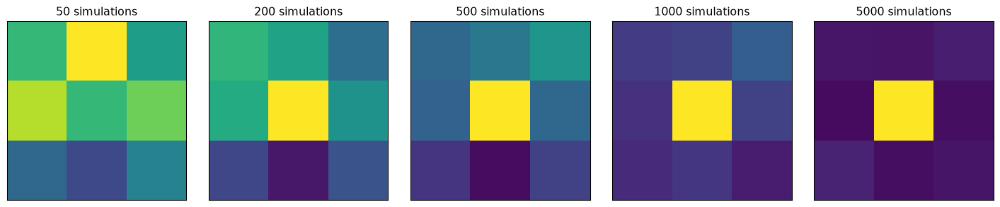

In [38]:
game = TicTacToe()

mcts_heatmaps(
    game,
    solver_class=MCTSClassicSolver,
    simulations_list=[50, 200, 500, 1000, 5000],
    player="X",
)

`num_simulations` $\in$ 50, 200, 500, 1000, 5000.

## Décomptes par premier coup de X

In [39]:
def tally_scores(game):
    """
    Énumérer tous les jeux complets de Tic-Tac-Toe depuis la position initiale
    (X doit jouer) et compter combien se terminent par :

        - victoire de X
        - match nul
        - victoire de O

    Retourne
    -------
    overall : dict
        {'X': total_victoires_X, 'draw': total_matchs_nuls, 'O': total_victoires_O}

    table : list[list[dict]]
        Une liste 3x3 de dictionnaires. Pour chaque case (i, j),
        table[i][j] = {'X': ..., 'draw': ..., 'O': ...}
        compte les jeux où le *premier coup* de X était à (i, j).
    """

    size = game.size  # devrait être 3 pour le Tic-Tac-Toe standard

    # Décomptes globaux pour tous les jeux
    overall = {'X': 0, 'draw': 0, 'O': 0}

    # Décomptes par premier coup sous forme de grille 3x3
    table = [
        [ {'X': 0, 'draw': 0, 'O': 0} for _ in range(size) ]
        for _ in range(size)
    ]

    def recurse(state, player, first_move):

        """
        Énumération en profondeur de tous les jeux complets.

        Paramètres
        ----------
        state : position du plateau (tableau NumPy)
        player : 'X' ou 'O' (joueur à jouer)
        first_move : None, ou (ligne, colonne) du tout premier coup de X
        """

        # Cas de base : état terminal → classer le résultat

        if game.is_terminal(state):
            v = game.evaluate(state)  # +1 (victoire de X), -1 (victoire de O), 0 (match nul)

            if v > 0:
                outcome = 'X'
            elif v < 0:
                outcome = 'O'
            else:
                outcome = 'draw'

            # Mettre à jour le décompte global
            overall[outcome] += 1

            # Si nous connaissons le premier coup de X, mettre à jour le décompte de cette case aussi
            if first_move is not None:
                i, j = first_move
                table[i][j][outcome] += 1

            return

        # Cas récursif : étendre tous les coups légaux
        for move in game.get_valid_moves(state):
            next_state = game.make_move(state, move, player)
            next_player = game.get_opponent(player)

            # Enregistrer le tout premier coup de X
            if first_move is None and player == "X":
                fm = move  # cela devient le first_move pour le reste de cette branche
            else:
                fm = first_move

            recurse(next_state, next_player, fm)

    # Commencer par le plateau vide, X doit jouer, et pas de first_move encore
    initial_state = game.initial_state()
    recurse(initial_state, player="X", first_move=None)

    return overall, table

def print_tally_table(table):

    """
    Imprimer une table 3x3 des décomptes.

    Chaque case montre : X:<victoires> D:<matchs nuls> O:<victoires>
    où les comptes sont restreints aux jeux où le premier coup de X
    a été joué dans cette case.
    """

    size = len(table)
    for i in range(size):
        row_cells = []
        for j in range(size):
            stats = table[i][j]
            cell_str = f"X:{stats['X']} D:{stats['draw']} O:{stats['O']}"
            row_cells.append(cell_str)
        print(" | ".join(row_cells))
    print()

def print_tally_table_percentages(table):

    """
    Imprimer une table 3x3 des décomptes en pourcentages.

    Chaque case montre : X:<victoires> D:<matchs nuls> O:<victoires>
    où les comptes sont restreints aux jeux où le premier coup de X
    a été joué dans cette case.
    """

    size = len(table)
    for i in range(size):
        row_cells = []
        for j in range(size):
            stats = table[i][j]
            cell_str = f"X:{stats['X']/255168:.2%} D:{stats['draw']/255168:.2%} O:{stats['O']/255168:.2%}"
            row_cells.append(cell_str)
        print(" | ".join(row_cells))
    print()

game = TicTacToe()

overall, table = tally_scores(game)

print("Décompte global :")
print(overall)  # {'X': ..., 'draw': ..., 'O': ...}

print("\nDécomptes par premier coup de X (grille 3x3, X/draw/O) :")
print_tally_table(table)

print("\nDécomptes par premier coup de X (grille 3x3, X/draw/O) en pourcentages :")
print_tally_table_percentages(table)

**Décompte global** :

{‘X’: 131184, ‘draw’: 46080, ‘O’: 77904}

{‘X’: 51.41%, ‘draw’: 18.06%, ‘O’: 30.53%}

**Décomptes par premier coup de X (grille 3x3)** :

|                  |                  |                  |
|------------------|------------------|------------------|
| 14652/5184/7896  | 14232/5184/10176 | 14652/5184/7896  |
| 14232/5184/10176 | 15648/4608/5616  | 14232/5184/10176 |
| 14652/5184/7896  | 14232/5184/10176 | 14652/5184/7896  |

**Décomptes par premier coup de X (grille 3x3) en pourcentage :**

|                       |                       |                       |
|-----------------------|-----------------------|-----------------------|
| 5.74% / 2.03% / 3.09% | 5.58% / 2.03% / 3.99% | 5.74% / 2.03% / 3.09% |
| 5.58% / 2.03% / 3.99% | 6.13% / 1.81% / 2.20% | 5.58% / 2.03% / 3.99% |
| 5.74% / 2.03% / 3.09% | 5.58% / 2.03% / 3.99% | 5.74% / 2.03% / 3.09% |

## `evaluate_solvers_with_plot`

In [40]:
def evaluate_solvers_with_plot(game, solver_X, solver_O, num_games):
    """
    Jouer 'num_games' parties entre solver_X (comme 'X') et solver_O (comme 'O'),
    suivre la performance cumulative et tracer les scores moyens en cours.

    Le score est du point de vue de X :
        résultat = +1  si X gagne
        résultat = -1  si O gagne
        résultat =  0  si match nul

    Le score moyen en cours pour O est simplement le négatif du
    score moyen en cours de X (somme nulle).
    """

    runner = GameRunner(game)

    # Compteurs pour le résumé final
    results = {
        "X_wins": 0,
        "O_wins": 0,
        "draws": 0,
    }

    # Pour le traçage : score moyen en cours en fonction de l'indice du jeu
    avg_scores_X = []
    avg_scores_O = []

    cumulative_score_X = 0.0

    for i in range(num_games):
        outcome = runner.play_game(solver_X, solver_O)
        # Mettre à jour les compteurs de victoires/matchs nuls
        if outcome == 1:
            results["X_wins"] += 1
        elif outcome == -1:
            results["O_wins"] += 1
        else:
            results["draws"] += 1

        # Mettre à jour le score cumulatif (du point de vue de X)
        cumulative_score_X += outcome
        avg_X = cumulative_score_X / (i + 1)
        avg_O = -avg_X  # somme nulle

        avg_scores_X.append(avg_X)
        avg_scores_O.append(avg_O)

    # Tracer les scores moyens en cours
    games = range(1, num_games + 1)
    plt.figure(figsize=(8, 4))
    plt.plot(games, avg_scores_X, label=f"X : {solver_X.get_name()}")
    plt.plot(games, avg_scores_O, label=f"O : {solver_O.get_name()}")
    plt.axhline(0.0, linestyle="--", linewidth=1)
    plt.xlabel("Numéro du jeu")
    plt.ylabel("Score moyen")
    plt.title("Score moyen en cours (point de vue de X)")
    plt.legend()
    plt.tight_layout()
    plt.show()

    return results, avg_scores_X, avg_scores_O

## Aléatoire vs MCTS

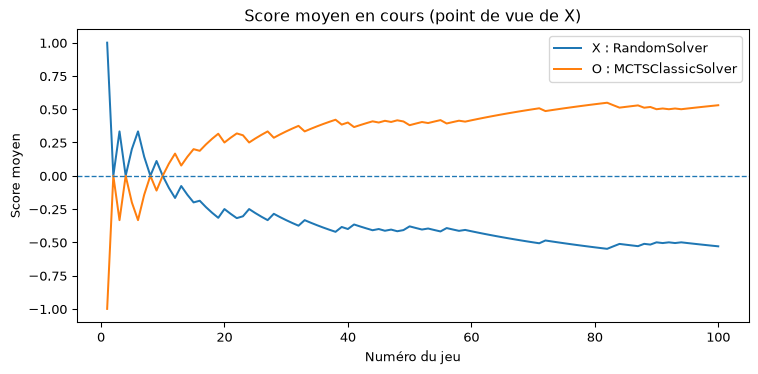

{'X_wins': 19, 'O_wins': 72, 'draws': 9}

In [41]:
rand = RandomSolver(seed=0)
mcts = MCTSClassicSolver(num_simulations=10, seed=1)

results, _, _ = evaluate_solvers_with_plot(game, rand, mcts, num_games=100)
results

`num_simulations=10`

## Aléatoire vs MCTS

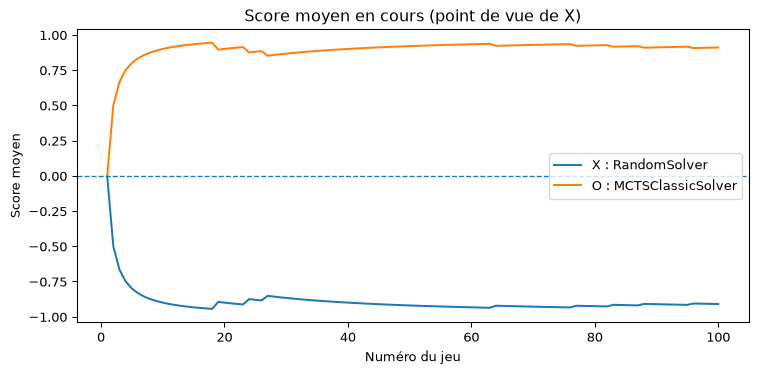

{'X_wins': 0, 'O_wins': 91, 'draws': 9}

In [42]:
rand = RandomSolver(seed=0)
mcts = MCTSClassicSolver(num_simulations=100, seed=1)

results, _, _ = evaluate_solvers_with_plot(game, rand, mcts, num_games=100)
results

`num_simulations=100`

En guise d’exercice, modifiez la valeur du paramètre `exploration`. Que
se passe-t-il lorsque `exploration_c` est fixé à `math.sqrt(2)/2` ?

## MCTS vs Aléatoire

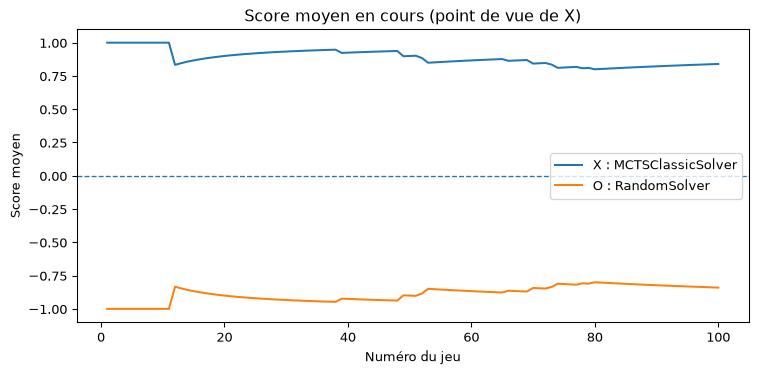

{'X_wins': 89, 'O_wins': 5, 'draws': 6}

In [43]:
mcts = MCTSClassicSolver(num_simulations=10, seed=0)
rand = RandomSolver(seed=0)

results, _, _ = evaluate_solvers_with_plot(game, mcts, rand, num_games=100)
results

`num_simulations=10`

## MCTS vs Aléatoire

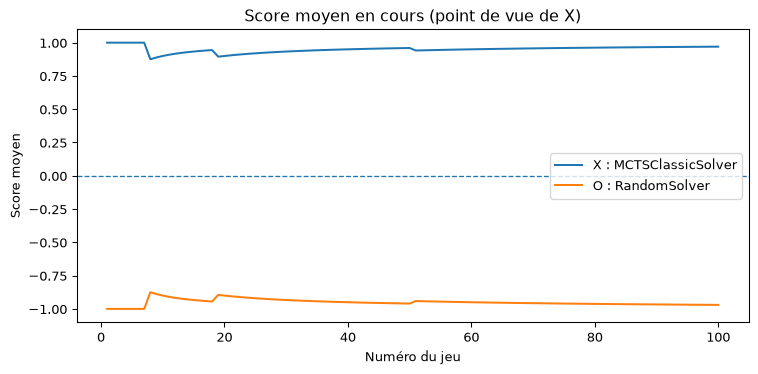

{'X_wins': 97, 'O_wins': 0, 'draws': 3}

In [44]:
mcts = MCTSClassicSolver(num_simulations=100, seed=0)
rand = RandomSolver(seed=0)

results, _, _ = evaluate_solvers_with_plot(game, mcts, rand, num_games=100)
results

`num_simulations=100`

## Minimax vs MCTS

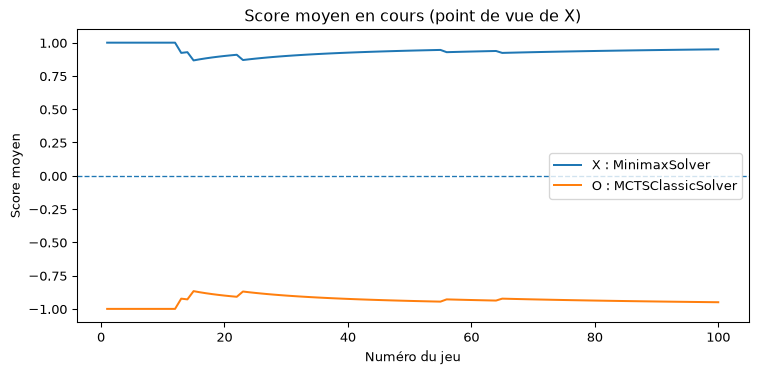

{'X_wins': 95, 'O_wins': 0, 'draws': 5}

In [45]:
minimax = MinimaxSolver()
mcts = MCTSClassicSolver(num_simulations=10, seed=2)

results, _, _ = evaluate_solvers_with_plot(game, minimax, mcts, num_games=100)
results

`num_simulations=10`

## Minimax vs MCTS

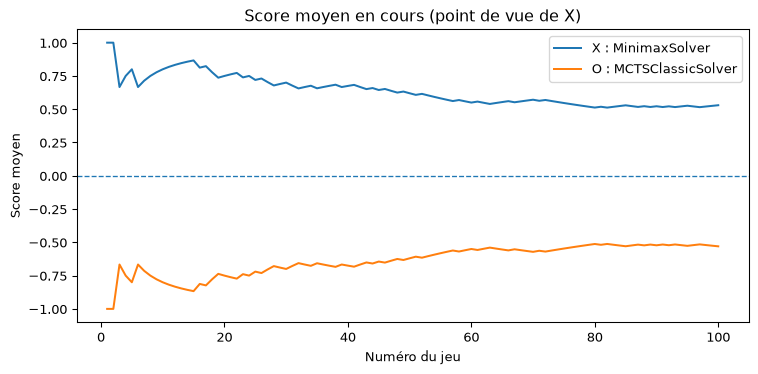

{'X_wins': 53, 'O_wins': 0, 'draws': 47}

In [46]:
minimax = MinimaxSolver()
mcts = MCTSClassicSolver(num_simulations=100, seed=2)

results, _, _ = evaluate_solvers_with_plot(game, minimax, mcts, num_games=100)
results

`num_simulations=100`

## Minimax vs MCTS

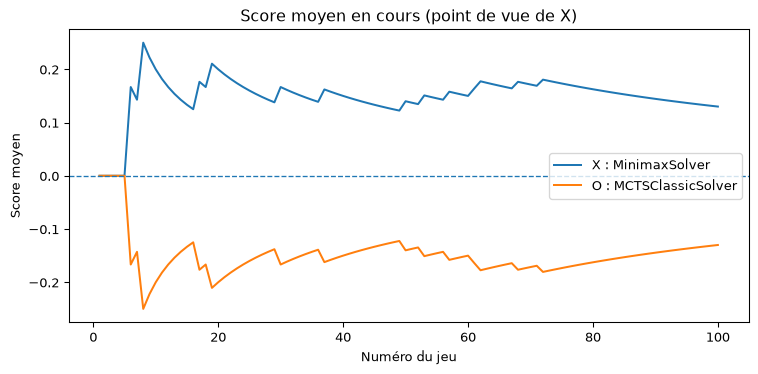

{'X_wins': 13, 'O_wins': 0, 'draws': 87}

In [47]:
minimax = MinimaxSolver()
mcts = MCTSClassicSolver(num_simulations=500, seed=2)

results, _, _ = evaluate_solvers_with_plot(game, minimax, mcts, num_games=100)
results

`num_simulations=500`

## MCTS vs Minimax

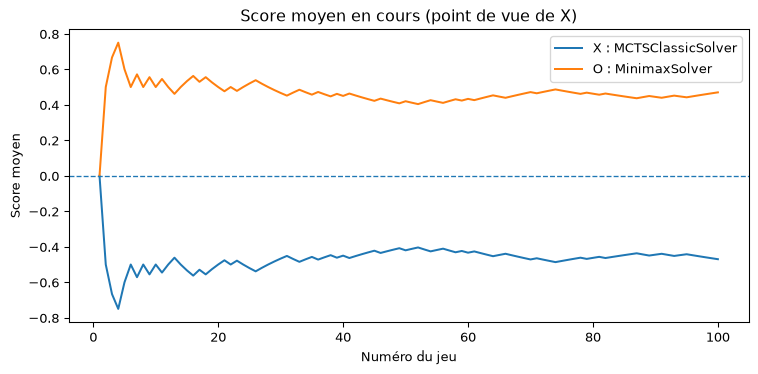

{'X_wins': 0, 'O_wins': 47, 'draws': 53}

In [48]:
mcts = MCTSClassicSolver(num_simulations=10, seed=2)
minimax = MinimaxSolver()

results, _, _ = evaluate_solvers_with_plot(game, mcts, minimax, num_games=100)
results

`num_simulations=10`

## MCTS vs Minimax

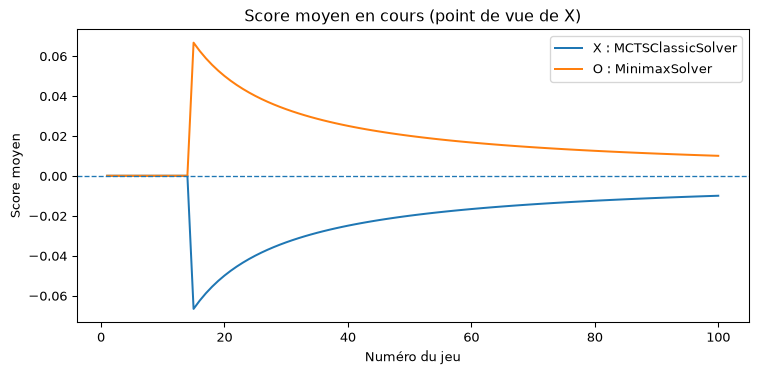

{'X_wins': 0, 'O_wins': 1, 'draws': 99}

In [49]:
mcts = MCTSClassicSolver(num_simulations=100, seed=2)
minimax = MinimaxSolver()

results, _, _ = evaluate_solvers_with_plot(game, mcts, minimax, num_games=100)
results

`num_simulations=100`

## MCTS vs Minimax

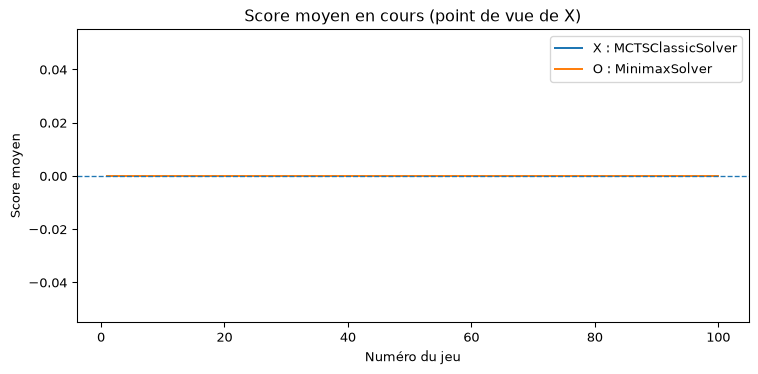

{'X_wins': 0, 'O_wins': 0, 'draws': 100}

In [50]:
mcts = MCTSClassicSolver(num_simulations=500, seed=2)
minimax = MinimaxSolver()

results, _, _ = evaluate_solvers_with_plot(game, mcts, minimax, num_games=100)
results

`num_simulations=500`

## MCTS (peu de simulations) vs MCTS (peu de simulations)

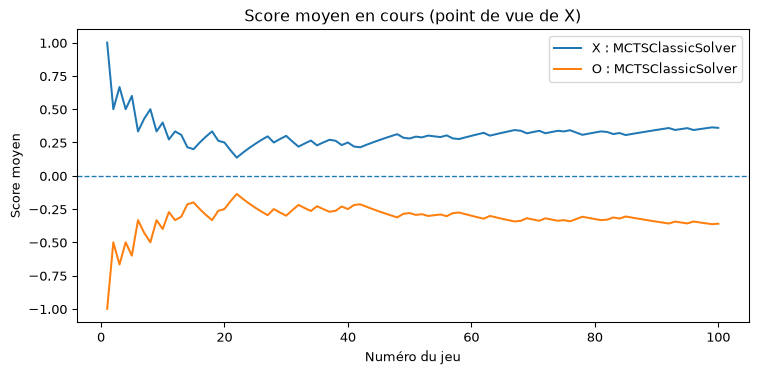

{'X_wins': 60, 'O_wins': 24, 'draws': 16}

In [51]:
mcts_a = MCTSClassicSolver(num_simulations=10, seed=3)
mcts_b = MCTSClassicSolver(num_simulations=10, seed=4)

results, _, _ = evaluate_solvers_with_plot(game, mcts_a, mcts_b, num_games=100)
results

## MCTS (peu de simulations) vs MCTS (beaucoup de simulations)

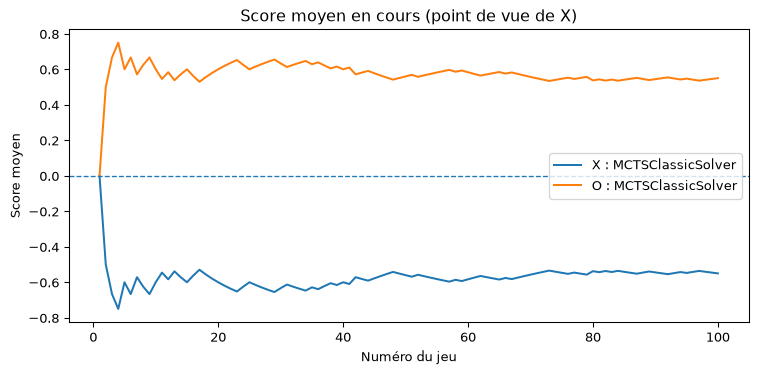

{'X_wins': 2, 'O_wins': 57, 'draws': 41}

In [52]:
mcts_a = MCTSClassicSolver(num_simulations=10, seed=3)
mcts_b = MCTSClassicSolver(num_simulations=500, seed=4)

results, _, _ = evaluate_solvers_with_plot(game, mcts_a, mcts_b, num_games=100)
results

## Apprentissage à travers les actions et les jeux

In [53]:
class MCTSSolver(Solver):

    """
    Solveur de recherche arborescente de Monte Carlo pour des jeux déterministes,
    à somme nulle, à deux joueurs comme le Tic-Tac-Toe.

    Idées clés :
    - Le solveur maintient un arbre de recherche indexé par canonical(state).
    - Chaque nœud stocke :
        * N : nombre de visites
        * W : récompense totale du point de vue du joueur qui doit jouer à
             ce nœud (positif est bon pour ce joueur)
        * children : mappage move -> child_state_key
        * untried_moves : actions qui n'ont pas encore été développés
        * player : le joueur qui doit jouer à ce nœud ("X" ou "O")
    - select_move() :
        * S'assure que l'état actuel est dans l'arbre.
        * Exécute un nombre fixe de simulations à partir de la racine actuelle.
        * Retourne l'action menant à l'enfant le plus visité.
    - opponent_played(move) :
        * Avance la racine interne le long du mouvement réellement joué
          (si ce mouvement a été exploré).
        * Cela permet au solveur de réutiliser les statistiques de recherche à travers les mouvements
          et à travers les jeux.
    """

    def __init__(self, num_simulations=500, exploration_c=math.sqrt(2), seed=None):

        """
        Paramètres
        ----------
        num_simulations : int
            Nombre de simulations MCTS à exécuter par mouvement.
        exploration_c : float
            Constante d'exploration 'c' dans la formule UCT.
        seed : int ou None
            Graine aléatoire optionnelle pour la reproductibilité.
        """
        self.num_simulations = num_simulations
        self.exploration_c = exploration_c
        self.rng = random.Random(seed)

        # L'arbre de recherche : dictionnaire state_key -> node
        self.tree = {}

        # Racine actuelle dans l'arbre
        self.root_key = None   # canonical(state)
        self.root_player = None  # joueur qui doit jouer à la racine ("X" ou "O")

        # Référence du jeu (définie lors du premier select_move)
        self.game = None

    # -----------------------------
    # API publique
    # -----------------------------
    def select_move(self, game, state, player):
        """
        Choisir un mouvement pour 'player' à partir de 'state' en utilisant la recherche arborescente de Monte Carlo.

        Cette méthode :
        1. Synchronise la racine interne avec l'état fourni.
        2. Exécute un nombre fixe de simulations MCTS depuis la racine.
        3. Retourne le mouvement menant à l'enfant avec le plus grand nombre de visites.
        """
        self.game = game

        state_key = canonical(state)

        # S'assurer que la racine de l'arbre correspond à l'état actuel.
        # Si cet état a été vu auparavant, nous réutilisons son nœud et ses statistiques.
        self.root_key = state_key
        self.root_player = player
        self._get_or_create_node(state_key, player)

        # Exécuter les simulations MCTS à partir de la racine actuelle
        for _ in range(self.num_simulations):
            self._run_simulation()

        # Après les simulations, choisir l'enfant avec le plus grand nombre de visites.
        root_node = self.tree[self.root_key]

        if not root_node["children"]:
            # Pas d'enfants : doit être un état terminal ou pas de mouvements légaux.
            # Revenir à un mouvement valide (ou lever une erreur) ; ici nous choisissons au hasard.
            moves = self.game.get_valid_moves(np.array(self.root_key))
            return self.rng.choice(moves)

        best_move = None
        best_visits = -1

        for move, child_key in root_node["children"].items():
            child = self.tree[child_key]
            if child["N"] > best_visits:
                best_visits = child["N"]
                best_move = move

        return best_move

    def opponent_played(self, move):
        """
        Mettre à jour la racine interne en fonction du mouvement de l'adversaire.

        Cela est appelé par GameRunner après que l'autre joueur a effectué un mouvement.

        Nous essayons de déplacer la racine vers le nœud enfant correspondant :
        - Si le mouvement a été exploré, nous réutilisons ce sous-arbre.
        - Sinon, nous créons un nouveau nœud pour l'état résultant.
        """
        # Si nous n'avons pas encore de racine ou de référence de jeu, rien à faire.
        if self.root_key is None or self.game is None:
            return

        root_node = self.tree.get(self.root_key)
        if root_node is None:
            # Ne devrait pas arriver, mais soyons robustes.
            self.root_key = None
            self.root_player = None
            return

        # Si nous avons déjà exploré ce mouvement depuis la racine, juste descendre l'arbre.
        if move in root_node["children"]:
            child_key = root_node["children"][move]
            self.root_key = child_key
            self.root_player = self.tree[child_key]["player"]
            return

        # Sinon, nous devons appliquer le mouvement sur le plateau et créer un nouveau nœud.
        state = np.array(self.root_key)
        player_who_played = root_node["player"]
        next_state = self.game.make_move(state, move, player_who_played)
        next_key = canonical(next_state)
        next_player = self.game.get_opponent(player_who_played)

        self.root_key = next_key
        self.root_player = next_player
        self._get_or_create_node(next_key, next_player)

    # -----------------------------
    # Aides internes
    # -----------------------------
    
    def _get_or_create_node(self, state_key, player_to_move):
        """
        S'assurer qu'un nœud pour 'state_key' existe dans l'arbre.

        S'il n'est pas présent, le créer avec :
        - N = 0, W = 0
        - untried_moves = tous les mouvements valides depuis cet état
        - children = {}
        - player = player_to_move
        """
        if state_key not in self.tree:
            state = np.array(state_key)
            self.tree[state_key] = {
                "N": 0,  # nombre de visites
                "W": 0.0,  # récompense totale du point de vue du joueur du nœud
                "children": {},  # move -> child_state_key
                "untried_moves": self.game.get_valid_moves(state),
                "player": player_to_move,
            }
        return self.tree[state_key]

    def _run_simulation(self):
        """
        Effectuer une simulation MCTS à partir de la racine actuelle :

        1. SÉLECTION :
           Suivre l'arbre en utilisant UCT jusqu'à atteindre un nœud avec des untried_moves
           ou un état terminal.
        2. EXPANSION :
           Si le nœud a des untried_moves et n'est pas terminal, développer un mouvement.
        3. DÉROULEMENT :
           À partir de la nouvelle feuille, jouer des mouvements aléatoires jusqu'à un état terminal.
        4. RÉTROPROPAGATION :
           Propager le résultat final le long du chemin visité.
        """
        if self.root_key is None:
            return  # rien à faire

        state_key = self.root_key
        state = np.array(state_key)

        path = []  # liste des state_keys visités lors de cette simulation

        # -------------------------
        # 1–2. Sélection & Expansion
        # -------------------------
        while True:
            path.append(state_key)
            node = self.tree[state_key]

            # Si c'est un état terminal, arrêter et évaluer directement.
            if self.game.is_terminal(state):
                outcome = self.game.evaluate(state)  # du point de vue de X
                break

            # S'il y a des mouvements non essayés, en développer un.
            if node["untried_moves"]:
                move = node["untried_moves"].pop()
                next_state = self.game.make_move(state, move, node["player"])
                next_key = canonical(next_state)
                next_player = self.game.get_opponent(node["player"])

                # Créer le nœud enfant s'il n'existe pas encore.
                self._get_or_create_node(next_key, next_player)

                # Lier l'enfant dans l'arbre
                node["children"][move] = next_key

                # Le déroulement commence à partir de ce nouveau nœud feuille.
                state_key = next_key
                state = next_state
                path.append(state_key)

                outcome = self._rollout(state, next_player)
                break

            # Sinon, le nœud est complètement développé : sélectionner un enfant en utilisant UCT.
            move, child_key = self._select_child(node)
            state_key = child_key
            state = np.array(state_key)

        # -------------------------
        # 4. Rétropropagation
        # -------------------------
        self._backpropagate(path, outcome)

    def _select_child(self, node):
        """
        Sélectionner un enfant de 'node' en utilisant la règle UCT (Upper Confidence Bound).

        Score UCT du point de vue du joueur à 'node' :

            score(child) = mean_reward_from_node_perspective
                           + c * sqrt( ln(N_parent + 1) / N_child )

        Remarque :
        - Chaque enfant stocke W et N de la perspective de son propre joueur.
        - Nous convertissons la valeur de l'enfant à la perspective du parent en inversant
          le signe, car le joueur enfant est toujours l'adversaire du joueur parent
          dans un jeu à deux joueurs alternant.
        """
        parent_visits = node["N"]
        parent_player = node["player"]

        best_move = None
        best_child_key = None
        best_score = -math.inf

        for move, child_key in node["children"].items():
            child = self.tree[child_key]

            if child["N"] == 0:
                # Encourager l'exploration des enfants non visités au moins une fois.
                uct_score = math.inf
            else:
                # Récompense moyenne du point de vue du joueur de l'enfant.
                avg_child_reward = child["W"] / child["N"]

                # Convertir à la perspective du parent.
                # Les joueurs parent et enfant sont toujours des adversaires ici.
                reward_from_parent_perspective = -avg_child_reward

                uct_score = (
                    reward_from_parent_perspective
                    + self.exploration_c
                    * math.sqrt(math.log(parent_visits + 1) / child["N"])
                )

            if uct_score > best_score:
                best_score = uct_score
                best_move = move
                best_child_key = child_key

        return best_move, best_child_key

    def _rollout(self, state, player_to_move):
        """
        Effectuer un déroulement aléatoire (simulation) à partir de 'state' jusqu'à un état terminal.

        Paramètres
        ----------
        state : tableau NumPy
            Position actuelle du plateau.
        player_to_move : str
            Joueur à jouer ("X" ou "O") au début de ce déroulement.

        Renvoie
        -------
        outcome : int
            Résultat final du jeu du point de vue de X :
            +1 (X gagne), -1 (O gagne), ou 0 (match nul).
        """
        current_state = state.copy()
        current_player = player_to_move

        # Jouer des mouvements aléatoires jusqu'à la fin du jeu.
        while not self.game.is_terminal(current_state):
            moves = self.game.get_valid_moves(current_state)
            move = self.rng.choice(moves)
            current_state = self.game.make_move(current_state, move, current_player)
            current_player = self.game.get_opponent(current_player)

        return self.game.evaluate(current_state)  # +1, -1, ou 0 du point de vue de X

    def _backpropagate(self, path, outcome):
        """
        Rétropropager le résultat final le long du chemin de simulation.

        Paramètres
        ----------
        path : liste de state_keys
            La séquence d'états visités de la racine à la feuille.
        outcome : int
            Résultat final du point de vue de X : +1, -1, ou 0.

        Pour chaque nœud sur le chemin :
        - Nous convertissons 'outcome' à la perspective du joueur de ce nœud :
              reward = outcome   si player == "X"
                     = -outcome  si player == "O"
        - Puis mettre à jour :
              node.N += 1
              node.W += reward
        """
        for state_key in path:
            node = self.tree[state_key]
            player = node["player"]

            # Convertir le résultat de la perspective de X à la perspective de ce nœud.
            if player == "X":
                reward = outcome
            else:
                reward = -outcome

            node["N"] += 1
            node["W"] += reward

## Même budget de calcul

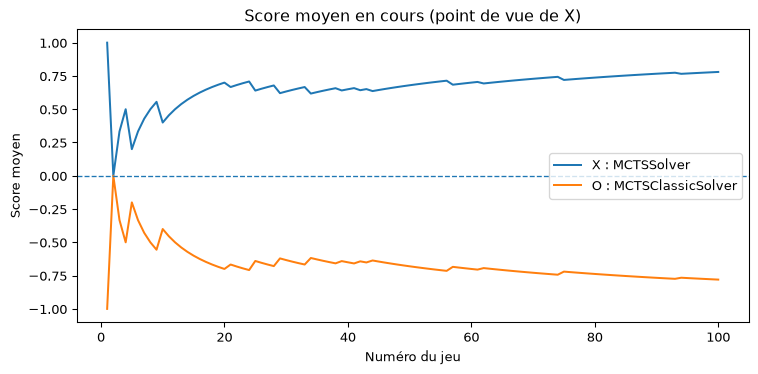

{'X_wins': 86, 'O_wins': 8, 'draws': 6}

In [54]:
mcts_a = MCTSSolver(num_simulations=10, seed=3)
mcts_c = MCTSClassicSolver(num_simulations=10, seed=4)
results, _, _ = evaluate_solvers_with_plot(game, mcts_a, mcts_c, num_games=100)
results

## Apprenant vs Penseur

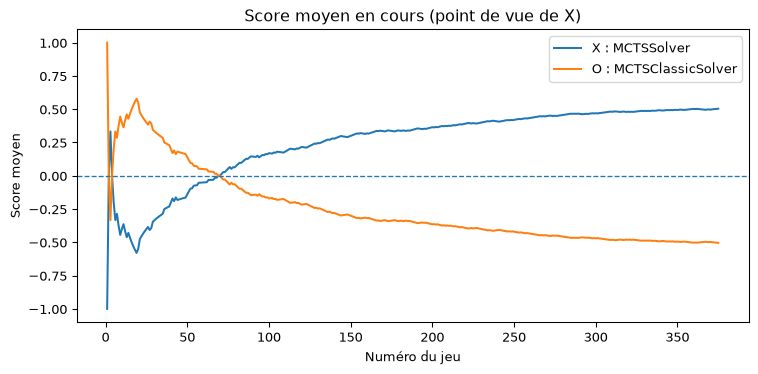

{'X_wins': 207, 'O_wins': 18, 'draws': 150}

In [55]:
a = MCTSSolver(num_simulations=10, seed=3)
b = MCTSClassicSolver(num_simulations=40, seed=4)

results, _, _ = evaluate_solvers_with_plot(game, a, b, num_games=375)
results

Dans cet exemple, le `MCTSSolver` exécute un nombre limité de
simulations, mais accumule de l’apprentissage au fil des mouvements et
des jeux successifs. En revanche, le `MCTSClassicSolver` dispose d’un
budget de calcul plus important, lui permettant d’effectuer un plus
grand nombre de simulations. Initialement, le `MCTSClassicSolver`
démontre une performance supérieure pendant environ les 75 premiers
jeux. Cependant, à mesure que le `MCTSSolver` acquiert de l’expérience
et que son nombre de simulations se rapproche de celui du
`MCTSClassicSolver`, sa performance s’améliore progressivement.

## Apprenant vs Minimax

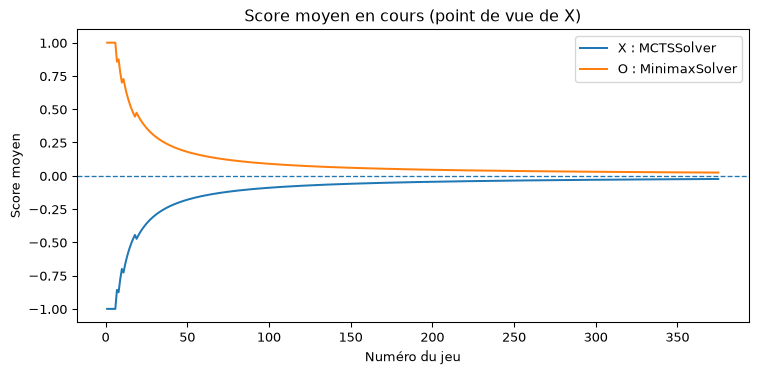

{'X_wins': 0, 'O_wins': 9, 'draws': 366}

In [56]:
a = MCTSSolver(num_simulations=10, seed=3)
b = MinimaxSolver()

results, _, _ = evaluate_solvers_with_plot(game, a, b, num_games=375)
results

## Apprenant vs Minimax

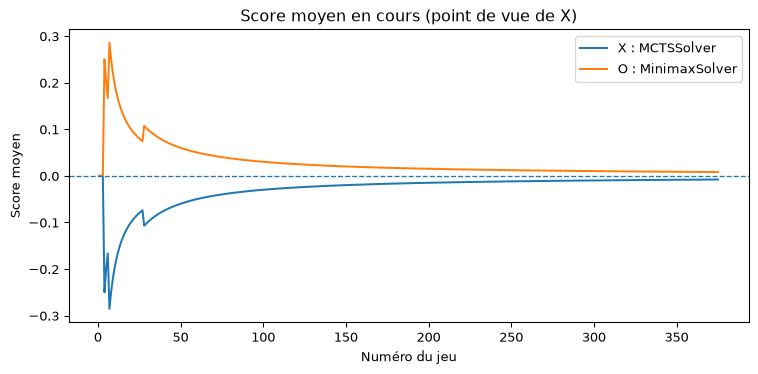

{'X_wins': 0, 'O_wins': 3, 'draws': 372}

In [57]:
a = MCTSSolver(num_simulations=20, seed=3)
b = MinimaxSolver()

results, _, _ = evaluate_solvers_with_plot(game, a, b, num_games=375)
results

## Apprenant vs Minimax

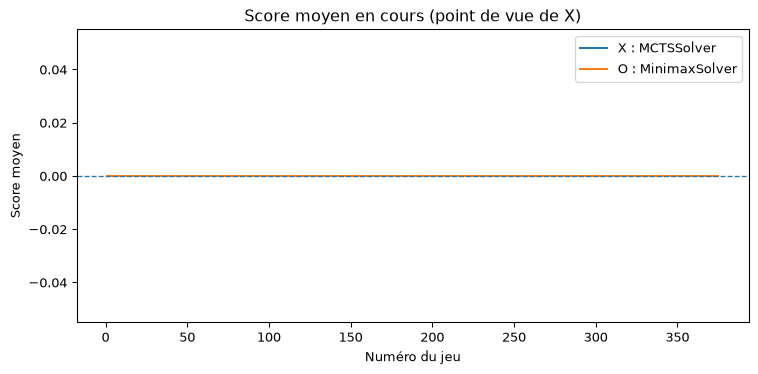

{'X_wins': 0, 'O_wins': 0, 'draws': 375}

In [58]:
a = MCTSSolver(num_simulations=50, seed=3)
b = MinimaxSolver()

results, _, _ = evaluate_solvers_with_plot(game, a, b, num_games=375)
results

## Exploration

- Incorporer des heuristiques pour détecter quand un **coup gagnant est
  réalisable en un seul mouvement**.

- Expérimenter avec la variation du nombre d’itérations et de la
  **constante** $C$.

## Recherche arborescente de Monte Carlo

**Où nous en sommes maintenant : MCTS simple**

- Nous savons déjà :
  - Un **arbre de recherche** des positions du Tic-Tac-Toe
  - Les nœuds stockent :
    - Le nombre de visites
    - Le résultat moyen des parties depuis cette position
  - MCTS utilise cet arbre pour choisir les mouvements

## Recherche arborescente de Monte Carlo

- Dans notre code actuel :
  - **Sélection** : suivre l’arbre (UCT) vers les nœuds prometteurs
  - **Expansion** : ajouter un nouveau nœud enfant
  - **Simulation** : jouer des **mouvements aléatoires** jusqu’à la fin
    de la partie
  - **Rétropropagation** : renvoyer le résultat final dans l’arbre

## Recherche arborescente de Monte Carlo

- Cela fonctionne très bien pour le Tic-Tac-Toe, mais :
  - Les simulations aléatoires peuvent être lentes et bruyantes dans des
    jeux plus grands
  - L’arbre ne “sait” rien **avant** que la recherche ne commence

## Ajouter un réseau de politique

**Objectif :** donner à MCTS une **meilleure idée des mouvements à
explorer en premier**.

**Nouveau composant : réseau de politique**

- Entrée : une position sur le plateau
- Sortie : une **probabilité pour chaque mouvement légal**
  - “Dans cette position, le mouvement A semble à 40 %, le mouvement B à
    30 %, le mouvement C à 10 %, …”

*policy network*

## Ajouter un réseau de politique

Utilisation dans MCTS :

- Dans un **nouveau nœud** (lorsque nous développons un état) :
  1.  Appeler le **réseau de politique** sur le plateau
  2.  Stocker les probabilités de mouvements comme **priors** pour ce
      nœud
- Pendant la **sélection** :
  - MCTS utilise toujours les comptes de visites de l’arbre
  - Mais maintenant, il utilise aussi les priors de politique pour
    préférer les mouvements qui semblent bons selon le réseau

*policy network*

## Ajouter un réseau de valeur

**Objectif :** éviter les longues simulations aléatoires et obtenir une
**estimation directe** de la qualité d’une position.

**Nouveau composant : réseau de valeur**

- Entrée : une position sur le plateau
- Sortie : un seul nombre :
  - Proche de +1 si X est susceptible de gagner  
  - Proche de -1 si O est susceptible de gagner  
  - Environ 0 pour un match nul probable

*value network*

## Ajouter un réseau de valeur

Utilisation dans MCTS :

- À un **nœud feuille** (frontière de l’arbre) :
  - Au lieu de faire une simulation aléatoire :
    1.  Appeler le **réseau de valeur** sur le plateau
    2.  Utiliser sa sortie comme valeur de la feuille
    3.  Rétropropager cette valeur dans l’arbre

*value network*

## AlphaTicTacToe

Assembler le tout (style AlphaGo “AlphaTicTacToe”) :

- MCTS + **réseau de politique** :
  - Guide les mouvements à explorer
- MCTS + **réseau de valeur** :
  - Évalue les positions sans simulations aléatoires
- Au fil du temps, les deux réseaux peuvent être entraînés à partir de
  parties d’exemples (par exemple, auto-jeu) :
  - Le réseau de politique apprend les “bons mouvements”  
  - Le réseau de valeur apprend les “bonnes positions”

Apprendre l’apprentissage par renforcement confortablement prend environ
un semestre. Cependant, en pratique, des systèmes comme
AlphaGo/AlphaZero combinent **recherche arborescente de Monte Carlo
(MCTS)** avec des **réseaux neuronaux profonds** qui produisent une
politique (mouvements prometteurs) et une valeur (qualité d’une
position). Ces réseaux sont entraînés à partir de **parties
auto-jouées**, utilisant les résultats des jeux comme signal de
récompense. Ce cycle, *agir, observer les résultats, mettre à jour la
politique/valeur pour faire mieux la prochaine fois*, est exactement ce
que nous appelons **l’apprentissage par renforcement**.

Dans des travaux ultérieurs, AlphaGo Zero et AlphaZero utilisent **un**
réseau neuronal avec **deux sorties** (politique et valeur). Cela
simplifie l’architecture.

# Prologue

## Logique et apprentissage

![](https://media.nature.com/w1248/magazine-assets/d41586-025-03856-1/d41586-025-03856-1_51751376.jpg?as=webp)

[This AI combo could unlock human-level
intelligence](https://www.nature.com/articles/d41586-025-03856-1),
Nature News, 2025-11-25.

J’avais initialement l’intention de développer une ou deux présentations
centrées sur l’intégration du raisonnement formel et de l’apprentissage
profond ; cependant, ce projet n’a pas abouti. À la place, je vous
invite à lire cet article concis, qui explore pourquoi de nombreux
experts soutiennent que l’incorporation de méthodes symboliques dans les
réseaux neuronaux pourrait être l’approche la plus efficace, ou
possiblement la seule, pour intégrer des capacités de raisonnement
logique dans les systèmes d’intelligence artificielle.

![](https://media.nature.com/lw767/magazine-assets/d41586-025-03856-1/d41586-025-03856-1_51751370.jpg?as=webp)

## Le dernier devoir

### Transformer l’économie canadienne avec l’IA

Rédigez une proposition de 1 à 2 pages sur un domaine **économiquement**
pertinent et répondez aux questions suivantes :

- Quel(s) **algorithme(s)** du cours CSI 4506 est/sont approprié(s) ?
  Pourquoi ?
- Qu’est-ce qui rend le problème **computationalement difficile** ?
- Quelles **données** seraient nécessaires ?
- Comment évalueriez-vous le **succès** ?

Pour être clair, ce devoir est optionnel et n’est pas noté. Cependant,
si le sujet vous inspire, n’hésitez pas à m’envoyer votre proposition.
Les propositions exceptionnelles seront affichées dans une section
« *Hall of Fame* » du cours, avec ou sans votre nom, selon votre
préférence.

## Résumé

- La **recherche arborescente de Monte Carlo (MCTS)** est un algorithme
  de recherche utilisé pour la **prise de décision** dans des jeux
  complexes.
- MCTS fonctionne en quatre étapes principales : **Sélection**,
  **Expansion**, **Déroulement (Simulation)** et **Rétropropagation**.
- Il équilibre **exploration** et **exploitation** en utilisant la
  **formule UCB1**, qui guide la sélection des nœuds en fonction du
  nombre de visites et des scores.
- MCTS maintient un **arbre de recherche explicite**, mettant à jour les
  valeurs des nœuds de manière itérative en fonction des simulations.
- L’algorithme a des **applications variées**, y compris dans les jeux
  d’IA, la conception de médicaments, le routage de circuits et la
  conduite autonome.
- Introduit en 2008, MCTS a gagné en importance grâce à son utilisation
  dans AlphaGo en 2016.
- Contrairement aux algorithmes traditionnels comme $A^\star$, MCTS
  utilise des **politiques dynamiques** et exploite tous les nœuds
  visités pour la prise de décision.
- Mettre en œuvre MCTS implique de suivre les statistiques des nœuds et
  d’appliquer la formule **UCB1** pour **guider la recherche**.
- Un exemple pratique de MCTS est démontré à travers l’implémentation du
  **Tic-Tac-Toe**.
- Une exploration plus approfondie inclut l’intégration de **MCTS** avec
  des modèles d’**apprentissage profond** comme AlphaZero et MuZero.

## Exploration supplémentaire

- [Environnement natif JAX pour les
  simulations](https://github.com/sotetsuk/pgx)

- [AlphaZero](https://deepmind.google/discover/blog/alphazero-shedding-new-light-on-chess-shogi-and-go/)

- [MuZero](https://deepmind.google/discover/blog/muzero-mastering-go-chess-shogi-and-atari-without-rules/)

- [Gumbel](https://openreview.net/forum?id=bERaNdoegnO)

- [MCTS Tic-Tac-Toe avec
  visualisation](https://github.com/kevinzhangftw/Monte-Carlo-Tree-Search-Tic-Tac-Toe/tree/master)

## La fin

- Consultez le site web du cours pour obtenir des informations sur
  l’examen final.

## Références

Besta, Maciej, Julia Barth, Eric Schreiber, et al. 2025. *Reasoning
Language Models: A Blueprint*. <https://arxiv.org/abs/2501.11223>.

Browne, Cameron B., Edward Powley, Daniel Whitehouse, et al. 2012. « A
Survey of Monte Carlo Tree Search Methods ». *IEEE Transactions on
Computational Intelligence and AI in Games* 4 (1): 1‑43.
<https://doi.org/10.1109/TCIAIG.2012.2186810>.

Chaslot, Guillaume, Sander Bakkes, Istvan Szita, et Pieter Spronck.
2008. « Monte-Carlo Tree Search: a new framework for game AI ».
*Proceedings of the Fourth AAAI Conference on Artificial Intelligence
and Interactive Digital Entertainment* (Stanford, California), AIIDE’08,
216‑17.

Kemmerling, Marco, Daniel Lütticke, et Robert H. Schmitt. 2024. « Beyond
games: a systematic review of neural Monte Carlo tree search
applications ». *Applied Intelligence* 54 (1): 1020‑46.
<https://doi.org/10.1007/s10489-023-05240-w>.

Russell, Stuart, et Peter Norvig. 2020. *Artificial Intelligence: A
Modern Approach*. 4ᵉ éd. Pearson. <http://aima.cs.berkeley.edu/>.

Silver, David, Aja Huang, Chris J. Maddison, et al. 2016. « Mastering
the game of Go with deep neural networks and tree search ». *Nature* 529
(7587): 484‑89. <https://doi.org/10.1038/nature16961>.

Świechowski, Maciej, Konrad Godlewski, Bartosz Sawicki, et Jacek
Mańdziuk. 2023. « Monte Carlo Tree Search: a review of recent
modifications and applications ». *Artificial Intelligence Review* 56
(3): 2497‑562. <https://doi.org/10.1007/s10462-022-10228-y>.

# Annexe

## Intégration numérique

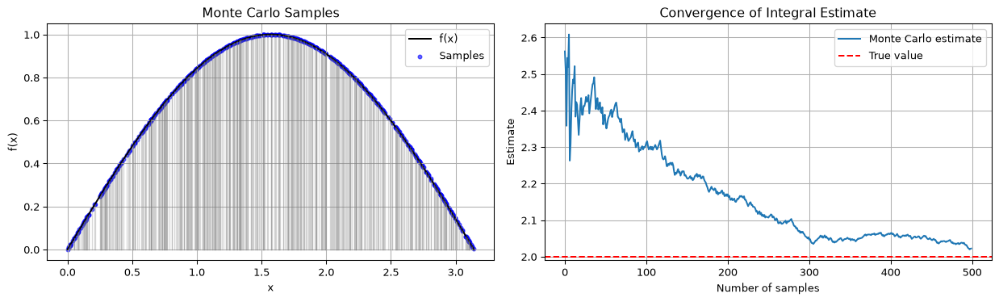

Final estimate ≈ 2.022106 (true = 2.0)

In [59]:
import random
import math

import numpy as np
import matplotlib.pyplot as plt

def monte_carlo_integrate_visual_with_sticks(f, a, b, n_samples, seed=None):

    """
    Monte Carlo integration visualization.
    Shows the function curve, sampled points, and vertical lines ("sticks").
    Also plots convergence of the Monte Carlo estimate.
    """

    if seed is not None:
        np.random.seed(seed)

    xs = np.random.uniform(a, b, size=n_samples)
    ys = f(xs)

    cumulative_avg = np.cumsum(ys) / np.arange(1, n_samples + 1)
    estimates = (b - a) * cumulative_avg

    fig, ax = plt.subplots(1, 2, figsize=(13, 4))

    # ----- Left panel: samples + vertical lines -----
    X = np.linspace(a, b, 400)
    ax[0].plot(X, f(X), color="black", label="f(x)")

    # Vertical lines
    for x_i, y_i in zip(xs, ys):
        ax[0].plot([x_i, x_i], [0, y_i], color="gray", alpha=0.3, linewidth=1)

    # Sampled points
    ax[0].scatter(xs, ys, s=12, color="blue", alpha=0.6, label="Samples")

    ax[0].set_title("Monte Carlo Samples")
    ax[0].set_xlabel("x")
    ax[0].set_ylabel("f(x)")
    ax[0].grid(True)
    ax[0].legend()

    # ----- Right panel: convergence -----
    true_value = 2.0  # ∫₀^π sin(x) dx
    ax[1].plot(estimates, label="Monte Carlo estimate")
    ax[1].axhline(true_value, linestyle="--", color="red", label="True value")

    ax[1].set_title("Convergence of Integral Estimate")
    ax[1].set_xlabel("Number of samples")
    ax[1].set_ylabel("Estimate")
    ax[1].grid(True)
    ax[1].legend()

    plt.tight_layout()
    plt.show()

    return estimates[-1]

def main():
    f = np.sin
    a, b = 0.0, math.pi
    n_samples = 500

    estimate = monte_carlo_integrate_visual_with_sticks(f, a, b, n_samples, seed=123)
    print(f"Final estimate ≈ {estimate:.6f} (true = 2.0)")

main()

## Intégration numérique

In [60]:
def monte_carlo_integrate(f, a, b, n_samples, seed=None):

    """
    Estimate ∫_a^b f(x) dx using simple Monte Carlo integration.

    Parameters
    ----------
    f : callable
        Function to integrate.
    a, b : float
        Integration bounds (a < b).
    n_samples : int
        Number of random samples to draw.
    seed : int or None
        Optional seed for reproducibility.

    Returns
    -------
    estimate : float
        Monte Carlo estimate of the integral.
    """

    if seed is not None:
        random.seed(seed)

    total = 0.0
    for _ in range(n_samples):
        x = random.uniform(a, b)
        total += f(x)

    return (b - a) * total / n_samples

def main():
    # Example: integrate f(x) = sin(x) on [0, π]
    f = math.sin
    a, b = 0.0, math.pi

    for n in [100, 1_000, 10_000, 100_000]:
        estimate = monte_carlo_integrate(f, a, b, n, seed=0)
        print(f"n = {n:6d} → estimate ≈ {estimate:.6f} (delta = {abs(2.0 - estimate):.6f})")

main()

n =    100 → estimate ≈ 2.080957 (delta = 0.080957)
n =   1000 → estimate ≈ 1.992136 (delta = 0.007864)
n =  10000 → estimate ≈ 2.007041 (delta = 0.007041)
n = 100000 → estimate ≈ 1.996149 (delta = 0.003851)

------------------------------------------------------------------------

Marcel **Turcotte**

<Marcel.Turcotte@uOttawa.ca>

École de **science informatique** et de génie électrique (**SI**GE)

Université d’Ottawa